In [9]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
import joblib

from sklearn.base import BaseEstimator, TransformerMixin

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

from sklearn.model_selection import train_test_split, learning_curve
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

from sklearn.metrics import classification_report
from sklearn.metrics import f1_score

from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [5]:
URL_TRAIN_CSV = 'train.csv'
URL_TEST_CSV = 'test.csv'
OUTPUT_SUB = 'submisison.csv'

## Предпросмотр каждого датасета - train and test

In [251]:
nothing = pd.read_csv(URL_TRAIN_CSV)
nan_info = nothing.isna().sum()
nan_columns_with_counts = nan_info[nan_info > 0]

print(f' общее колчиество объектов {len(nothing)}')
print(nan_columns_with_counts)

 общее колчиество объектов 7500
Annual Income                   1557
Years in current job             371
Months since last delinquent    4081
Bankruptcies                      14
Credit Score                    1557
dtype: int64


In [252]:
nothing = pd.read_csv(URL_TEST_CSV)
nan_info = nothing.isna().sum()
nan_columns_with_counts = nan_info[nan_info > 0]

print(f' общее колчиество объектов {len(nothing)}')
print(nan_columns_with_counts)

 общее колчиество объектов 2500
Annual Income                    513
Years in current job              86
Months since last delinquent    1358
Bankruptcies                       3
Credit Score                     513
dtype: int64


Признаки с nan что в testовом, что и в trainовом датасете одинаковы. Как итог можно создать простой pipeline для обработки только этих признаков и их nan

Особое рассмотрение требует признак Months since last delinquent, так как количество пропуском слишком значимо

## Исходный датасет

In [19]:
original_df = pd.read_csv(URL_TRAIN_CSV)
original_df.head(5)

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default
0,Own Home,482087.0,NaN,0.0,11.0,26.3,685960.0,1.0,NaN,1.0,debt consolidation,Short Term,99999999.0,47386.0,7914.0,749.0,0
1,Own Home,1025487.0,10+ years,0.0,15.0,15.3,1181730.0,0.0,NaN,0.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737.0,1
2,Home Mortgage,751412.0,8 years,0.0,11.0,35.0,1182434.0,0.0,NaN,0.0,debt consolidation,Short Term,99999999.0,308389.0,13651.0,742.0,0
3,Own Home,805068.0,6 years,0.0,8.0,22.5,147400.0,1.0,NaN,1.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694.0,0
4,Rent,776264.0,8 years,0.0,13.0,13.6,385836.0,1.0,NaN,0.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719.0,0


In [254]:
original_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7500 entries, 0 to 7499
Data columns (total 17 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Home Ownership                7500 non-null   object 
 1   Annual Income                 5943 non-null   float64
 2   Years in current job          7129 non-null   object 
 3   Tax Liens                     7500 non-null   float64
 4   Number of Open Accounts       7500 non-null   float64
 5   Years of Credit History       7500 non-null   float64
 6   Maximum Open Credit           7500 non-null   float64
 7   Number of Credit Problems     7500 non-null   float64
 8   Months since last delinquent  3419 non-null   float64
 9   Bankruptcies                  7486 non-null   float64
 10  Purpose                       7500 non-null   object 
 11  Term                          7500 non-null   object 
 12  Current Loan Amount           7500 non-null   float64
 13  Cur

In [20]:
TARGET = 'Credit Default'

ORIGINAL_NUMERIC_COL = original_df.select_dtypes(include=['number']).columns

ORIGINAL_CATEGORICAL_COL = original_df.select_dtypes(exclude=['number']).columns

print(f'Числовые колонки {ORIGINAL_NUMERIC_COL}')
print(f'Категориальные колонки {ORIGINAL_CATEGORICAL_COL}')

Числовые колонки Index(['Annual Income', 'Tax Liens', 'Number of Open Accounts',
       'Years of Credit History', 'Maximum Open Credit',
       'Number of Credit Problems', 'Months since last delinquent',
       'Bankruptcies', 'Current Loan Amount', 'Current Credit Balance',
       'Monthly Debt', 'Credit Score', 'Credit Default'],
      dtype='object')
Категориальные колонки Index(['Home Ownership', 'Years in current job', 'Purpose', 'Term'], dtype='object')


## Работа с nan значений

### обработка nan значений

In [256]:
original_df.shape

(7500, 17)

In [257]:
original_df.isna().sum()

Home Ownership                     0
Annual Income                   1557
Years in current job             371
Tax Liens                          0
Number of Open Accounts            0
Years of Credit History            0
Maximum Open Credit                0
Number of Credit Problems          0
Months since last delinquent    4081
Bankruptcies                      14
Purpose                            0
Term                               0
Current Loan Amount                0
Current Credit Balance             0
Monthly Debt                       0
Credit Score                    1557
Credit Default                     0
dtype: int64

In [258]:
def analyze_nan_series(this_series):
    print(f'--- Признак: {this_series.name} ---')
    print(f'Количество пропусков: {this_series.isna().sum()}')
    print(f'Тип данных: {this_series.dtype}')
    
    plt.figure(figsize=(8, 4))
    
    if pd.api.types.is_numeric_dtype(this_series):
        sns.histplot(this_series, kde=True)
        plt.title(f'Гистограмма (числовой): {this_series.name}')

    else:
        value_counts = this_series.value_counts()
        value_counts = value_counts.head(20)
        sns.barplot(x=value_counts.index.astype(str), y=value_counts.values)
        plt.xticks(rotation=45, ha='right')
        plt.title(f'Распределение категорий: {this_series.name}')
    
    plt.tight_layout()
    plt.show()

In [259]:
nan_col = original_df.columns[original_df.isna().sum() > 0].to_list()
nan_col

['Annual Income',
 'Years in current job',
 'Months since last delinquent',
 'Bankruptcies',
 'Credit Score']

--- Признак: Annual Income ---
Количество пропусков: 1557
Тип данных: float64


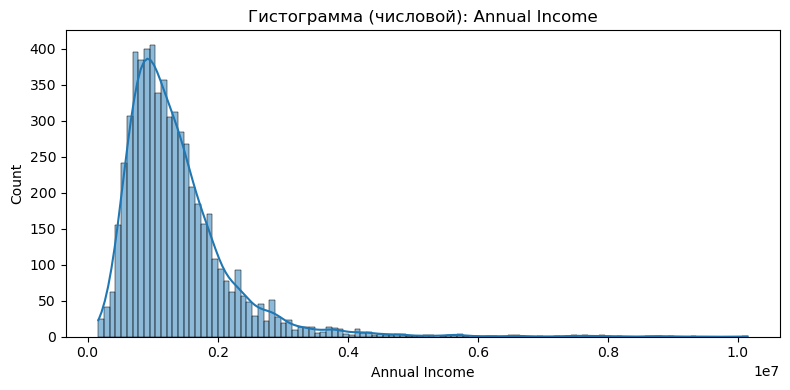

--- Признак: Years in current job ---
Количество пропусков: 371
Тип данных: object


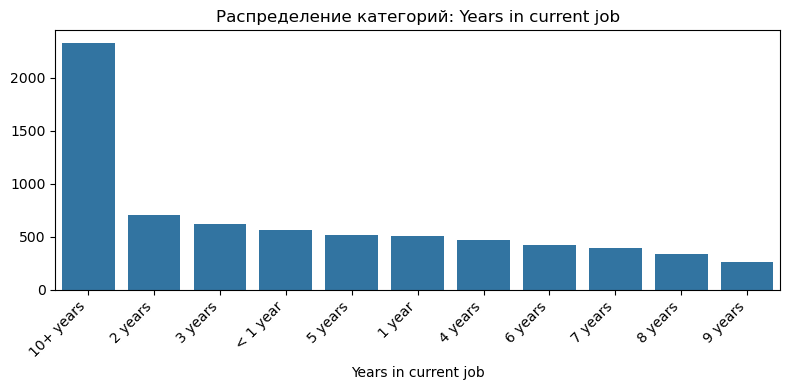

--- Признак: Months since last delinquent ---
Количество пропусков: 4081
Тип данных: float64


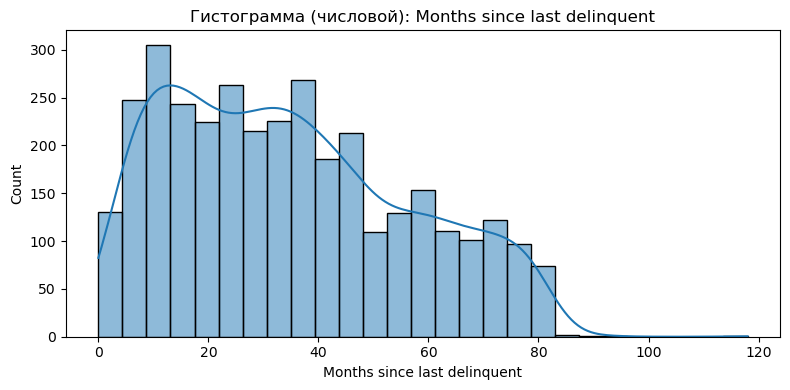

--- Признак: Bankruptcies ---
Количество пропусков: 14
Тип данных: float64


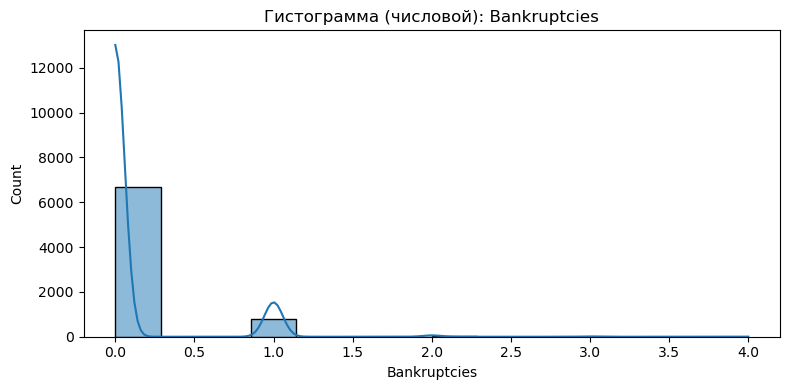

--- Признак: Credit Score ---
Количество пропусков: 1557
Тип данных: float64


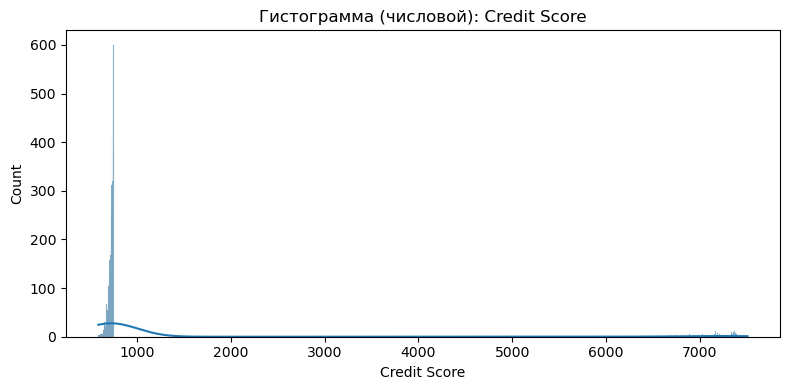

In [260]:
for col in nan_col:
    analyze_nan_series(original_df[col])

**Years in current job** - пропуски булут заполнены модой

**Bankruptcies** - пропуски заменены модой

**Credit Score**, **Months since last delinquent** и **Annual Income** - нанов 20%, 50% и 20% на весь датасет, что давольно много; создадим признак бинарный на эти nan

In [261]:
nan_add_df = original_df.copy()

In [262]:
col_for_imputer_bin_this_nan = ['Credit Score', 'Months since last delinquent', 'Annual Income']

for col in col_for_imputer_bin_this_nan:
    nan_add_df[col +'_nan'] = nan_add_df[col].isna().astype(int)

**Credit Score** и **Annual Income** - пропуски заменим медианой

**Months since last delinquent** - большое скопление nan моэно объяснить тем, что у этих людей никогда и не было задолжности, из за чего есть не 0, а nan; как решение, это инвертировать исходный бинарный _Months since last delinquent_, который был для обозначения пропуска, а сами nan заполнить 0

In [263]:
nan_add_df['Months since last delinquent_nan'] = (~nan_add_df['Months since last delinquent_nan'].astype(bool)).astype(int)

In [264]:
nan_add_df.head(5)

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default,Credit Score_nan,Months since last delinquent_nan,Annual Income_nan
0,Own Home,482087.0,NaN,0.0,11.0,26.3,685960.0,1.0,NaN,1.0,debt consolidation,Short Term,99999999.0,47386.0,7914.0,749.0,0,0,0,0
1,Own Home,1025487.0,10+ years,0.0,15.0,15.3,1181730.0,0.0,NaN,0.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737.0,1,0,0,0
2,Home Mortgage,751412.0,8 years,0.0,11.0,35.0,1182434.0,0.0,NaN,0.0,debt consolidation,Short Term,99999999.0,308389.0,13651.0,742.0,0,0,0,0
3,Own Home,805068.0,6 years,0.0,8.0,22.5,147400.0,1.0,NaN,1.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694.0,0,0,0,0
4,Rent,776264.0,8 years,0.0,13.0,13.6,385836.0,1.0,NaN,0.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719.0,0,0,0,0


#### Создадим кастомный пайплайн для заполнения пропусков

In [12]:
class CastomImputer(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.col_for_meadin = ['Credit Score', 'Annual Income']
        self.col_for_mode = ['Years in current job', 'Bankruptcies']
        self.col_for_fill_zero = ['Months since last delinquent']

        self.medains = {}
        self.mode = {}

    def fit(self, X, y=None):
        for col in self.col_for_meadin:
            if col in X.columns:
                self.medains[col] = X[col].median()
            else:
                print(f'Столбца {col} нет')

        for col in self.col_for_mode:
            if col in X.columns:
                self.mode[col] = X[col].mode()[0]
            else:
                print(f'столбца {col} нет')

        return self
    
    def transform(self, X):
        X = X.copy()

        if not X.isna().any().any():
            return X

        all_col = self.col_for_meadin + self.col_for_mode + self.col_for_fill_zero
        for col in all_col:
            if col in X.columns:
                X[col + '_nan'] = X[col].isna().astype(int)

        for col in self.col_for_meadin:
            if col in X.columns:
                X[col] = X[col].fillna(self.medains[col])

        for col in self.col_for_mode:
            if col in X.columns:
                X[col] = X[col].fillna(self.mode[col])

        for col in self.col_for_fill_zero:
            if col in X.columns:
                X[col] = X[col].fillna(0)

        if 'Months since last delinquent_nan' in X.columns:
            X['Months since last delinquent_nan'] = (~X['Months since last delinquent_nan'].astype(bool)).astype(int)

        self.feature_names_out_ = X.columns.tolist()

        return X
    

    def get_feature_names_out(self, input_features=None):
        return self.feature_names_out_

In [266]:
imputer = CastomImputer()

custom_nan_put = imputer.fit_transform(original_df)
custom_nan_put.head(5)

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,...,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default,Credit Score_nan,Annual Income_nan,Years in current job_nan,Bankruptcies_nan,Months since last delinquent_nan
0,Own Home,482087.0,10+ years,0.0,11.0,26.3,685960.0,1.0,0.0,1.0,...,99999999.0,47386.0,7914.0,749.0,0,0,0,1,0,0
1,Own Home,1025487.0,10+ years,0.0,15.0,15.3,1181730.0,0.0,0.0,0.0,...,264968.0,394972.0,18373.0,737.0,1,0,0,0,0,0
2,Home Mortgage,751412.0,8 years,0.0,11.0,35.0,1182434.0,0.0,0.0,0.0,...,99999999.0,308389.0,13651.0,742.0,0,0,0,0,0,0
3,Own Home,805068.0,6 years,0.0,8.0,22.5,147400.0,1.0,0.0,1.0,...,121396.0,95855.0,11338.0,694.0,0,0,0,0,0,0
4,Rent,776264.0,8 years,0.0,13.0,13.6,385836.0,1.0,0.0,0.0,...,125840.0,93309.0,7180.0,719.0,0,0,0,0,0,0


## Анализ признаков

### Исходные датасет для анализа

In [267]:
custom_nan_put.head(5)

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,...,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default,Credit Score_nan,Annual Income_nan,Years in current job_nan,Bankruptcies_nan,Months since last delinquent_nan
0,Own Home,482087.0,10+ years,0.0,11.0,26.3,685960.0,1.0,0.0,1.0,...,99999999.0,47386.0,7914.0,749.0,0,0,0,1,0,0
1,Own Home,1025487.0,10+ years,0.0,15.0,15.3,1181730.0,0.0,0.0,0.0,...,264968.0,394972.0,18373.0,737.0,1,0,0,0,0,0
2,Home Mortgage,751412.0,8 years,0.0,11.0,35.0,1182434.0,0.0,0.0,0.0,...,99999999.0,308389.0,13651.0,742.0,0,0,0,0,0,0
3,Own Home,805068.0,6 years,0.0,8.0,22.5,147400.0,1.0,0.0,1.0,...,121396.0,95855.0,11338.0,694.0,0,0,0,0,0,0
4,Rent,776264.0,8 years,0.0,13.0,13.6,385836.0,1.0,0.0,0.0,...,125840.0,93309.0,7180.0,719.0,0,0,0,0,0,0


In [268]:
custom_nan_put.describe()

,Annual Income,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default,Credit Score_nan,Annual Income_nan,Years in current job_nan,Bankruptcies_nan,Months since last delinquent_nan
count,7.500000e+03,7500.000000,7500.000000,7500.000000,7.500000e+03,7500.000000,7500.000000,7500.000000,7.500000e+03,7.500000e+03,7500.000000,7500.000000,7500.000000,7500.000000,7500.000000,7500.000000,7500.000000,7500.000000
mean,1.325286e+06,0.030133,11.130933,18.317467,9.451537e+05,0.170000,15.815200,0.116933,1.187318e+07,2.898332e+05,18314.454133,1063.877333,0.281733,0.207600,0.207600,0.049467,0.001867,0.455867
std,7.567551e+05,0.271604,4.908924,7.041946,1.602622e+07,0.498598,22.649441,0.346904,3.192612e+07,3.178714e+05,11926.764673,1438.335832,0.449874,0.405616,0.405616,0.216855,0.043167,0.498082
min,1.645970e+05,0.000000,2.000000,4.000000,0.000000e+00,0.000000,0.000000,0.000000,1.124200e+04,0.000000e+00,0.000000,585.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,9.311330e+05,0.000000,8.000000,13.500000,2.792295e+05,0.000000,0.000000,0.000000,1.801690e+05,1.142565e+05,10067.500000,718.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.168386e+06,0.000000,10.000000,17.000000,4.781590e+05,0.000000,0.000000,0.000000,3.095730e+05,2.093230e+05,16076.500000,731.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.499974e+06,0.000000,14.000000,21.800000,7.935015e+05,0.000000,29.000000,0.000000,5.198820e+05,3.604062e+05,23818.000000,740.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,1.014934e+07,7.000000,43.000000,57.700000,1.304726e+09,7.000000,118.000000,4.000000,1.000000e+08,6.506797e+06,136679.000000,7510.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [269]:
custom_nan_put.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7500 entries, 0 to 7499
Data columns (total 22 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Home Ownership                    7500 non-null   object 
 1   Annual Income                     7500 non-null   float64
 2   Years in current job              7500 non-null   object 
 3   Tax Liens                         7500 non-null   float64
 4   Number of Open Accounts           7500 non-null   float64
 5   Years of Credit History           7500 non-null   float64
 6   Maximum Open Credit               7500 non-null   float64
 7   Number of Credit Problems         7500 non-null   float64
 8   Months since last delinquent      7500 non-null   float64
 9   Bankruptcies                      7500 non-null   float64
 10  Purpose                           7500 non-null   object 
 11  Term                              7500 non-null   object 
 12  Curren

<Axes: >

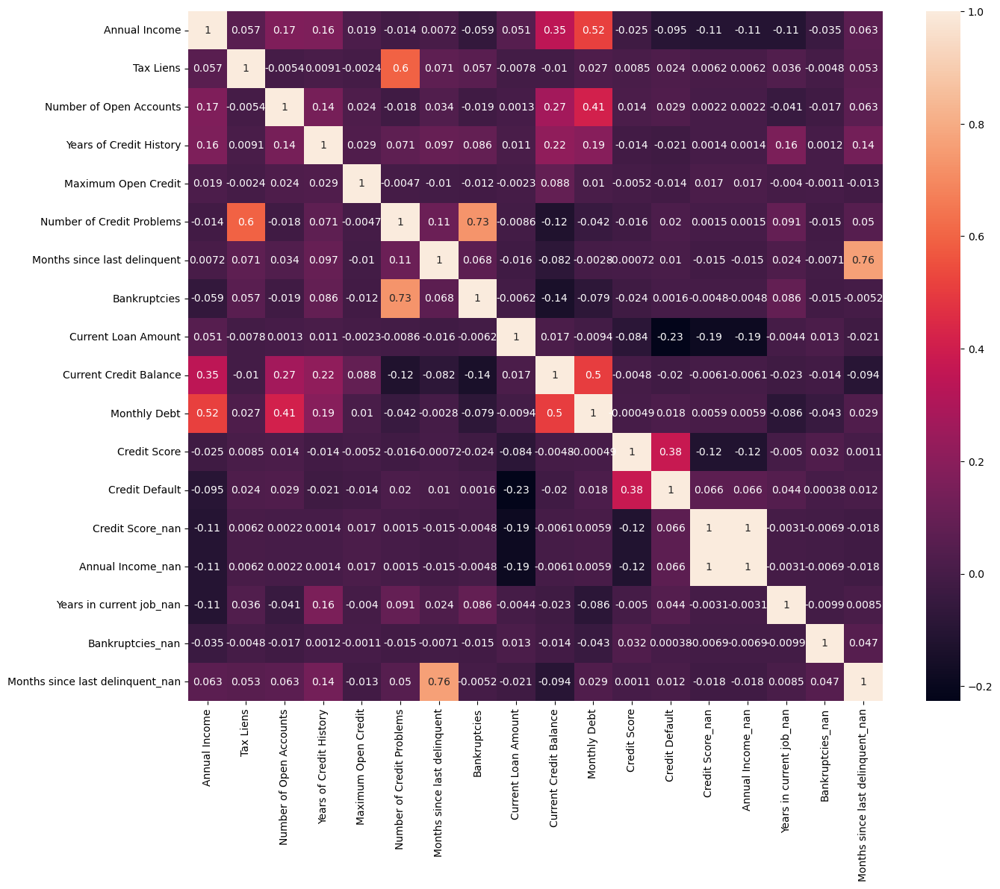

In [270]:
num_col = custom_nan_put.select_dtypes(include=['number']).columns

corr = custom_nan_put[num_col].corr()

plt.figure(figsize=(15, 12))
sns.heatmap(corr, annot=True)

array([[<Axes: title={'center': 'Annual Income'}>,
        <Axes: title={'center': 'Tax Liens'}>,
        <Axes: title={'center': 'Number of Open Accounts'}>,
        <Axes: title={'center': 'Years of Credit History'}>],
       [<Axes: title={'center': 'Maximum Open Credit'}>,
        <Axes: title={'center': 'Number of Credit Problems'}>,
        <Axes: title={'center': 'Months since last delinquent'}>,
        <Axes: title={'center': 'Bankruptcies'}>],
       [<Axes: title={'center': 'Current Loan Amount'}>,
        <Axes: title={'center': 'Current Credit Balance'}>,
        <Axes: title={'center': 'Monthly Debt'}>,
        <Axes: title={'center': 'Credit Score'}>],
       [<Axes: title={'center': 'Credit Default'}>,
        <Axes: title={'center': 'Credit Score_nan'}>,
        <Axes: title={'center': 'Annual Income_nan'}>,
        <Axes: title={'center': 'Years in current job_nan'}>],
       [<Axes: title={'center': 'Bankruptcies_nan'}>,
        <Axes: title={'center': 'Months since 

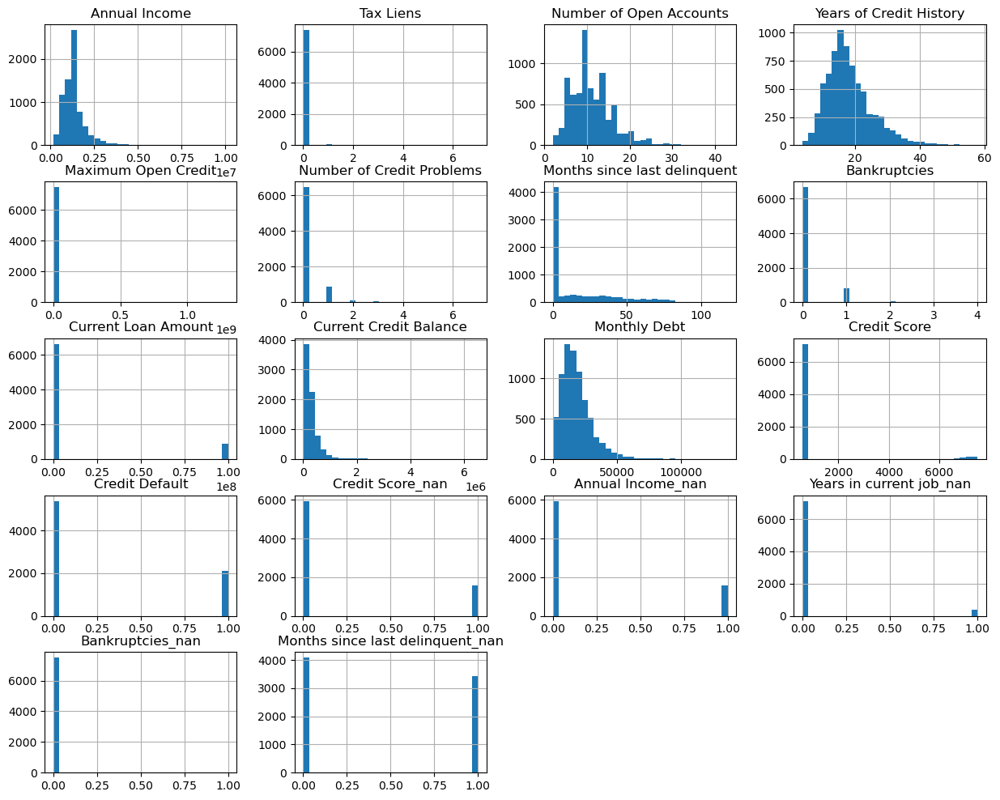

In [271]:
custom_nan_put.hist(bins=30, figsize=(15, 12))

### Функции

In [272]:
def evalute_model(model, model_name, X_train, X_test, y_train, y_test):
    if model_name == 'CatBoost':
        model.fit(X_train, y_train, eval_set=(X_test, y_test), verbose=0)
    else:
        model.fit(X_train, y_train)

    y_test_pred = model.predict(X_test)
    y_train_pred = model.predict(X_train)

    f1_test = f1_score(y_true=y_test, y_pred=y_test_pred)
    f1_train = f1_score(y_true=y_train, y_pred=y_train_pred)

    return {
        'model': model_name,
        'f1_test': f1_test,
        'f1_train': f1_train
    }

In [ ]:
def get_dict_model(random_state=42):
    return {
        'LogisticRegression': LogisticRegression(
            class_weight='balanced',
            random_state=random_state,
            max_iter=1000,
            solver='liblinear'
        ),
        
        'DecisionTree': DecisionTreeClassifier(
            class_weight='balanced',
            random_state=random_state,
            max_depth=10 
        ),
        
        'RandomForest': RandomForestClassifier(
            n_estimators=200,
            max_depth=3,
            class_weight='balanced',
            random_state=random_state,
            n_jobs=-1
        ),
        
        'CatBoost': CatBoostClassifier(
            auto_class_weights='Balanced',
            random_state=random_state,
            verbose=0,
            eval_metric='F1',
            early_stopping_rounds=50,
            iterations=1000
        ),
        
        'LightGBM': LGBMClassifier(
            class_weight='balanced',
            random_state=random_state,
            metric='f1',
            n_jobs=-1
        )
    }

In [274]:
def analyze_metric_model(this_df, target=TARGET, test_size=0.2, random_state=42):
    num_cols = this_df.select_dtypes(include='number').columns
    feature_cols = num_cols.drop(target)

    X = this_df[feature_cols]
    y = this_df[target]

    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=test_size, stratify=y, random_state=random_state
    )
    sc = StandardScaler()
    X_train_sc = sc.fit_transform(X_train)
    X_test_sc = sc.transform(X_test)

    models = get_dict_model(random_state=random_state)

    results = []

    for name, model in models.items():

        result = evalute_model(model, name, X_train_sc, X_test_sc, y_train, y_test)
        results.append({
            'model': result['model'],
            'f1_test': result['f1_test'],
            'f1_train': result['f1_train']
        })

    
    result_df = pd.DataFrame(results)

    return result_df

In [ ]:
@pd.api.extensions.register_dataframe_accessor("my")
class MyAnalyzer:
    def __init__(self, pandas_obj):
        self._obj = pandas_obj

    def quick_analysis(self, feature, bins=30, multiplier=1.5):
        print(f"--- Анализ признака: {feature} ---")

        self._plot_distribution(feature, bins=bins)
        self._plot_heatmap_correlation(feature)
        self._analyze_outliers(feature, multiplier=multiplier)

    def _analyze_outliers(self, features, multiplier=1.5, return_low_up=False):
        df = self._obj.copy()

        series = df[features]
    
        Q1, Q3 = series.quantile([0.25, 0.75])

        IQR = Q3 - Q1
        lower, upper = Q1 - multiplier * IQR, Q3 + multiplier * IQR
        mask = (series < lower) | (series > upper)
        print(f"Выбросов: {mask.sum()} ({mask.mean()*100:.2f}%)")
        sns.boxplot(x=series)
        plt.title(f'Выбросы: {series.name}')

        if return_low_up:
            return lower, upper
        else:
            return None
        
    def _plot_distribution(self, features, bins=30, figsize=(12, 6)):
        df = self._obj.copy()

        series = df[features]

        fig, ax = plt.subplots(1, 2, figsize=figsize)
        sns.histplot(series, bins=bins, kde=True, ax=ax[0])
        sns.boxplot(x=series, ax=ax[1])
        plt.suptitle(f'Распределение признака: {series.name}')
        plt.show()

    def _plot_heatmap_correlation(self, target_col=None, figsize=(15, 12)):
        df = self._obj.copy()

        num_cols = df.select_dtypes(include='number').columns

        if target_col is not None:
            corr_with_target = df[num_cols].corr()[target_col].drop(target_col)
            corr_with_target = corr_with_target.abs().sort_values(ascending=False)
            
            plt.figure(figsize=(10, max(6, len(corr_with_target) * 0.3)))
            sns.barplot(
                x=corr_with_target.values,
                y=corr_with_target.index,
                hue=corr_with_target.index,
                palette='coolwarm',
                legend=False
            )
            plt.title(f'Абсолютная корреляция признаков с {target_col}')
            plt.xlabel('Абсолютное значение корреляции')
            plt.tight_layout()
            plt.show()
        
        else:
            corr = df[num_cols].corr()
            plt.figure(figsize=figsize)
            sns.heatmap(corr, annot=True, fmt='.2f', center=0)
            plt.title('Корреляционная матрица числовых признаков')
            plt.tight_layout()

C:\Users\Danila\AppData\Local\Temp\ipykernel_10596\3427075393.py:2: UserWarning: registration of accessor <class '__main__.MyAnalyzer'> under name 'my' for type <class 'pandas.core.frame.DataFrame'> is overriding a preexisting attribute with the same name.
  class MyAnalyzer:


In [276]:
def fast_plot_distubution_features_vs_features(ser1, ser2, bins=30, figsize=(15,8)):
    fig, ax = plt.subplots(1, 2, figsize=figsize)
    ax = ax.flatten()

    sns.histplot(ser1, ax=ax[0], kde=True, bins=bins)
    sns.histplot(ser2, ax=ax[1], kde=True, bins=bins)

In [277]:
def chi2_from_series(series1, series2, name1='Группа 1', name2='Группа 2'):
        d1, n1 = series1.sum(), len(series1)
        d2, n2 = series2.sum(), len(series2)
        
        observed = [[n1 - d1, d1],
                    [n2 - d2, d2]]
        
        chi2, p, dof, expected = stats.chi2_contingency(observed)
        
        table = pd.DataFrame(observed, 
                            index=[name1, name2], 
                            columns=['No_Default', 'Default'])
        print("Таблица сопряжённости:")
        print(f"χ² = {chi2:.4f}, p = {p:.4f}")
        
        return chi2, p, table

In [278]:
analyze_metric_model(custom_nan_put)

d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


,model,f1_test,f1_train
0,LogisticRegression,0.504604,0.510540
1,DecisionTree,0.505556,0.623711
2,RandomForest,0.508475,0.525680
3,CatBoost,0.513036,0.529886
4,LightGBM,0.511628,0.839572


### Рассмотрим Credit Score

--- Анализ признака: Credit Score ---


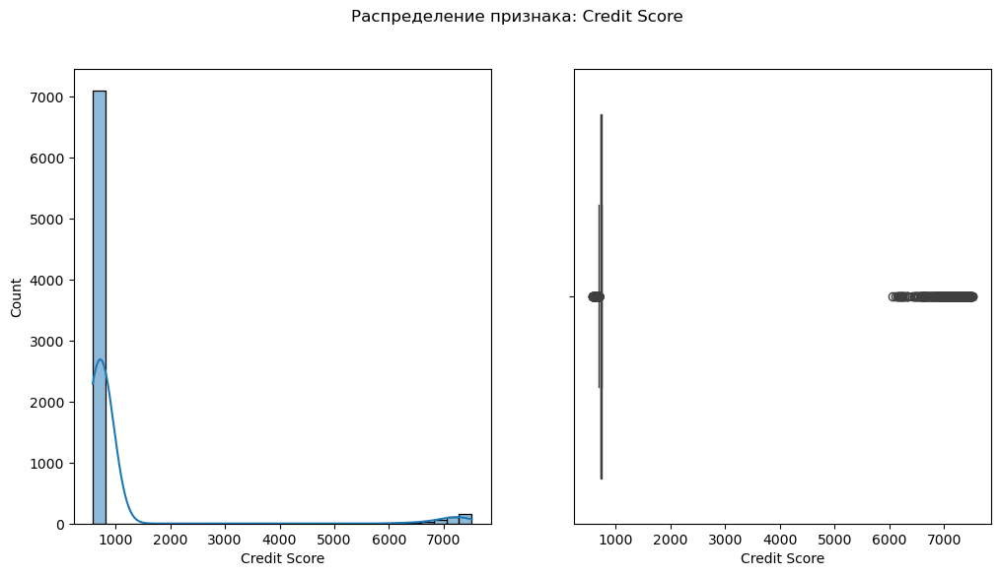

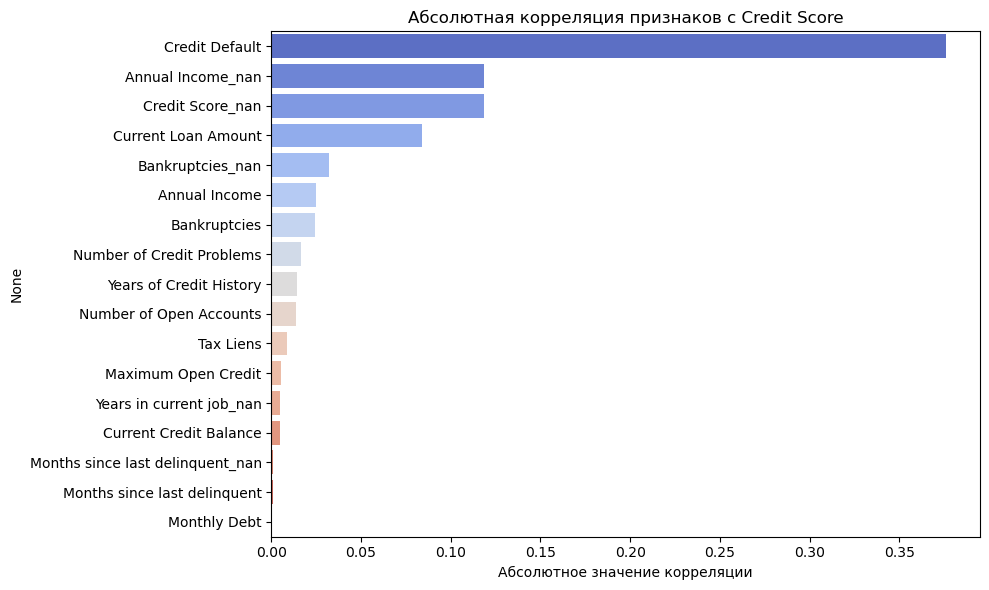

Выбросов: 575 (7.67%)


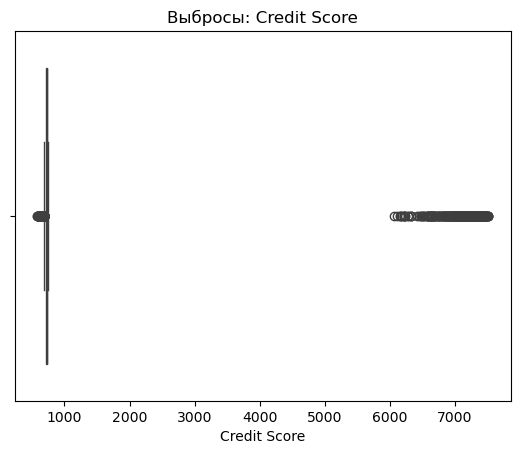

In [279]:
custom_nan_put.my.quick_analysis('Credit Score', multiplier=3.0)

Присутствуют явные выбросы свыше 5000. Рассмотрим их природу

In [280]:
mask_outliers_credit_score = custom_nan_put['Credit Score'] > 5000.0

<Axes: >

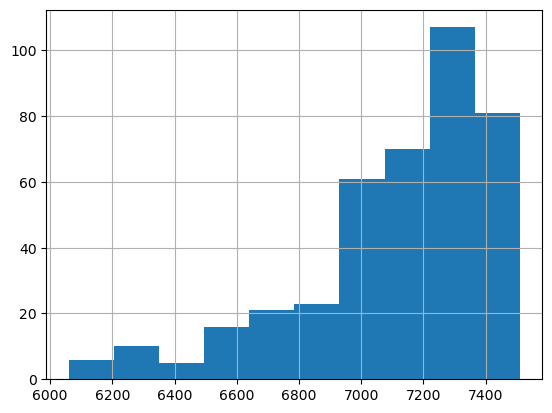

In [281]:
custom_nan_put.loc[mask_outliers_credit_score, 'Credit Score'].hist()

Скор в банках зачастую определяется от 300-850. Создадим новый бинарный признак, который будет отражать 0 - не выбрас (то что не вошло в маску), 1 - выброс (то что вошло в маску)

In [282]:
custom_nan_put['Credit Score_outliers'] = mask_outliers_credit_score.astype(int)

Сделаем предопложение по поводу выбросов, что они созданы так, что их помножили на 10

In [283]:
outliers = custom_nan_put.loc[mask_outliers_credit_score, 'Credit Score']
no_outliers = custom_nan_put.loc[~mask_outliers_credit_score, 'Credit Score']

print(f'среднее значение адекватных данных - {no_outliers.mean()}')
print(f'среднее значение странных данных - {outliers.mean()}')

среднее значение адекватных данных - 722.9633802816901
среднее значение странных данных - 7115.1


In [284]:
correct_outliers = outliers / 10.0
print(f'среднее значение скорректированных странных данных - {correct_outliers.mean()}')

среднее значение скорректированных странных данных - 711.51


In [285]:
print(f"Std нормальных данных: {no_outliers.std():.2f}")
print(f"Std скорректированных выбросов: {correct_outliers.std():.2f}")

Std нормальных данных: 24.80
Std скорректированных выбросов: 30.67


дисперсии не схожи близко. т тест не применить, из за неравност дисперсий. для этого применим более робастые критерии f и манны

In [286]:
f_stat = (correct_outliers.std() ** 2) / (no_outliers.std() ** 2)
f_pvalue = stats.f.cdf(f_stat, len(correct_outliers)-1, len(no_outliers)-1)
print(f"F-статистика для дисперсий: {f_stat:.4f}")
print(f"p-value F-теста: {min(f_pvalue, 1-f_pvalue)*2:.6f}")

u_stat, u_pvalue = stats.mannwhitneyu(no_outliers, correct_outliers)
print(f"\nU-тест Манна-Уитни p-value: {u_pvalue:.6f}")

ks_stat, ks_pvalue = stats.ks_2samp(no_outliers, correct_outliers)
print(f"KS-тест p-value: {ks_pvalue:.6f}")

F-статистика для дисперсий: 1.5299
p-value F-теста: 0.000000

U-тест Манна-Уитни p-value: 0.000000
KS-тест p-value: 0.000000


Данные тесты показали, что данные не помножены на 10

проверим массив коэффициентов, который прогоним через цикл, чтобы проверить, точно ли данные не были помножены в диапозоне числа 10

In [287]:
coefficients = np.arange(9.5, 10.5, 0.01)
for coef in coefficients:
    test_data = outliers / coef
    t_stat, p_val = stats.ttest_ind(no_outliers, test_data, equal_var=False)
    u_stat, u_pval = stats.mannwhitneyu(no_outliers, test_data)
    if p_val > 0.05:
        print(f"Коэф {coef}: t-test p={p_val:.6f}, U-test p={u_pval:.6f}, mean={test_data.mean():.2f}")

Коэф 9.799999999999994: t-test p=0.054755, U-test p=0.000000, mean=726.03
Коэф 9.809999999999993: t-test p=0.144260, U-test p=0.000004, mean=725.29
Коэф 9.819999999999993: t-test p=0.318112, U-test p=0.000036, mean=724.55
Коэф 9.829999999999993: t-test p=0.592051, U-test p=0.000639, mean=723.81
Коэф 9.839999999999993: t-test p=0.941793, U-test p=0.012789, mean=723.08
Коэф 9.849999999999993: t-test p=0.696643, U-test p=0.036282, mean=722.35
Коэф 9.859999999999992: t-test p=0.393991, U-test p=0.113719, mean=721.61
Коэф 9.869999999999992: t-test p=0.188752, U-test p=0.478922, mean=720.88
Коэф 9.879999999999992: t-test p=0.075874, U-test p=0.813195, mean=720.15


возьмем коэф 9.88 - по нему на критерии уитни почти иделаьное совпадение

возьмем еще меньший диапозон, проверим если там более оптимальный коэффциент

In [288]:
# Уточненный поиск вокруг лучшего коэффициента
coefficients_fine = np.linspace(9.87, 9.89, 20)

print("Уточненный поиск вокруг 9.88:")
for coef in coefficients_fine:
    corrected = outliers / coef
    _, p_val_t = stats.ttest_ind(no_outliers, corrected, equal_var=False)
    _, p_val_u = stats.mannwhitneyu(no_outliers, corrected)
    
    print(f"Коэф {coef:.5f}: t-test p={p_val_t:.6f}, U-test p={p_val_u:.6f}, mean={corrected.mean():.2f}")

Уточненный поиск вокруг 9.88:
Коэф 9.87000: t-test p=0.188752, U-test p=0.478922, mean=720.88
Коэф 9.87105: t-test p=0.172931, U-test p=0.481713, mean=720.80
Коэф 9.87211: t-test p=0.158127, U-test p=0.488682, mean=720.73
Коэф 9.87316: t-test p=0.144306, U-test p=0.504686, mean=720.65
Коэф 9.87421: t-test p=0.131434, U-test p=0.527475, mean=720.57
Коэф 9.87526: t-test p=0.119474, U-test p=0.552500, mean=720.50
Коэф 9.87632: t-test p=0.108386, U-test p=0.597392, mean=720.42
Коэф 9.87737: t-test p=0.098131, U-test p=0.850590, mean=720.34
Коэф 9.87842: t-test p=0.088670, U-test p=0.971608, mean=720.27
Коэф 9.87947: t-test p=0.079960, U-test p=0.871159, mean=720.19
Коэф 9.88053: t-test p=0.071961, U-test p=0.801809, mean=720.11
Коэф 9.88158: t-test p=0.064632, U-test p=0.798379, mean=720.04
Коэф 9.88263: t-test p=0.057932, U-test p=0.796905, mean=719.96
Коэф 9.88368: t-test p=0.051822, U-test p=0.793371, mean=719.88
Коэф 9.88474: t-test p=0.046262, U-test p=0.787949, mean=719.81
Коэф 9.885

оптимальный коэффциент был найден -> 9.87842

In [289]:
custom_nan_put.loc[mask_outliers_credit_score, 'Credit Score'] /= 9.87842

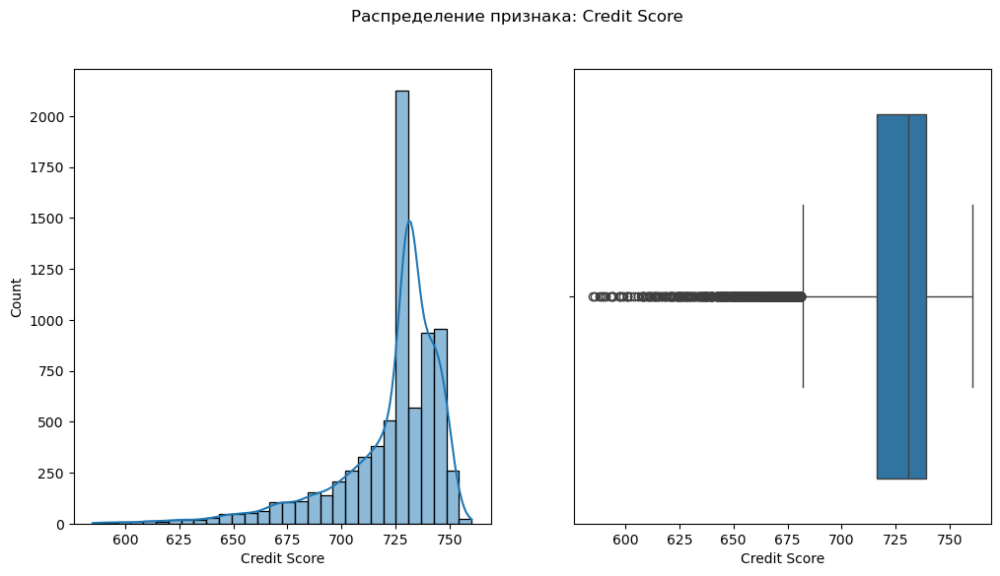

In [290]:
custom_nan_put.my._plot_distribution('Credit Score')

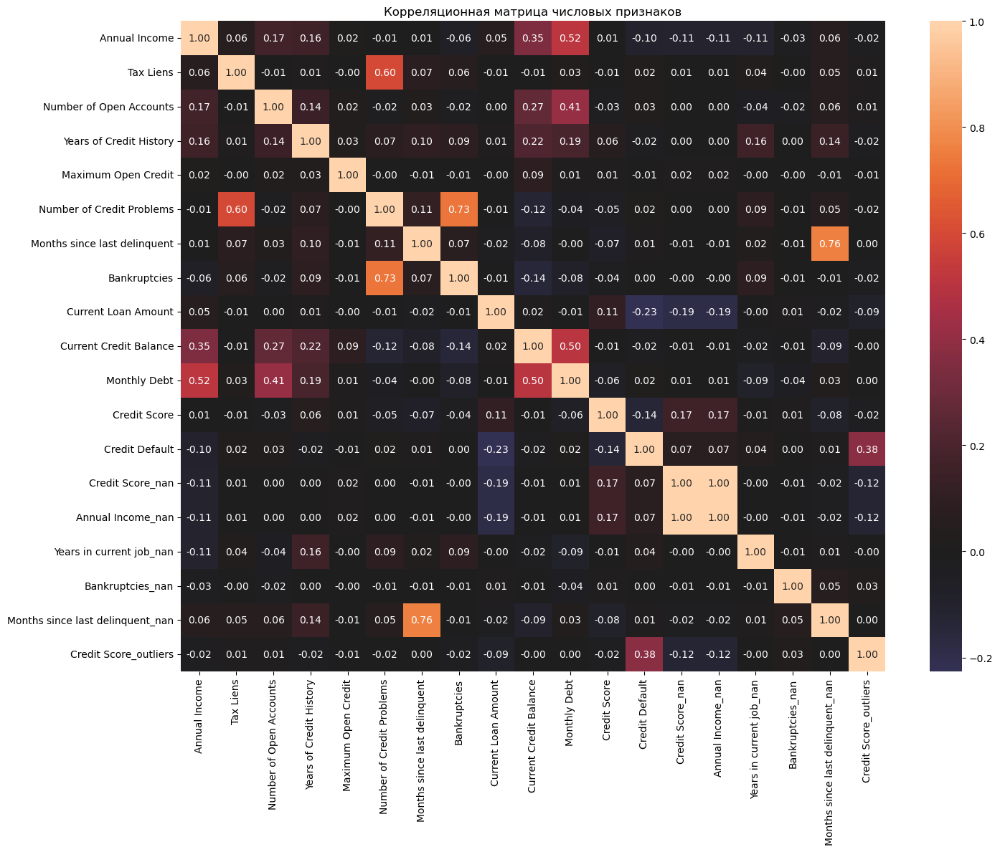

In [291]:
custom_nan_put.my._plot_heatmap_correlation()

In [292]:
analyze_metric_model(custom_nan_put)

d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


,model,f1_test,f1_train
0,LogisticRegression,0.526027,0.533024
1,DecisionTree,0.508318,0.622544
2,RandomForest,0.508597,0.529211
3,CatBoost,0.521401,0.534111
4,LightGBM,0.532344,0.846011


### Рассмотрим Current Loan Amount

--- Анализ признака: Current Loan Amount ---


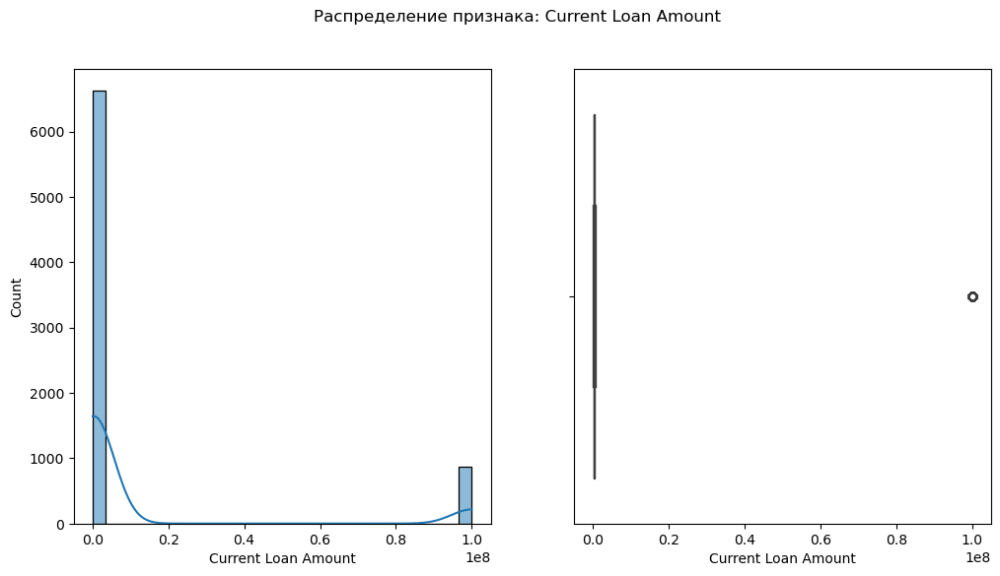

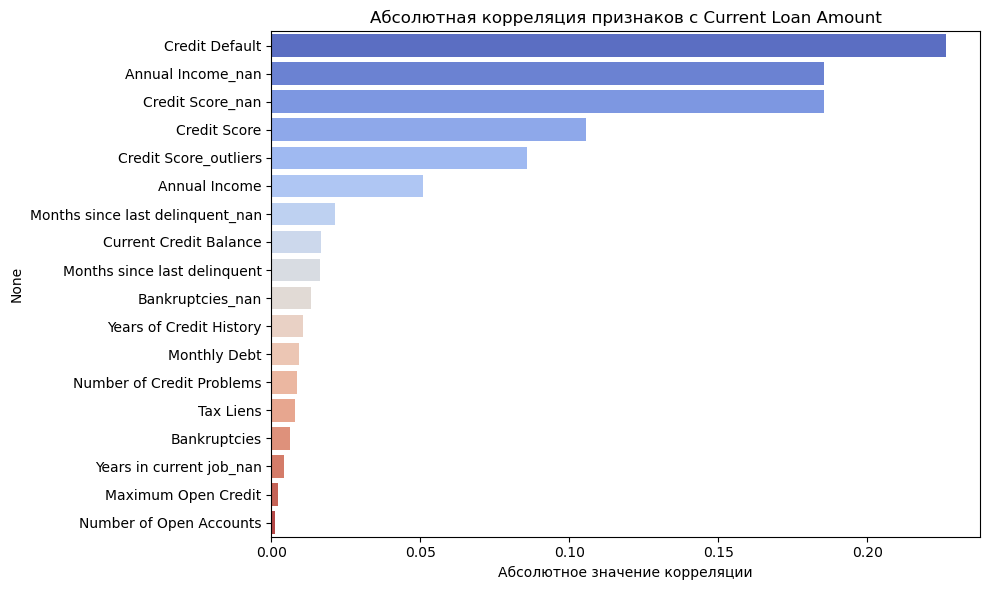

Выбросов: 870 (11.60%)


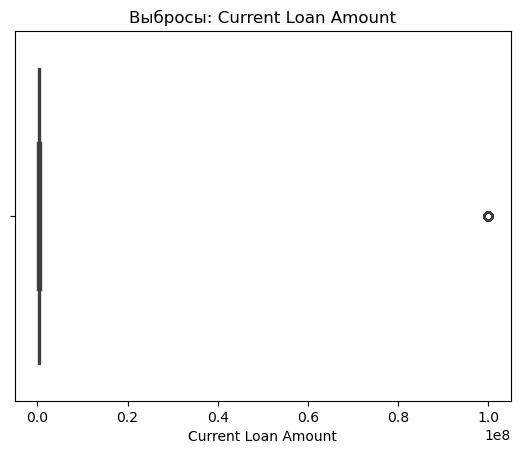

In [293]:
custom_nan_put.my.quick_analysis('Current Loan Amount')

Присутвствуют сильные выбросы. Рассмотрим их и создадим бинарный признак отвечающий - выброс и или не выбрас

Выбросов: 870 (11.60%)


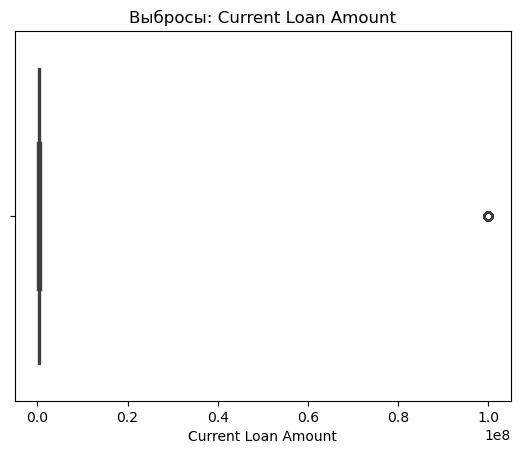

In [294]:
low, up = custom_nan_put.my._analyze_outliers('Current Loan Amount', multiplier=3.0, return_low_up=True)

In [295]:
mask_outliers_current_loan_amount = ~((custom_nan_put['Current Loan Amount'] >= low) & (custom_nan_put['Current Loan Amount'] <= up))

In [296]:
custom_nan_put['Current Loan Amount_outliers'] = mask_outliers_current_loan_amount.astype(int)

In [297]:
outliers = custom_nan_put.loc[mask_outliers_current_loan_amount].copy()
no_outliers = custom_nan_put.loc[~mask_outliers_current_loan_amount].copy()

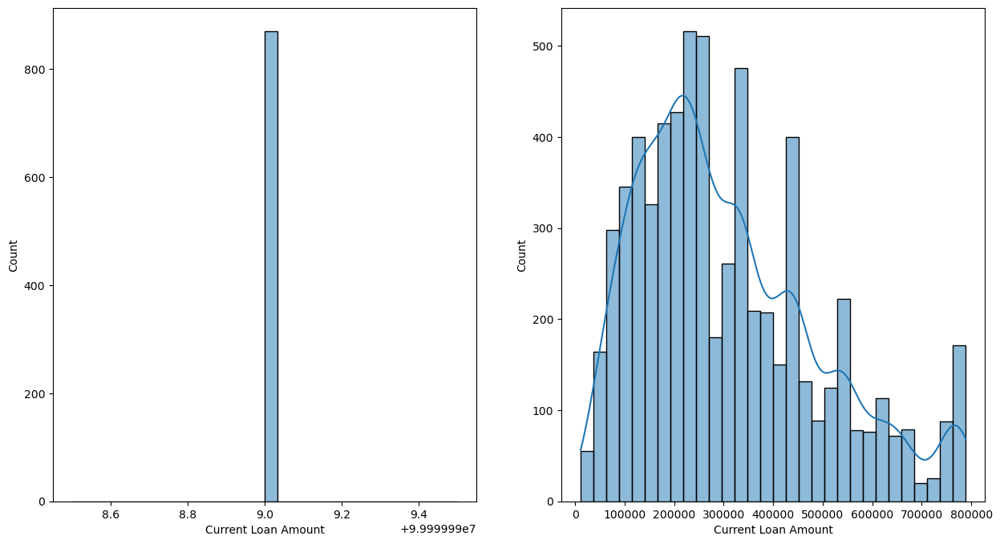

In [298]:
fast_plot_distubution_features_vs_features(outliers['Current Loan Amount'], no_outliers['Current Loan Amount'])

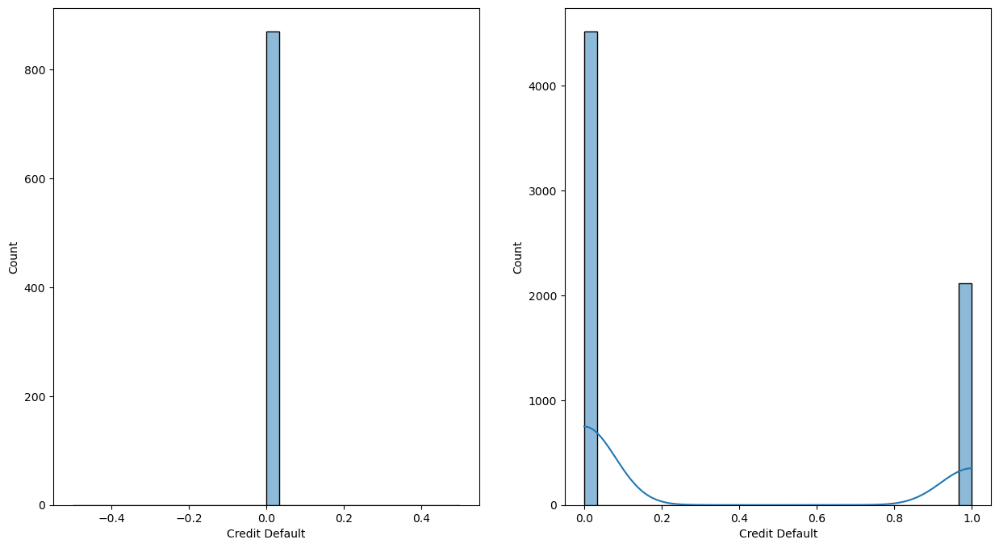

In [299]:
fast_plot_distubution_features_vs_features(outliers[TARGET], no_outliers[TARGET])

Из распределением видем, что числа из выбросов 99-999-999 - это скорее всего заглушки (аналоги нан), так как дефолтов 0, из чего можно сказать, что перед банком они не находились как должники

для устранения заглушки заменим выбросы на медиану

In [300]:
custom_nan_put.loc[mask_outliers_current_loan_amount, 'Current Loan Amount'] = no_outliers['Current Loan Amount'].median()

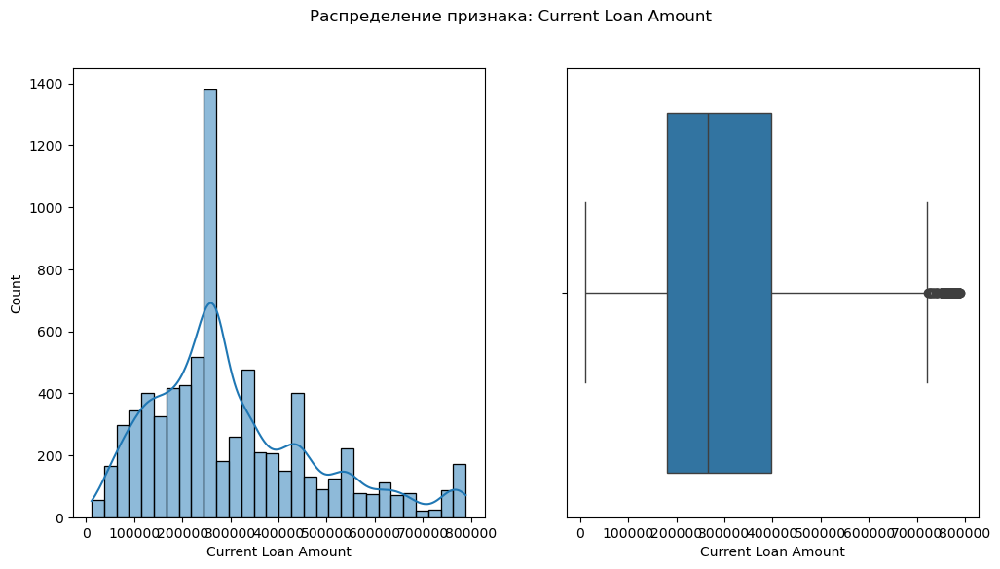

In [301]:
custom_nan_put.my._plot_distribution('Current Loan Amount')

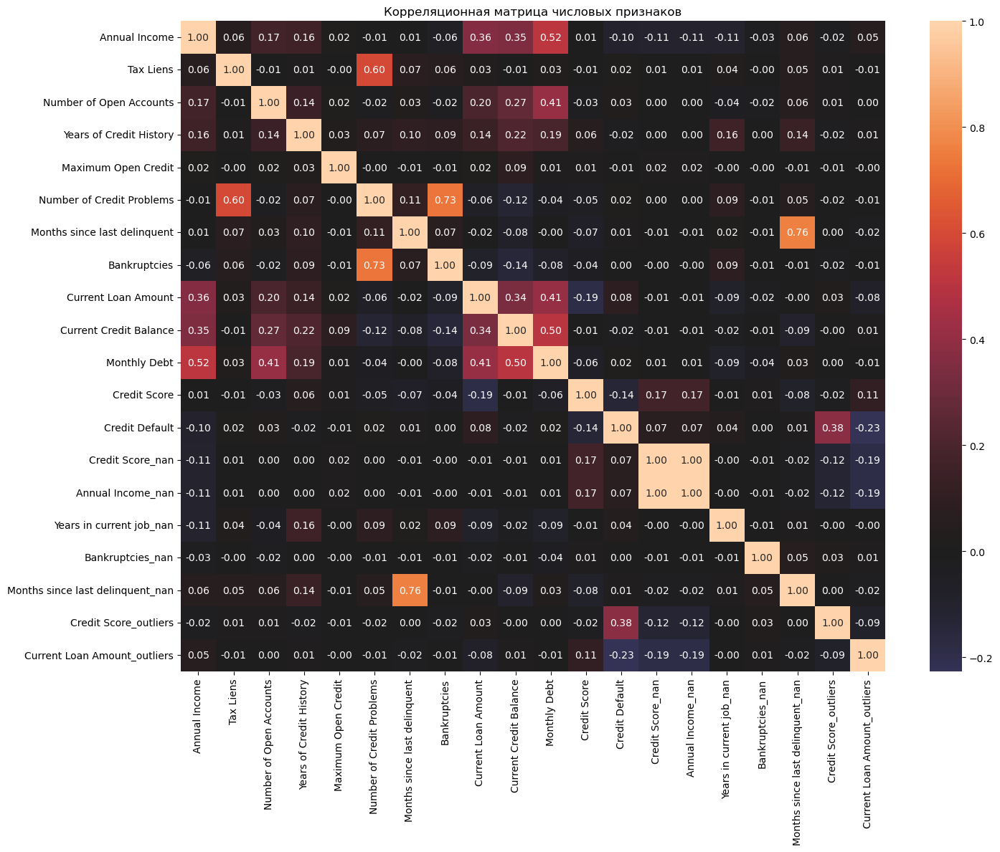

In [302]:
custom_nan_put.my._plot_heatmap_correlation()

In [303]:
analyze_metric_model(custom_nan_put)

d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


,model,f1_test,f1_train
0,LogisticRegression,0.530418,0.537121
1,DecisionTree,0.496255,0.623966
2,RandomForest,0.508057,0.540129
3,CatBoost,0.527508,0.536324
4,LightGBM,0.521552,0.858061


### Рассмотрим Annual Income

--- Анализ признака: Annual Income ---


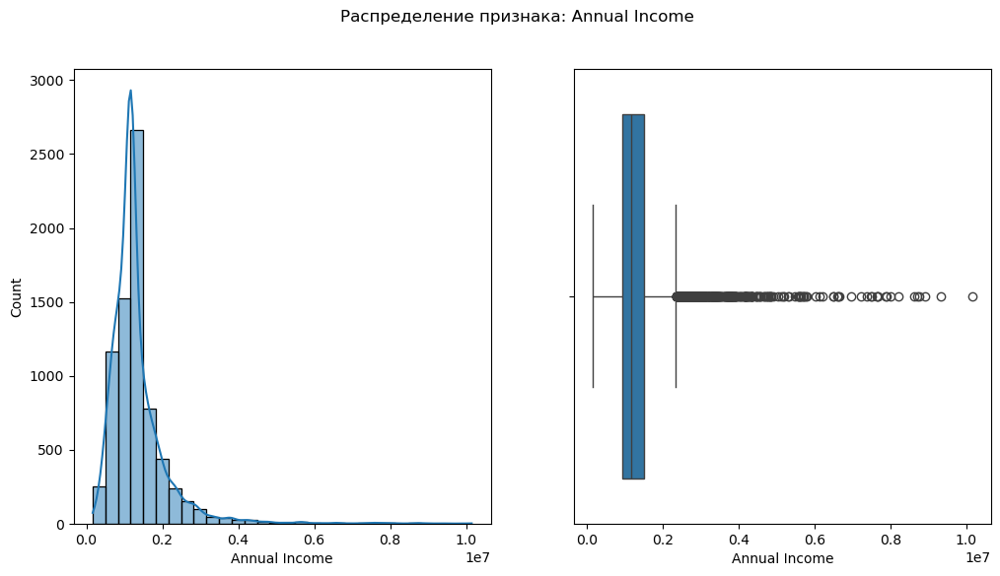

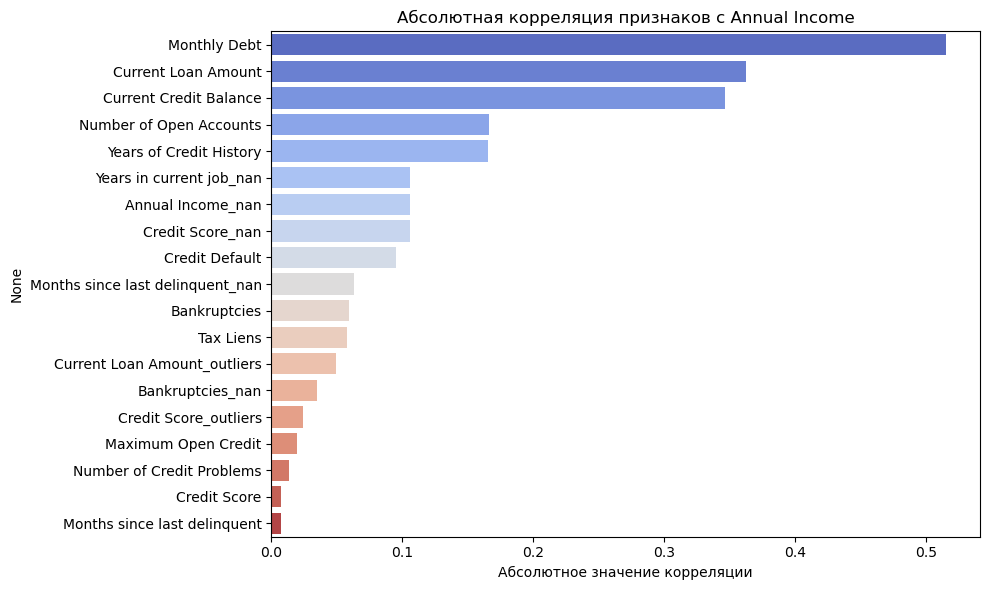

Выбросов: 516 (6.88%)


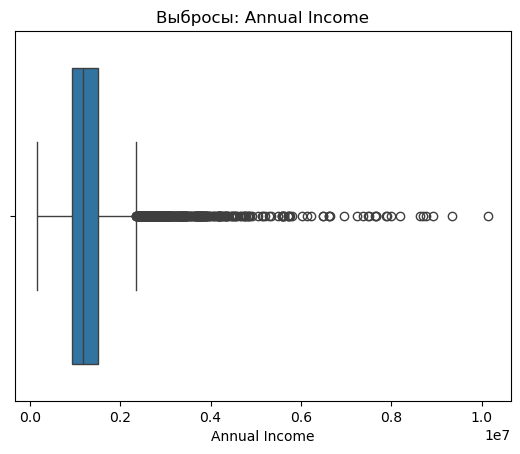

In [304]:
custom_nan_put.my.quick_analysis('Annual Income')

По расспределению видно, что оно сильно скошено. попробуем применить логарифмирование

<Axes: xlabel='Annual Income', ylabel='Count'>

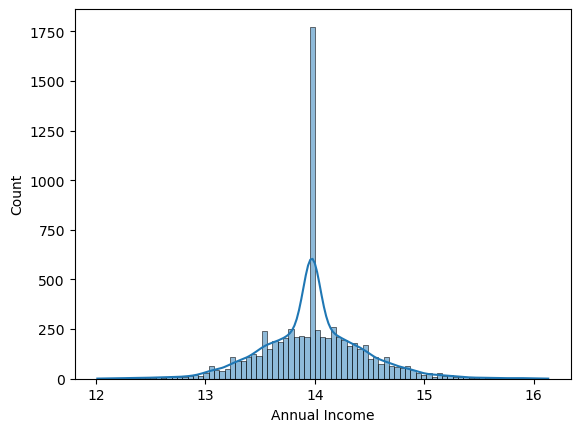

In [305]:
sns.histplot(np.log1p(custom_nan_put['Annual Income']), kde=True)

После логарифмирования распределение приняло более симметричный вид. Создадим новый признак прологарфмированного исходного

In [306]:
custom_nan_put['Annual Income_log'] = np.log1p(custom_nan_put['Annual Income'])

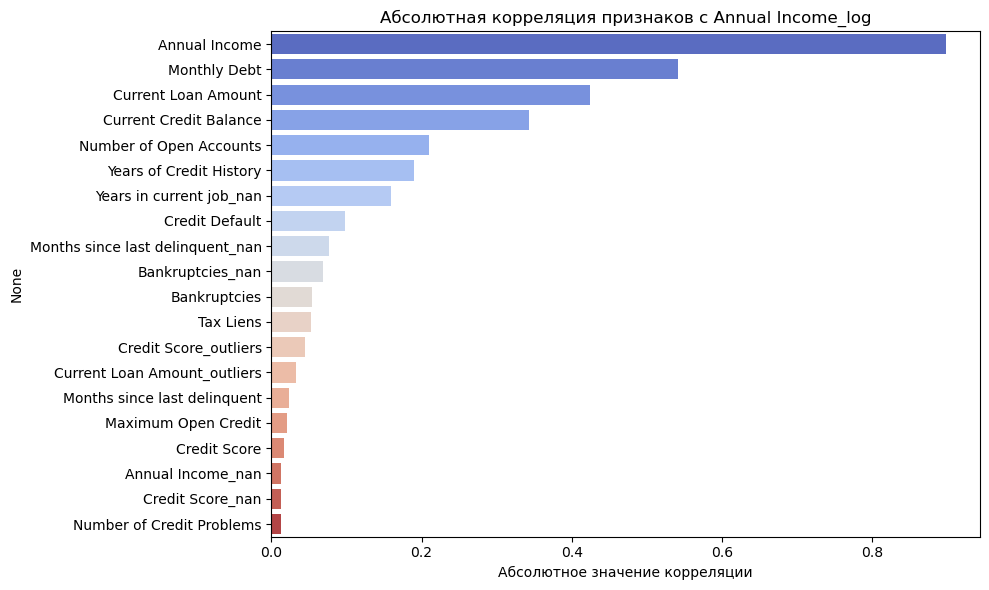

In [307]:
custom_nan_put.my._plot_heatmap_correlation('Annual Income_log')

Корреляция новго признака с исхдоным почти единиица (точнее 0.9). Корреляцие между новым признаком и TARGET осталась такой же. Удалим исходный из за незначимости

In [308]:
custom_nan_put.drop(columns='Annual Income', axis=1, inplace=True)

In [309]:
analyze_metric_model(custom_nan_put)

d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


,model,f1_test,f1_train
0,LogisticRegression,0.535080,0.538770
1,DecisionTree,0.492509,0.625148
2,RandomForest,0.519862,0.548549
3,CatBoost,0.517996,0.518769
4,LightGBM,0.520085,0.850575


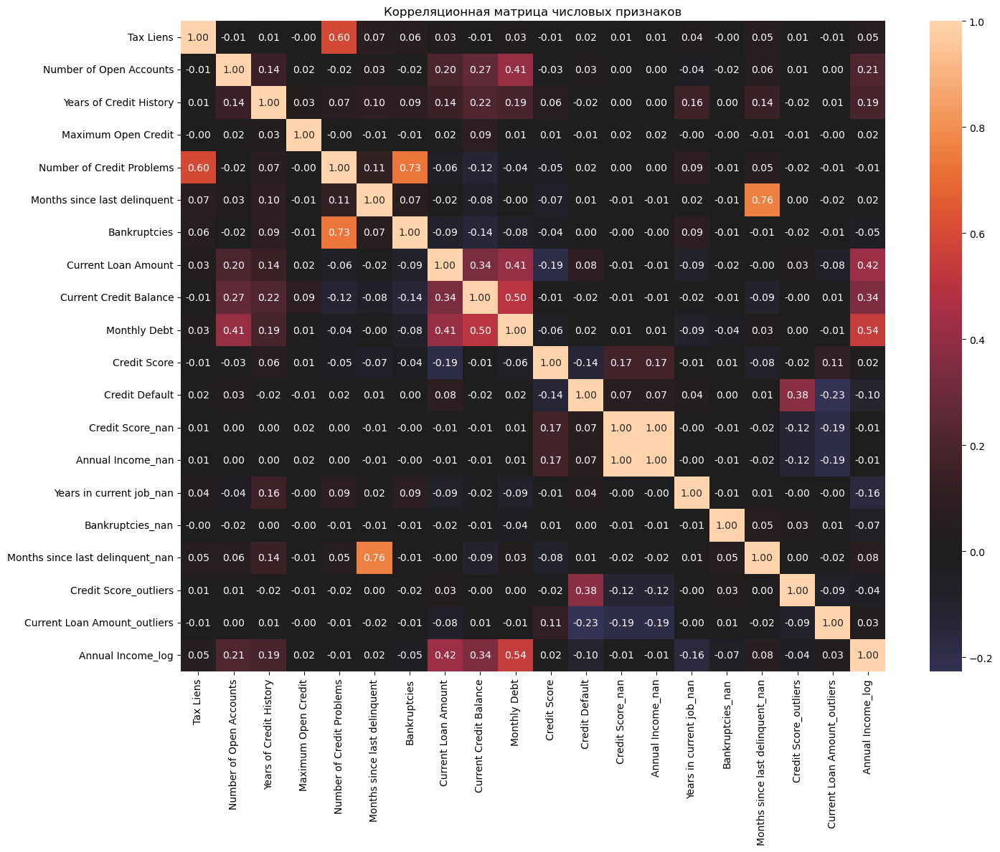

In [310]:
custom_nan_put.my._plot_heatmap_correlation()

array([[<Axes: title={'center': 'Tax Liens'}>,
        <Axes: title={'center': 'Number of Open Accounts'}>,
        <Axes: title={'center': 'Years of Credit History'}>,
        <Axes: title={'center': 'Maximum Open Credit'}>],
       [<Axes: title={'center': 'Number of Credit Problems'}>,
        <Axes: title={'center': 'Months since last delinquent'}>,
        <Axes: title={'center': 'Bankruptcies'}>,
        <Axes: title={'center': 'Current Loan Amount'}>],
       [<Axes: title={'center': 'Current Credit Balance'}>,
        <Axes: title={'center': 'Monthly Debt'}>,
        <Axes: title={'center': 'Credit Score'}>,
        <Axes: title={'center': 'Credit Default'}>],
       [<Axes: title={'center': 'Credit Score_nan'}>,
        <Axes: title={'center': 'Annual Income_nan'}>,
        <Axes: title={'center': 'Years in current job_nan'}>,
        <Axes: title={'center': 'Bankruptcies_nan'}>],
       [<Axes: title={'center': 'Months since last delinquent_nan'}>,
        <Axes: title={'cent

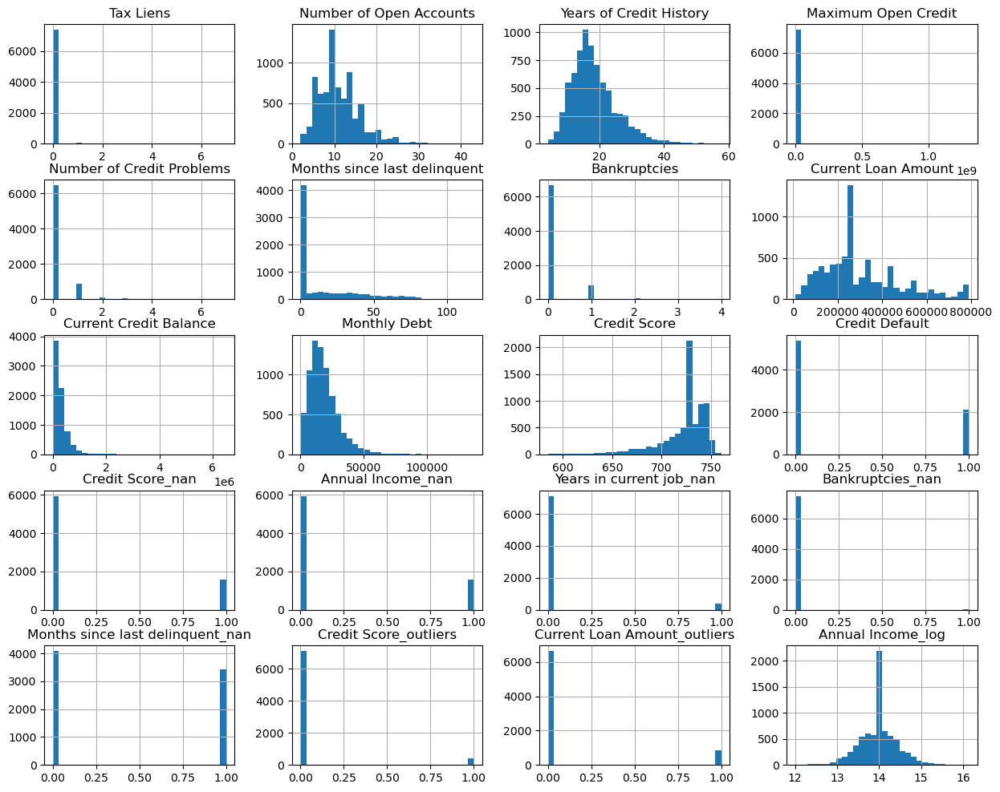

In [311]:
custom_nan_put.hist(bins=30, figsize=(15, 12))

### Рассмотрим Maxim Open Credit

--- Анализ признака: Maximum Open Credit ---


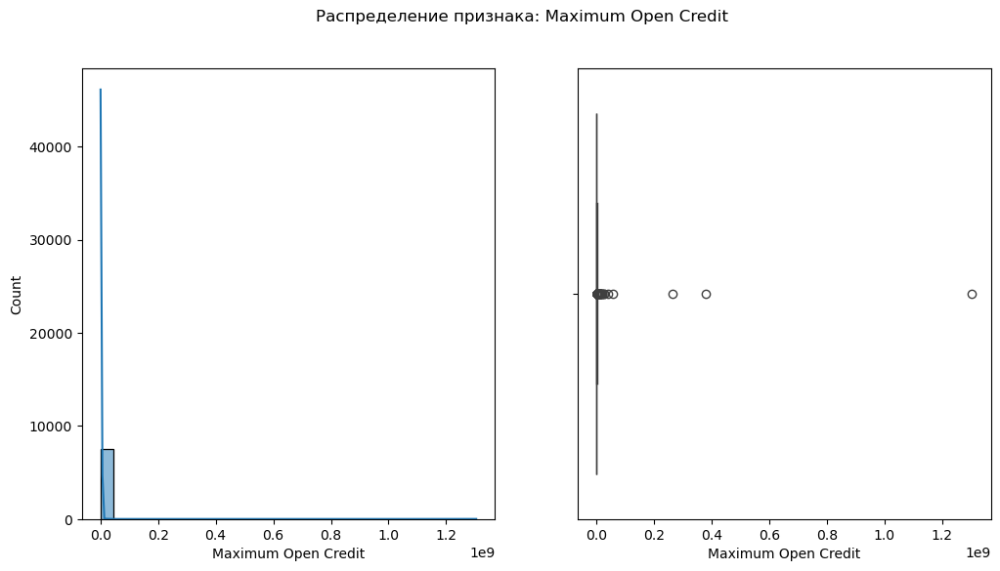

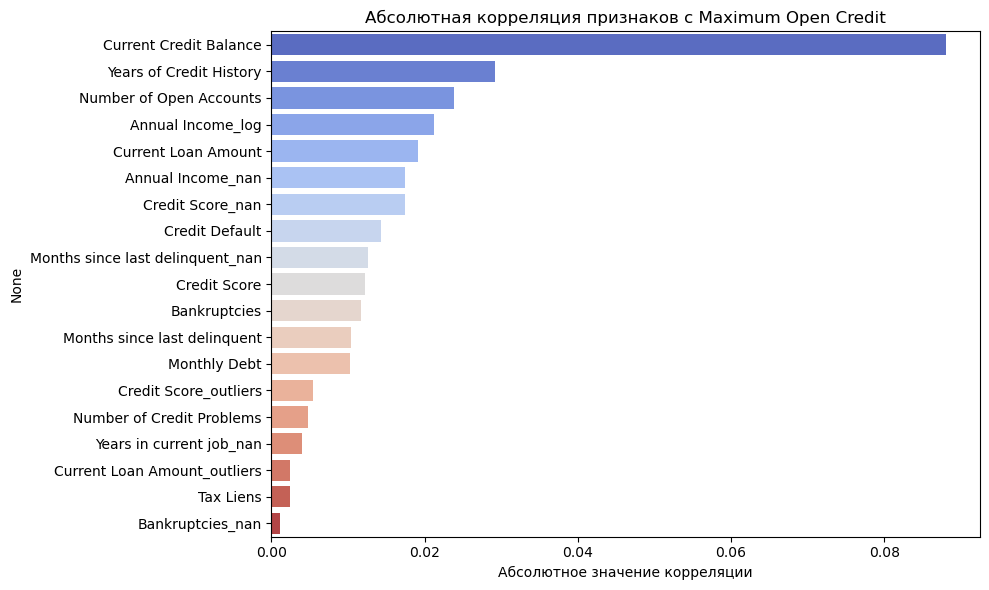

Выбросов: 466 (6.21%)


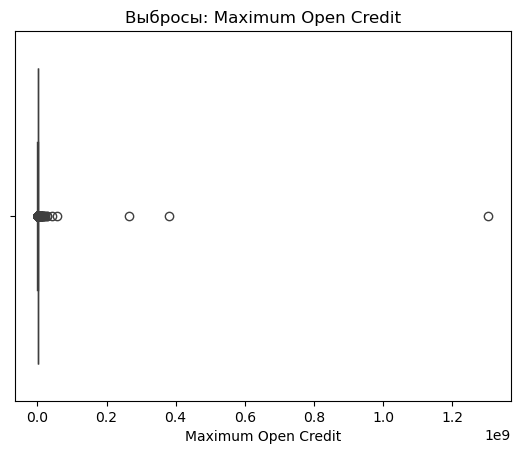

In [312]:
custom_nan_put.my.quick_analysis('Maximum Open Credit')

Выбросов: 169 (2.25%)


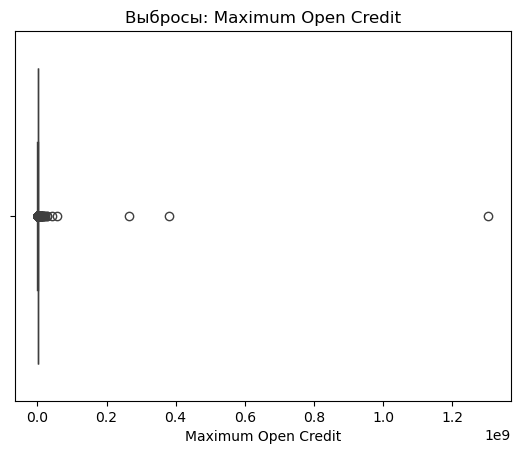

In [313]:
low, up = custom_nan_put.my._analyze_outliers('Maximum Open Credit', multiplier=3.0, return_low_up=True)

In [314]:
mask_outliers_maximum_open_credit = ~((custom_nan_put['Maximum Open Credit'] >= low) & (custom_nan_put['Maximum Open Credit'] <= up))

Создадим признак фиксирующий выбросы

In [315]:
simple_df = custom_nan_put.copy()

In [316]:
simple_df['Maximum Open Credit_outliers'] = mask_outliers_maximum_open_credit.astype(int)

Рассмотрим выбросы

In [317]:
outliers = simple_df[mask_outliers_maximum_open_credit]
no_outliers = simple_df[~mask_outliers_maximum_open_credit]

<Axes: >

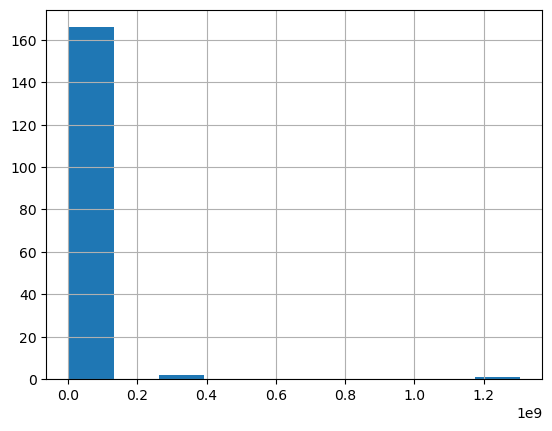

In [318]:
outliers['Maximum Open Credit'].hist()

<Axes: >

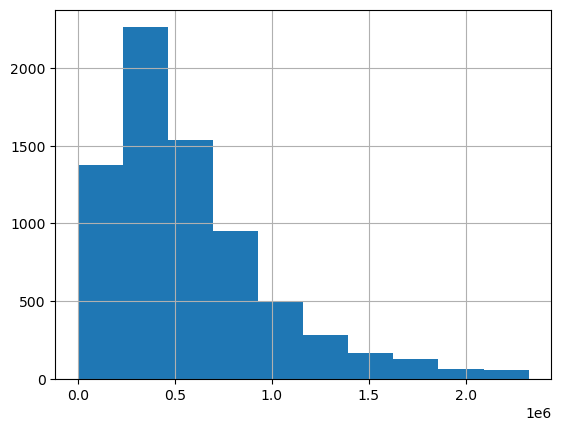

In [319]:
no_outliers['Maximum Open Credit'].hist()

Выбросы имею давольно не ясную и не удобный вид для изучения. Попробуем прологарифимировать исходный признак

<Axes: xlabel='Maximum Open Credit', ylabel='Count'>

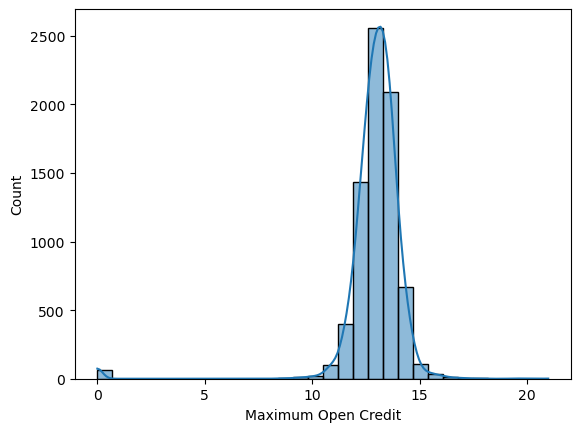

In [320]:
sns.histplot(np.log1p(custom_nan_put['Maximum Open Credit']), kde=True, bins=30)

In [321]:
custom_nan_put['Maximum Open Credit_log'] = np.log1p(custom_nan_put['Maximum Open Credit'])

удаляем исходный признак из за ожидаемо высокой корреляции между ними

In [322]:
custom_nan_put.drop(columns='Maximum Open Credit', axis=1, inplace=True)

Выбросов: 83 (1.11%)


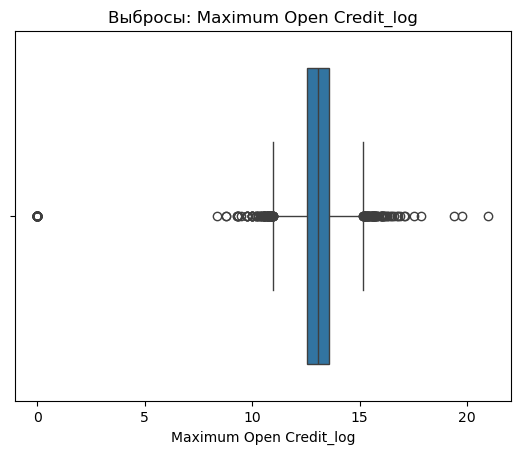

In [323]:
low, up = custom_nan_put.my._analyze_outliers('Maximum Open Credit_log', multiplier=3.0, return_low_up=True)

In [324]:
mask_outliers_maximum_open_credit_log = ~((custom_nan_put['Maximum Open Credit_log'] >= low) & (custom_nan_put['Maximum Open Credit_log'] <= up))

In [325]:
custom_nan_put['Maximum Open Credit_outliers'] = mask_outliers_maximum_open_credit_log.astype(int)

In [326]:
outliers = custom_nan_put[mask_outliers_maximum_open_credit_log].copy()
no_outliers = custom_nan_put[~mask_outliers_maximum_open_credit_log].copy()

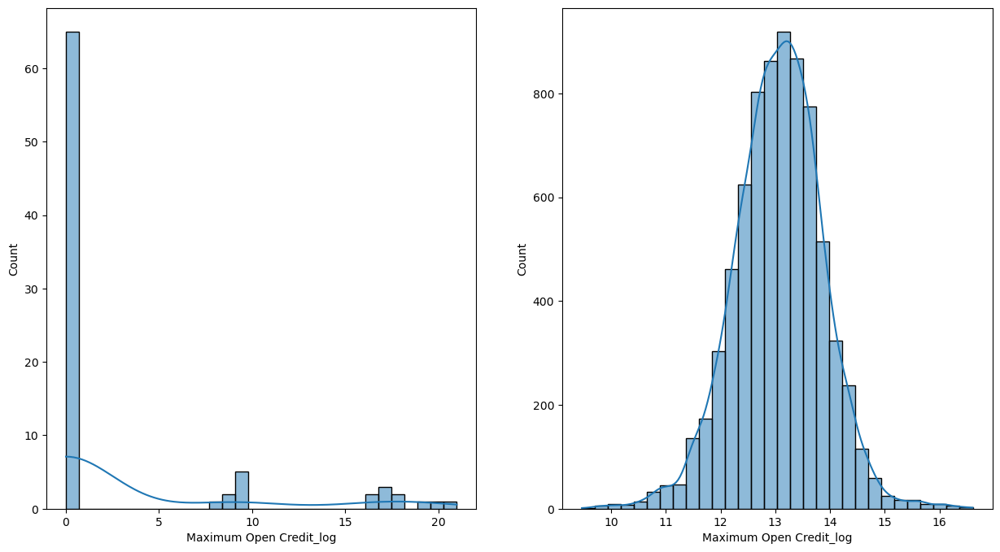

In [327]:
fast_plot_distubution_features_vs_features(outliers['Maximum Open Credit_log'], no_outliers['Maximum Open Credit_log'])

выбросы стали более различимы для исследования

рассмотрим детальнее более многочисленные выброс со значением нуль. гипотиза такова, если соотношение частот 0 и 1 по целевой перемнной незначимо по статистическому тесту хи квадрат, то замени все выбросы нуль на медиану освного распределения

осталбные выбросы, в следствии их незначительности, представим в виде границ квантилей

In [328]:
avr_no_outliers = no_outliers[TARGET]
avr_outliers = outliers.loc[(outliers['Maximum Open Credit_log']==0), TARGET]

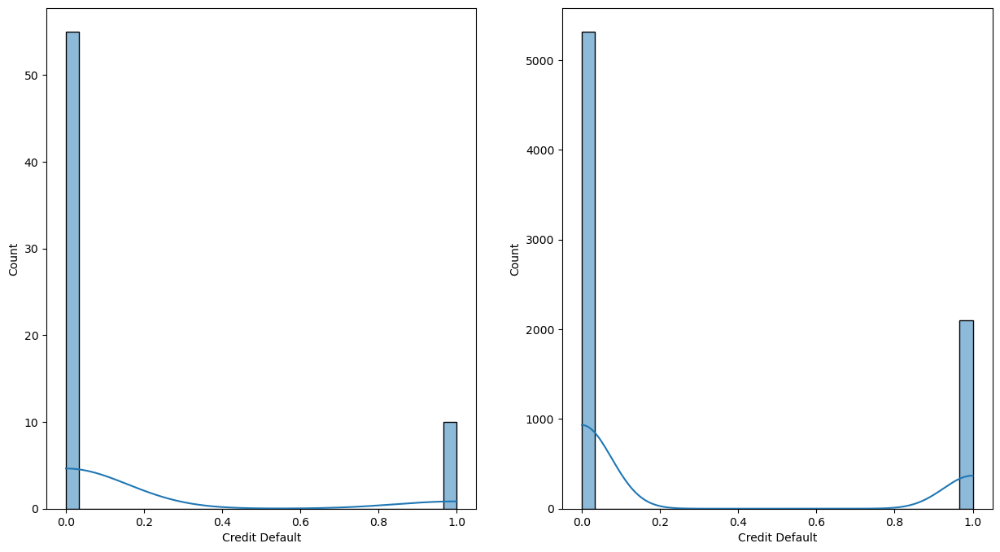

In [329]:
fast_plot_distubution_features_vs_features(avr_outliers, avr_no_outliers)

In [330]:
chi2_from_series(avr_no_outliers, avr_outliers, 
                'Без выбросов', 'С выбросами (Max Credit=0)')


Таблица сопряжённости:
χ² = 4.6999, p = 0.0302


(4.6999125794734935,
 0.030164151641094816,
                             No_Default  Default
 Без выбросов                      5317     2100
 С выбросами (Max Credit=0)          55       10)

Тест подсказывает, что данные статистически различны и значимы. Создадим новый признак, что будет отражать кто имел значение нуль. после чего, для устранения выброов, замним их нулями

In [331]:
custom_nan_put['Maximum Open Credit_log_zero'] = (mask_outliers_maximum_open_credit_log & (outliers['Maximum Open Credit_log']==0)).astype(int)

In [332]:
custom_nan_put.loc[(mask_outliers_maximum_open_credit_log & (outliers['Maximum Open Credit_log']==0)), 'Maximum Open Credit_log'] = no_outliers['Maximum Open Credit_log'].median()

In [333]:
custom_nan_put.loc[(mask_outliers_maximum_open_credit_log & (outliers['Maximum Open Credit_log']!=0) & (outliers['Maximum Open Credit_log'] < low)), 'Maximum Open Credit_log'] = low
custom_nan_put.loc[(mask_outliers_maximum_open_credit_log & (outliers['Maximum Open Credit_log']!=0) & (outliers['Maximum Open Credit_log'] > up)), 'Maximum Open Credit_log'] = up

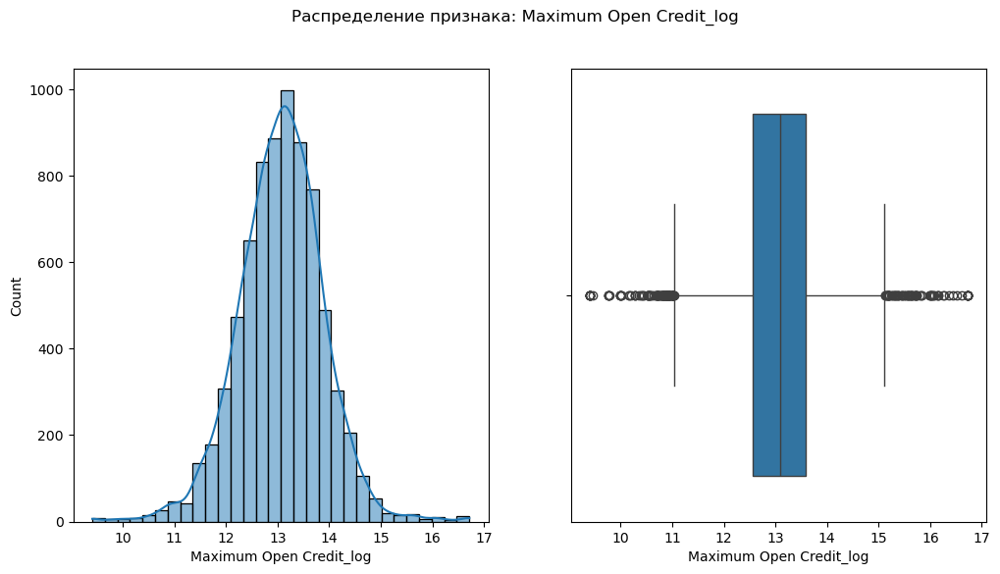

In [334]:
custom_nan_put.my._plot_distribution('Maximum Open Credit_log')

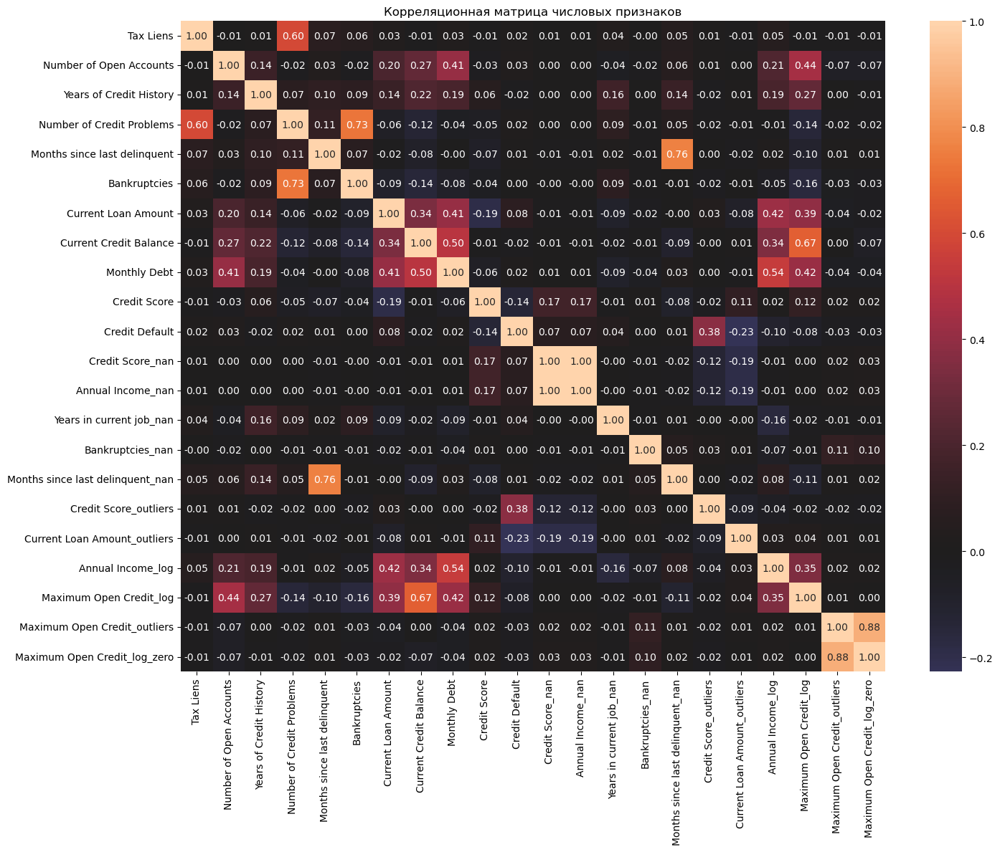

In [335]:
custom_nan_put.my._plot_heatmap_correlation()

In [336]:
analyze_metric_model(custom_nan_put)

d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


,model,f1_test,f1_train
0,LogisticRegression,0.545120,0.552193
1,DecisionTree,0.503753,0.618060
2,RandomForest,0.523891,0.546670
3,CatBoost,0.527508,0.534034
4,LightGBM,0.494647,0.855084


array([[<Axes: title={'center': 'Tax Liens'}>,
        <Axes: title={'center': 'Number of Open Accounts'}>,
        <Axes: title={'center': 'Years of Credit History'}>,
        <Axes: title={'center': 'Number of Credit Problems'}>,
        <Axes: title={'center': 'Months since last delinquent'}>],
       [<Axes: title={'center': 'Bankruptcies'}>,
        <Axes: title={'center': 'Current Loan Amount'}>,
        <Axes: title={'center': 'Current Credit Balance'}>,
        <Axes: title={'center': 'Monthly Debt'}>,
        <Axes: title={'center': 'Credit Score'}>],
       [<Axes: title={'center': 'Credit Default'}>,
        <Axes: title={'center': 'Credit Score_nan'}>,
        <Axes: title={'center': 'Annual Income_nan'}>,
        <Axes: title={'center': 'Years in current job_nan'}>,
        <Axes: title={'center': 'Bankruptcies_nan'}>],
       [<Axes: title={'center': 'Months since last delinquent_nan'}>,
        <Axes: title={'center': 'Credit Score_outliers'}>,
        <Axes: title={'cen

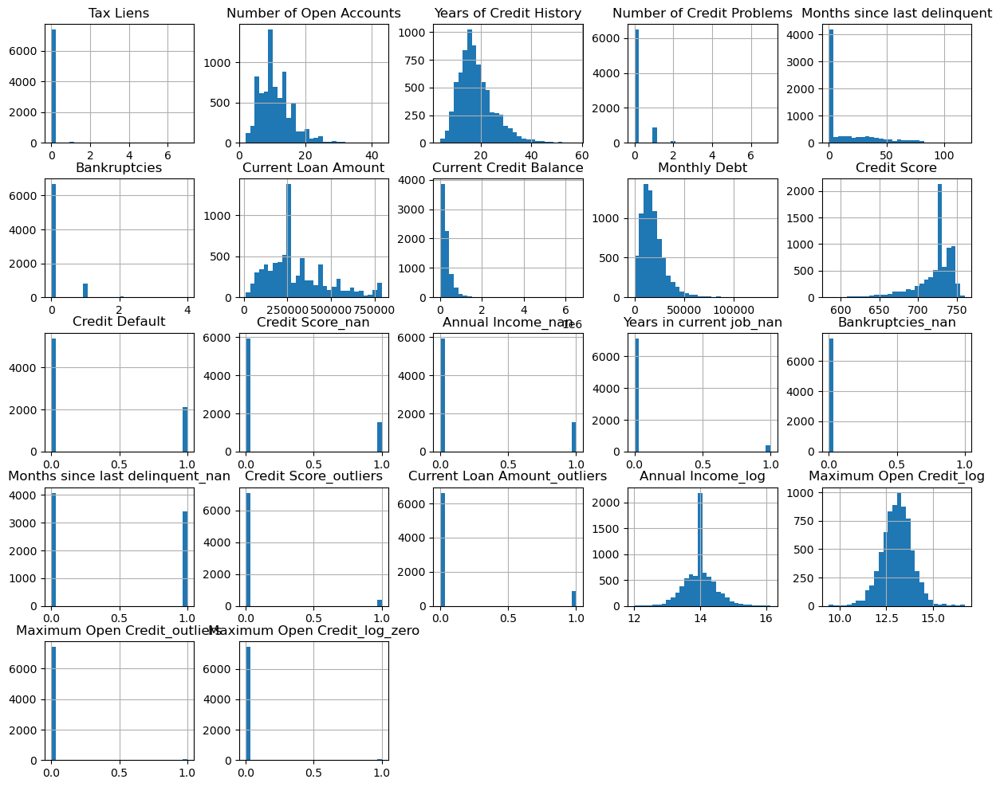

In [337]:
custom_nan_put.hist(bins=30, figsize=(15, 12))

### Рассмотрим Current Credit Balance

--- Анализ признака: Current Credit Balance ---


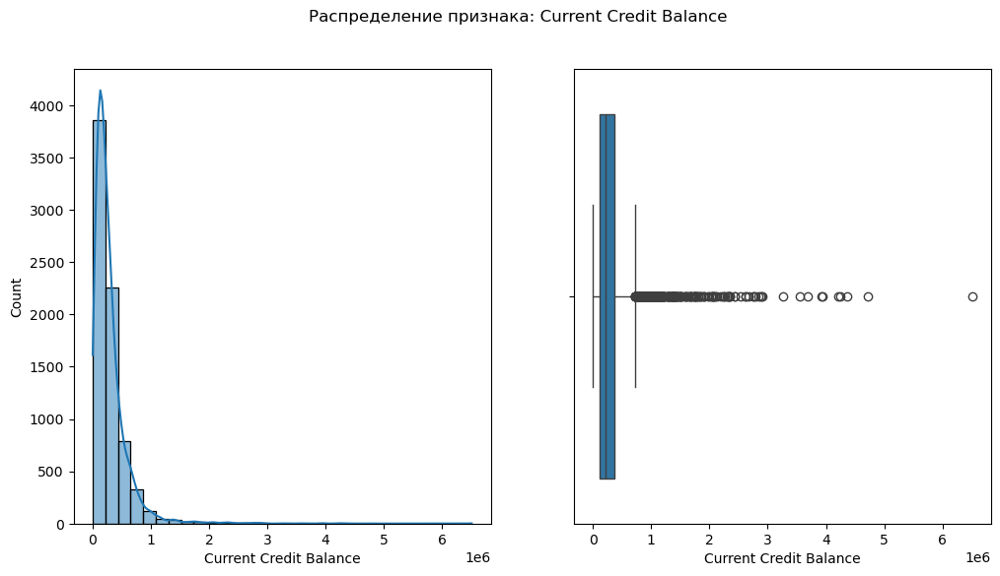

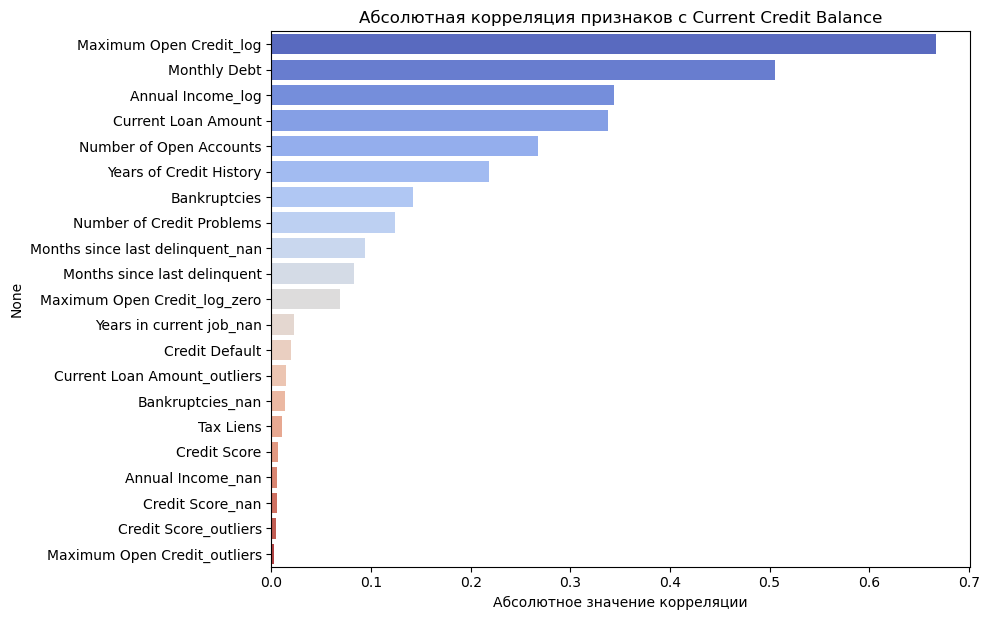

Выбросов: 440 (5.87%)


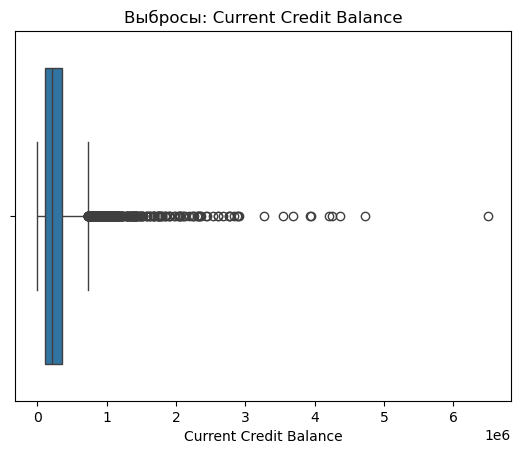

In [338]:
custom_nan_put.my.quick_analysis('Current Credit Balance')

Распределение слишком скошено. попробуем прологарифмировать

<Axes: xlabel='Current Credit Balance', ylabel='Count'>

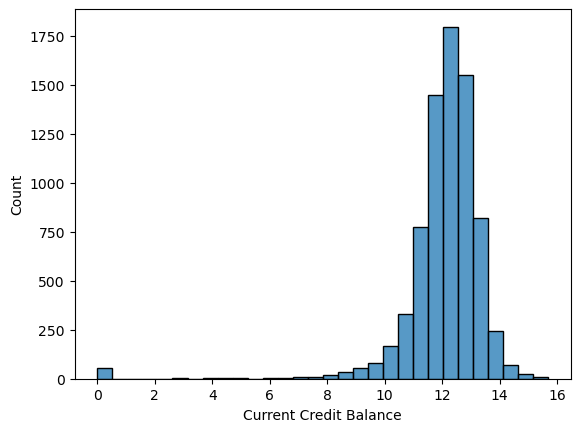

In [339]:
sns.histplot(np.log1p(custom_nan_put['Current Credit Balance']), bins=30)

In [340]:
custom_nan_put['Current Credit Balance_log'] = np.log1p(custom_nan_put['Current Credit Balance'])

Удалим исходный признак с ожидаемой высокой корреляции с новым признаком

In [341]:
custom_nan_put.drop('Current Credit Balance', axis=1, inplace=True)

Рассмотрим данные выбросы по логорифмированному признаку

Выбросов: 98 (1.31%)


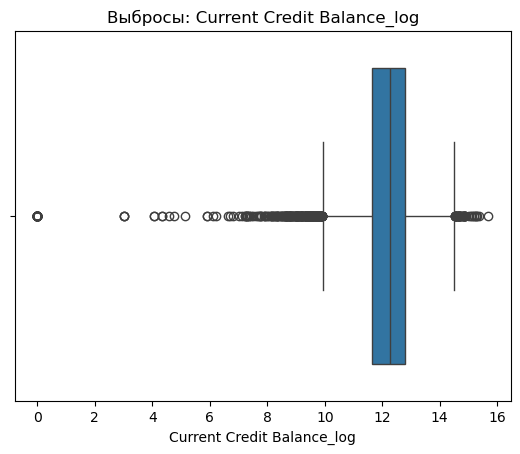

In [342]:
low, up = custom_nan_put.my._analyze_outliers('Current Credit Balance_log', multiplier=3.0, return_low_up=True)

In [343]:
mask_outliers_current_credit_balance_log = ~((custom_nan_put['Current Credit Balance_log'] >= low) & (custom_nan_put['Current Credit Balance_log'] <= up))

In [344]:
outliers = custom_nan_put[mask_outliers_current_credit_balance_log]
no_outliers = custom_nan_put[~mask_outliers_current_credit_balance_log]

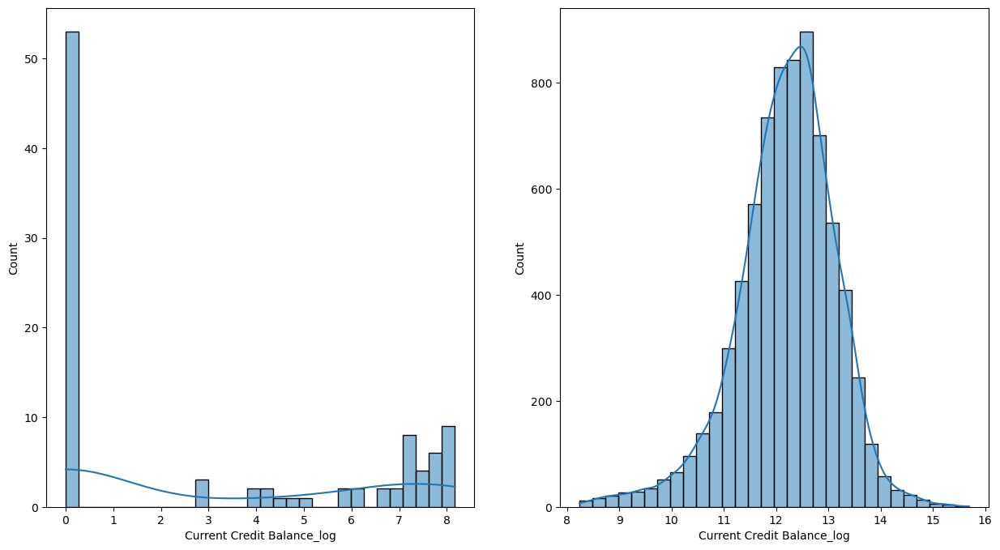

In [345]:
fast_plot_distubution_features_vs_features(outliers['Current Credit Balance_log'], no_outliers['Current Credit Balance_log'])

рассмотрим выюросы в виде 0, ввиду их многочисленность в данной подвыборке

смысл таков, что если статистической значимости по частотам целевой перенной не будет выявлено, то все нули будут заменены медианой исходной подвыборки признака, в противном случае будет создан новый признак, где 1 - эти нули, 0 - не нули

In [346]:
avr_no_outliers = no_outliers[TARGET]
avr_outliers = outliers.loc[(outliers['Current Credit Balance_log']==0), TARGET]

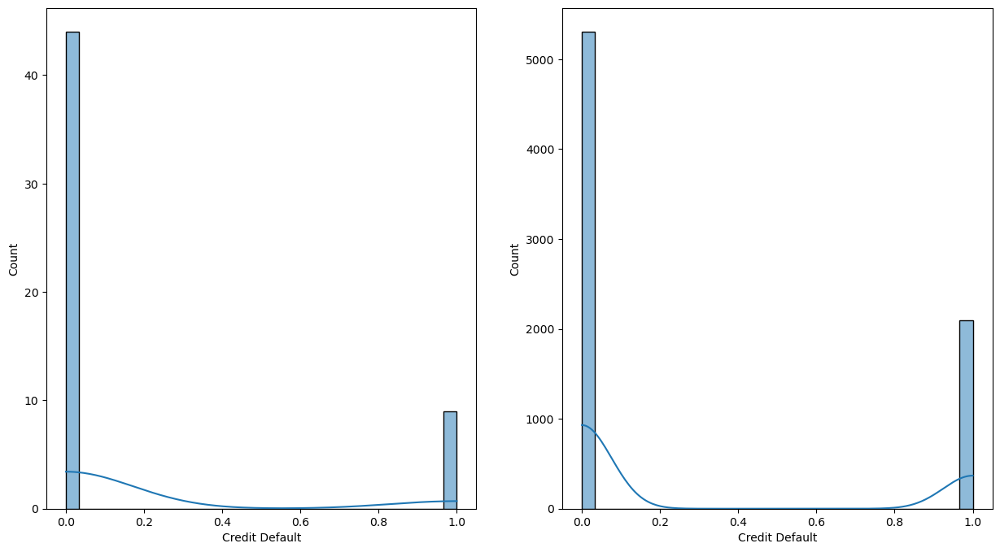

In [347]:
fast_plot_distubution_features_vs_features(avr_outliers, avr_no_outliers)

In [348]:
chi2_from_series(avr_no_outliers, avr_outliers, 
                'Без выбросов', 'С выбросами (Max Credit=0)')

Таблица сопряжённости:
χ² = 2.8075, p = 0.0938


(2.807477299288315,
 0.0938258140242039,
                             No_Default  Default
 Без выбросов                      5305     2097
 С выбросами (Max Credit=0)          44        9)

по хихи было установлено, что они не статистически различимы, поэтому проведем замену

In [349]:
custom_nan_put.loc[(mask_outliers_current_credit_balance_log & (outliers['Current Credit Balance_log']==0)), 'Current Credit Balance_log'] = no_outliers['Current Credit Balance_log'].median()

остальные данные заменим на граничные значения квантилей

In [350]:
custom_nan_put.loc[(mask_outliers_current_credit_balance_log & (outliers['Current Credit Balance_log']!=0) & (outliers['Current Credit Balance_log'] < low)), 'Current Credit Balance_log'] = low
custom_nan_put.loc[(mask_outliers_current_credit_balance_log & (outliers['Current Credit Balance_log']!=0) & (outliers['Current Credit Balance_log'] > up)), 'Current Credit Balance_log'] = up

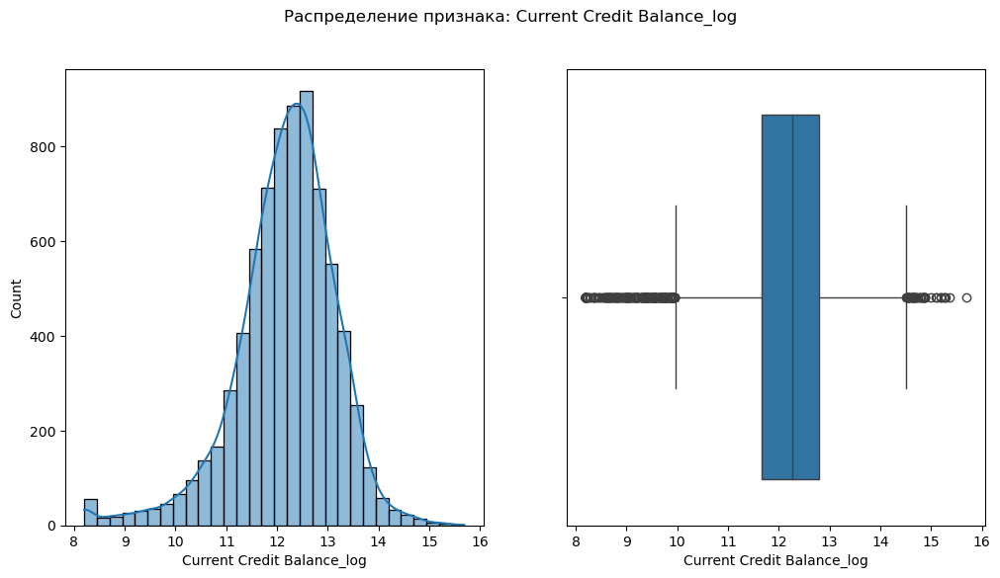

In [351]:
custom_nan_put.my._plot_distribution('Current Credit Balance_log')

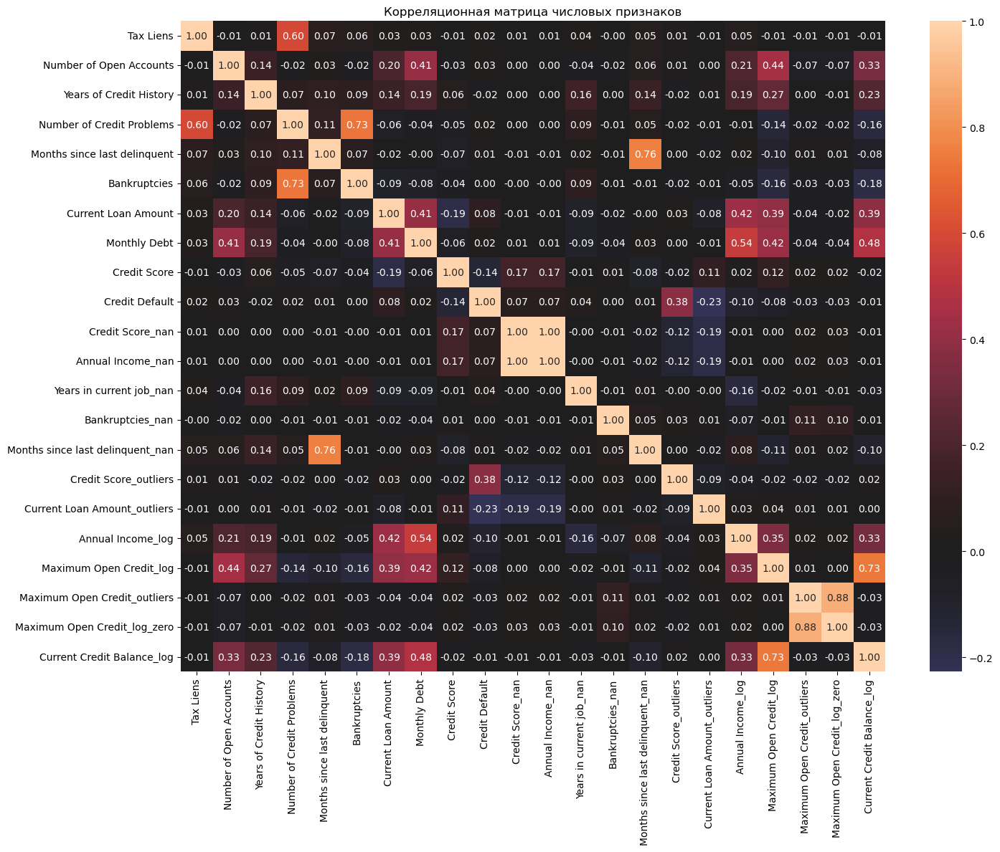

In [352]:
custom_nan_put.my._plot_heatmap_correlation()

In [353]:
analyze_metric_model(custom_nan_put)

d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


,model,f1_test,f1_train
0,LogisticRegression,0.547641,0.549558
1,DecisionTree,0.507463,0.618810
2,RandomForest,0.499033,0.543774
3,CatBoost,0.516174,0.518059
4,LightGBM,0.521925,0.852705


array([[<Axes: title={'center': 'Tax Liens'}>,
        <Axes: title={'center': 'Number of Open Accounts'}>,
        <Axes: title={'center': 'Years of Credit History'}>,
        <Axes: title={'center': 'Number of Credit Problems'}>,
        <Axes: title={'center': 'Months since last delinquent'}>],
       [<Axes: title={'center': 'Bankruptcies'}>,
        <Axes: title={'center': 'Current Loan Amount'}>,
        <Axes: title={'center': 'Monthly Debt'}>,
        <Axes: title={'center': 'Credit Score'}>,
        <Axes: title={'center': 'Credit Default'}>],
       [<Axes: title={'center': 'Credit Score_nan'}>,
        <Axes: title={'center': 'Annual Income_nan'}>,
        <Axes: title={'center': 'Years in current job_nan'}>,
        <Axes: title={'center': 'Bankruptcies_nan'}>,
        <Axes: title={'center': 'Months since last delinquent_nan'}>],
       [<Axes: title={'center': 'Credit Score_outliers'}>,
        <Axes: title={'center': 'Current Loan Amount_outliers'}>,
        <Axes: title

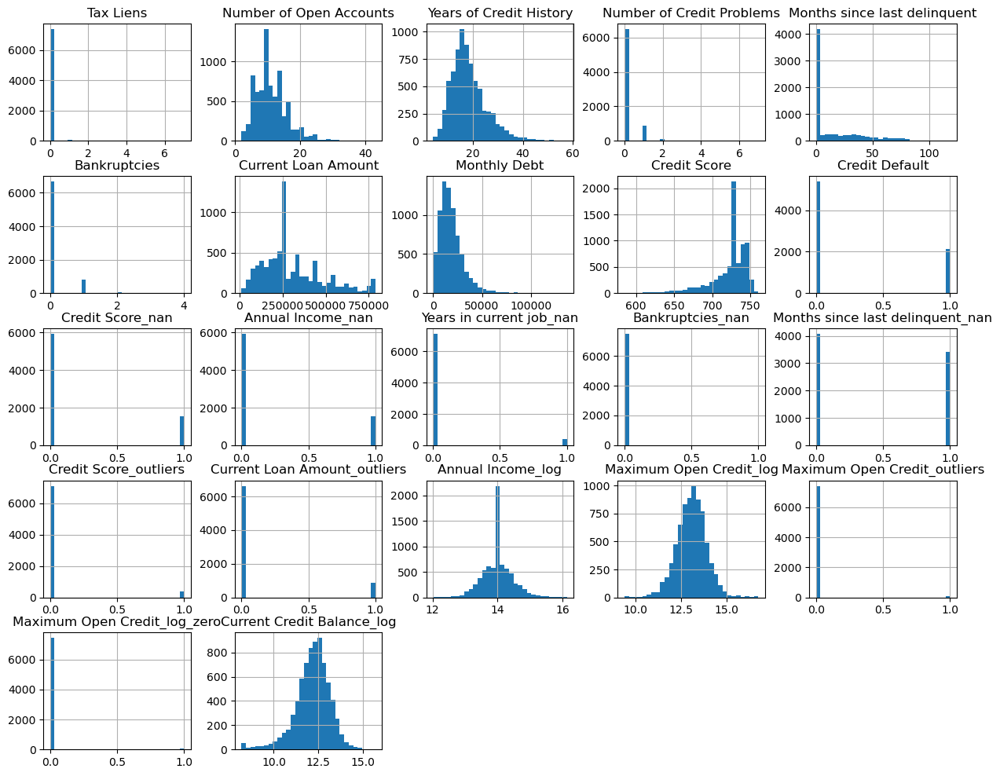

In [354]:
custom_nan_put.hist(bins=30, figsize=(15, 12))

### Рассмотрим Monthly Dept

--- Анализ признака: Monthly Debt ---


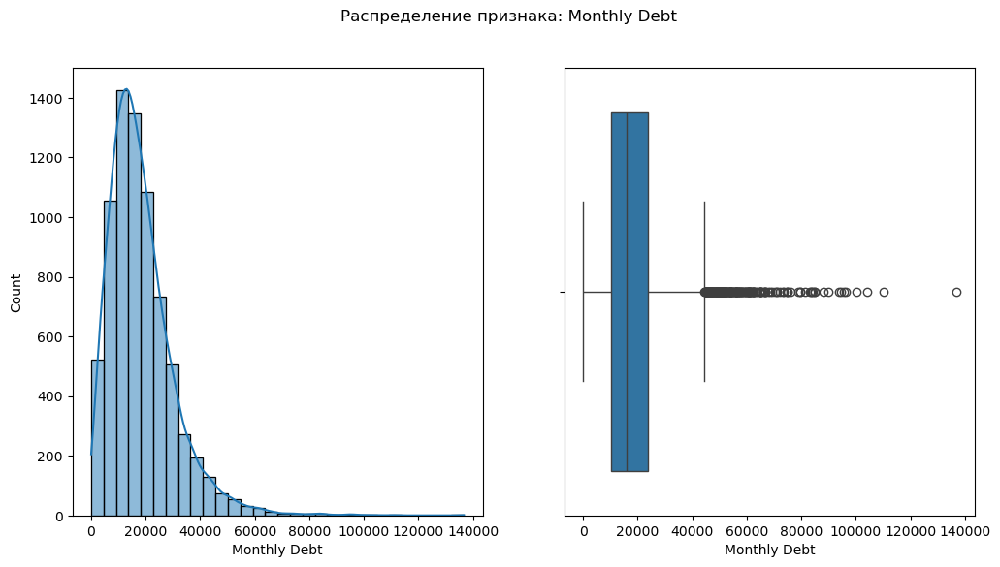

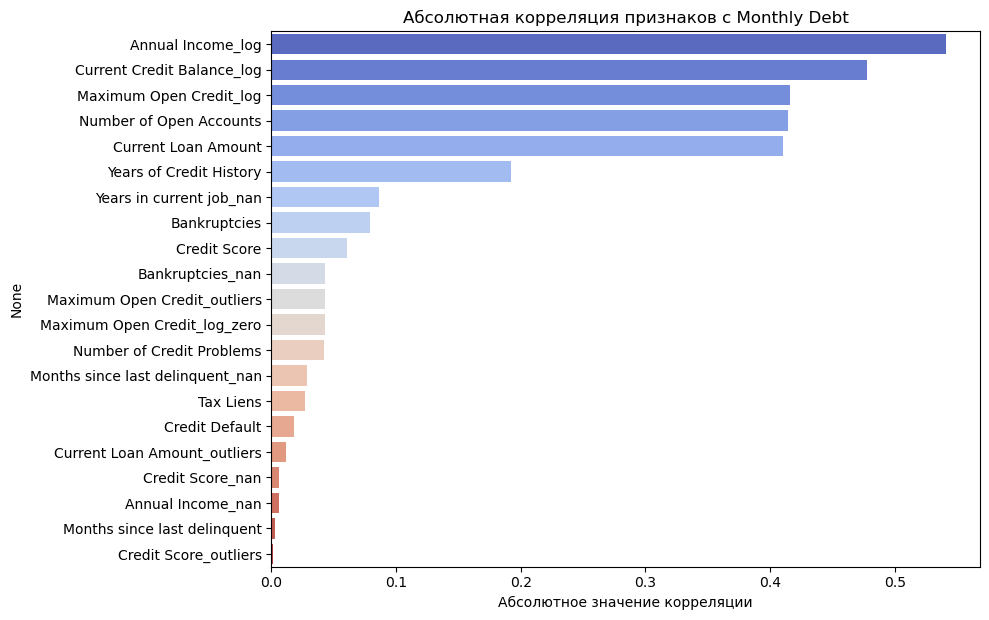

Выбросов: 255 (3.40%)


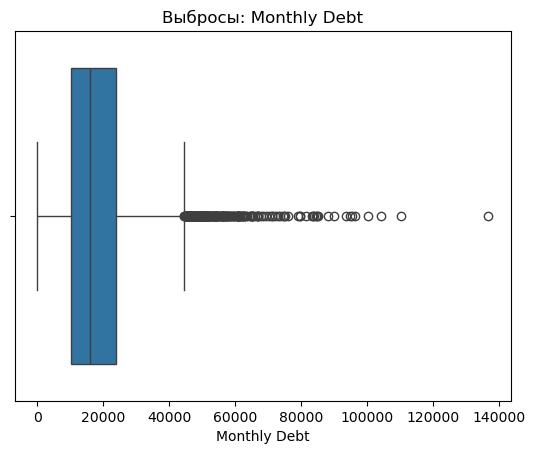

In [355]:
custom_nan_put.my.quick_analysis('Monthly Debt')

распрееление скошено. попробуем логарифмирование для того, чтобы лучше различить выбросы

<Axes: xlabel='Monthly Debt', ylabel='Count'>

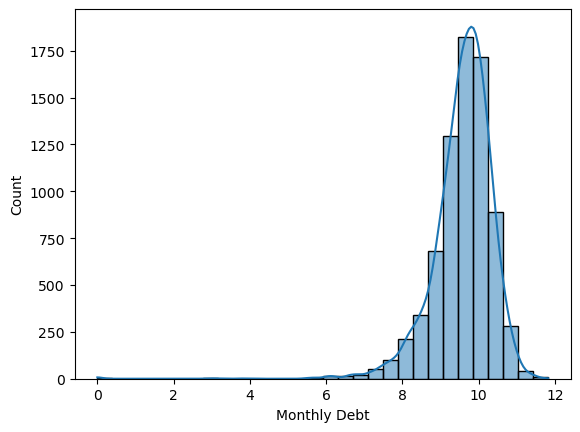

In [356]:
sns.histplot(np.log1p(custom_nan_put['Monthly Debt']), bins=30, kde=True)

In [357]:
custom_nan_put['Monthly Debt_log'] = np.log1p(custom_nan_put['Monthly Debt'])

удалим исходный признак с связи ожидаемой выскойо корреляции

In [358]:
custom_nan_put.drop(columns='Monthly Debt', axis=1, inplace=True)

Выбросов: 39 (0.52%)


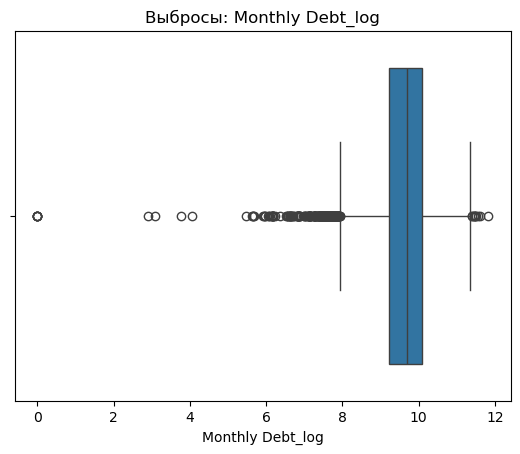

In [359]:
low, up = custom_nan_put.my._analyze_outliers('Monthly Debt_log', multiplier=3.0, return_low_up=True)

In [360]:
mask_outliers_monthly_debt_log = ~((custom_nan_put['Monthly Debt_log'] >= low) & (custom_nan_put['Monthly Debt_log'] <= up))

In [361]:
outliers = custom_nan_put[mask_outliers_monthly_debt_log]
no_outliers = custom_nan_put[~mask_outliers_monthly_debt_log]

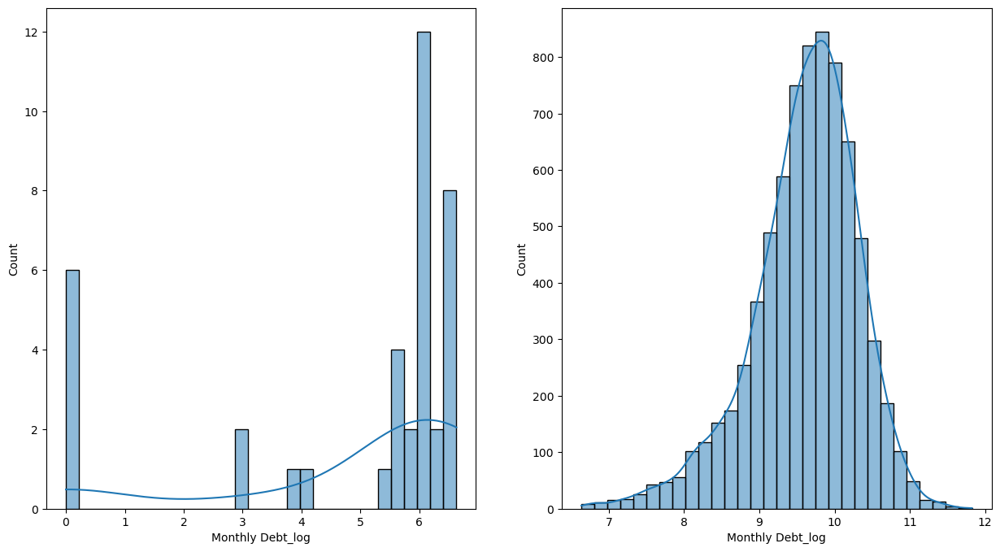

In [362]:
fast_plot_distubution_features_vs_features(outliers['Monthly Debt_log'], no_outliers['Monthly Debt_log'])

In [363]:
avr_no_outliers = no_outliers[TARGET]
avr_outliers = outliers[TARGET]

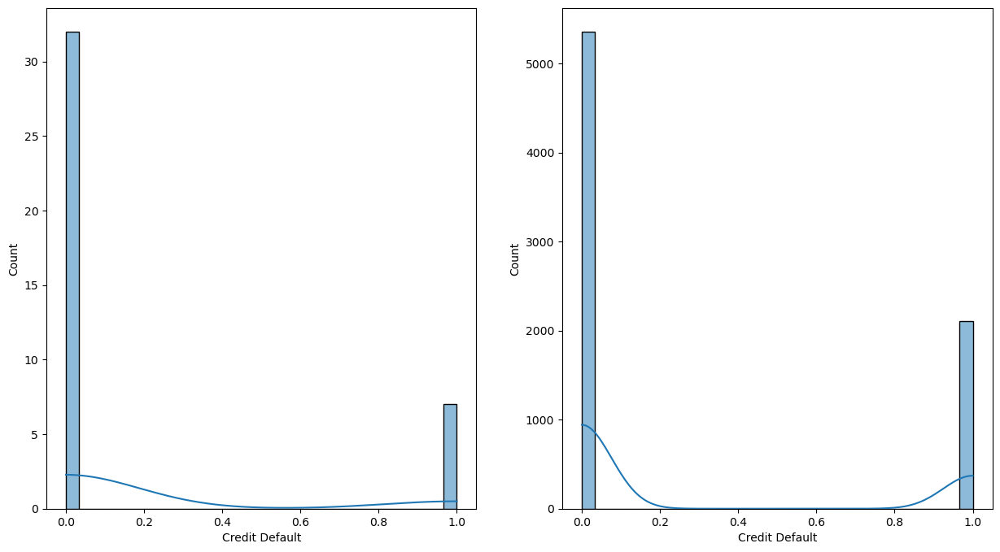

In [364]:
fast_plot_distubution_features_vs_features(avr_outliers, avr_no_outliers)

In [365]:
chi2_from_series(avr_no_outliers, avr_outliers, 
                'Без выбросов', 'С выбросами (Max Credit=0)')

Таблица сопряжённости:
χ² = 1.5493, p = 0.2132


(1.5492767681083317,
 0.2132422412447833,
                             No_Default  Default
 Без выбросов                      5355     2106
 С выбросами (Max Credit=0)          32        7)

выюросы и исходная подвыборка не особо различимы статитически. заменим их медианой

In [366]:
custom_nan_put.loc[(mask_outliers_current_credit_balance_log), 'Monthly Debt_log'] = no_outliers['Monthly Debt_log'].median()

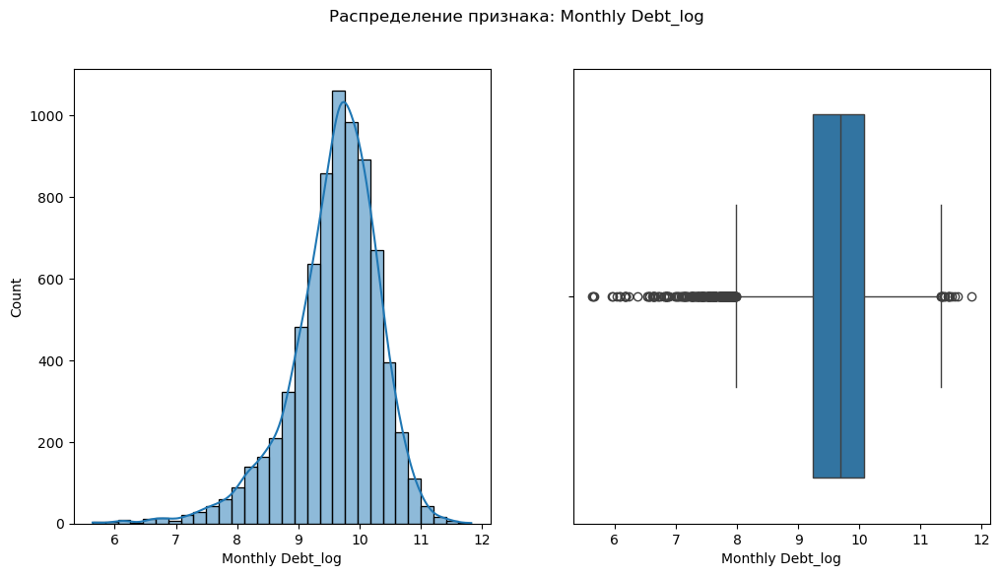

In [367]:
custom_nan_put.my._plot_distribution('Monthly Debt_log')

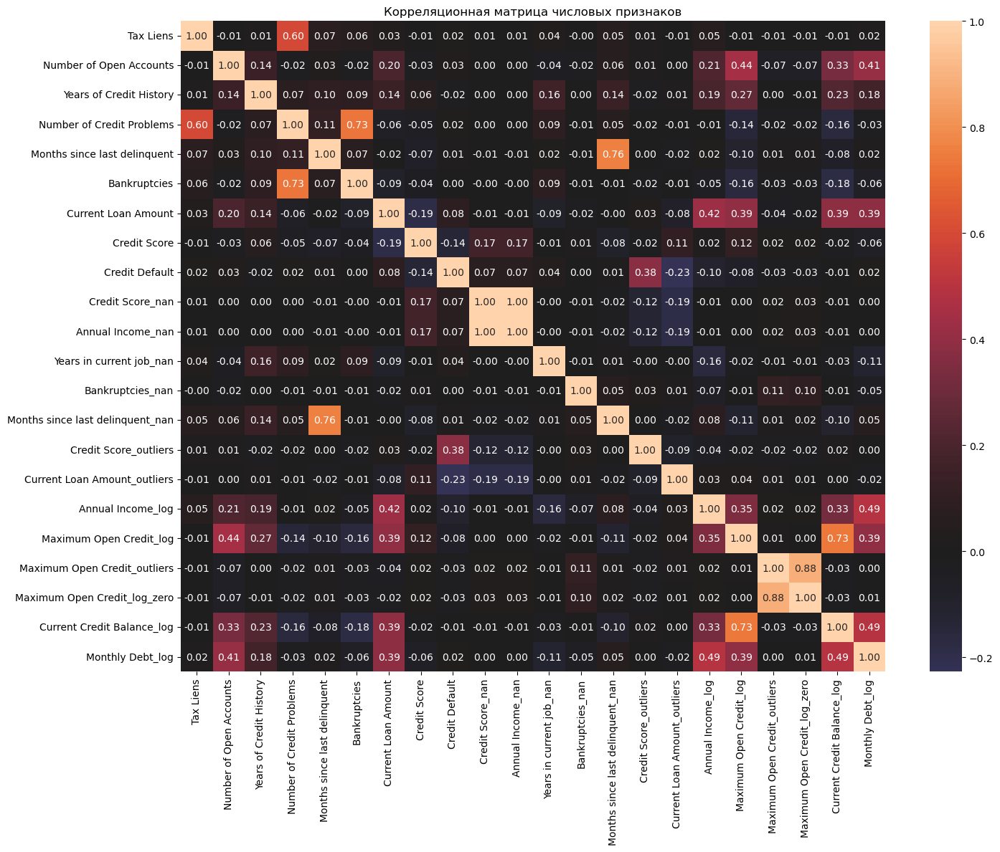

In [368]:
custom_nan_put.my._plot_heatmap_correlation()

In [369]:
analyze_metric_model(custom_nan_put, random_state=10)

d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


,model,f1_test,f1_train
0,LogisticRegression,0.555147,0.547842
1,DecisionTree,0.524252,0.603872
2,RandomForest,0.537133,0.540101
3,CatBoost,0.530892,0.514055
4,LightGBM,0.530043,0.859204


array([[<Axes: title={'center': 'Tax Liens'}>,
        <Axes: title={'center': 'Number of Open Accounts'}>,
        <Axes: title={'center': 'Years of Credit History'}>,
        <Axes: title={'center': 'Number of Credit Problems'}>,
        <Axes: title={'center': 'Months since last delinquent'}>],
       [<Axes: title={'center': 'Bankruptcies'}>,
        <Axes: title={'center': 'Current Loan Amount'}>,
        <Axes: title={'center': 'Credit Score'}>,
        <Axes: title={'center': 'Credit Default'}>,
        <Axes: title={'center': 'Credit Score_nan'}>],
       [<Axes: title={'center': 'Annual Income_nan'}>,
        <Axes: title={'center': 'Years in current job_nan'}>,
        <Axes: title={'center': 'Bankruptcies_nan'}>,
        <Axes: title={'center': 'Months since last delinquent_nan'}>,
        <Axes: title={'center': 'Credit Score_outliers'}>],
       [<Axes: title={'center': 'Current Loan Amount_outliers'}>,
        <Axes: title={'center': 'Annual Income_log'}>,
        <Axes: 

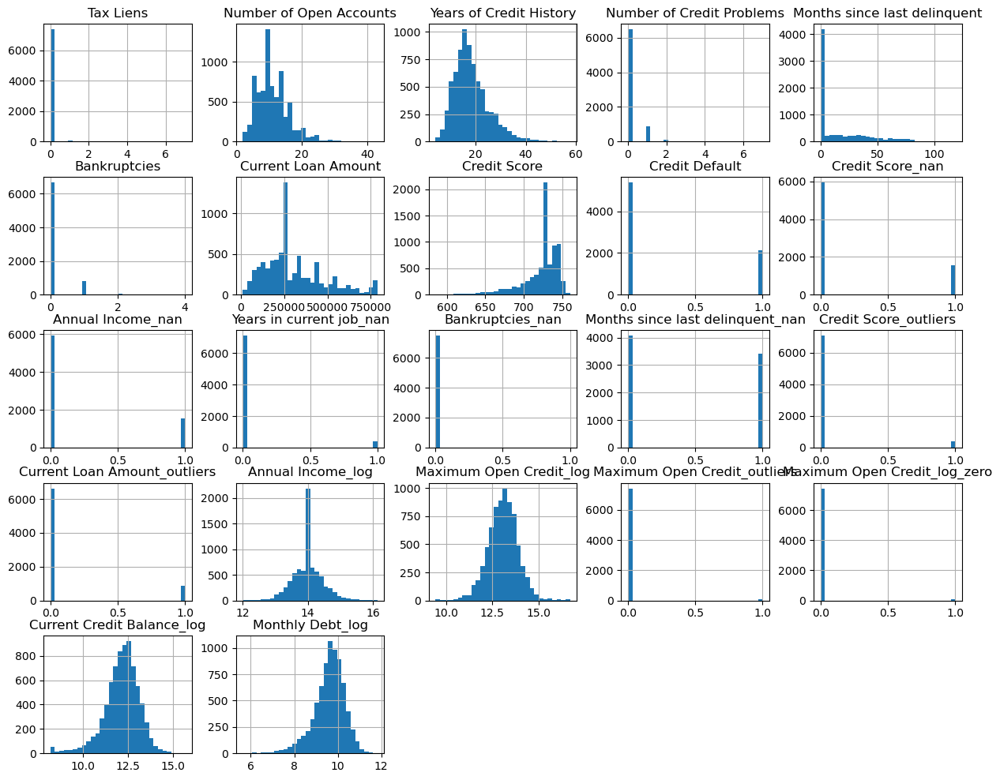

In [370]:
custom_nan_put.hist(bins=30, figsize=(15, 12))

### Рассмотрим Tax Liens

--- Анализ признака: Tax Liens ---


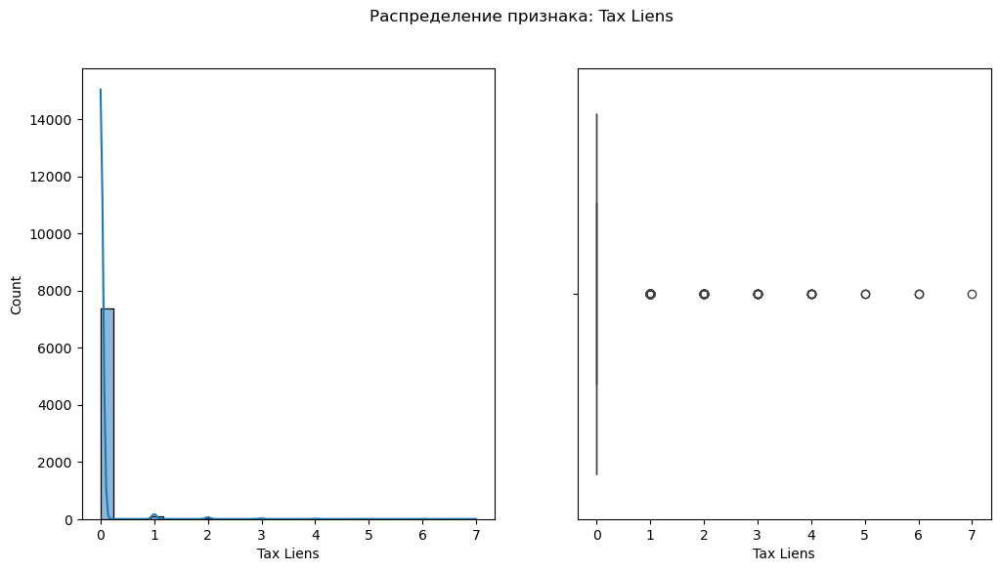

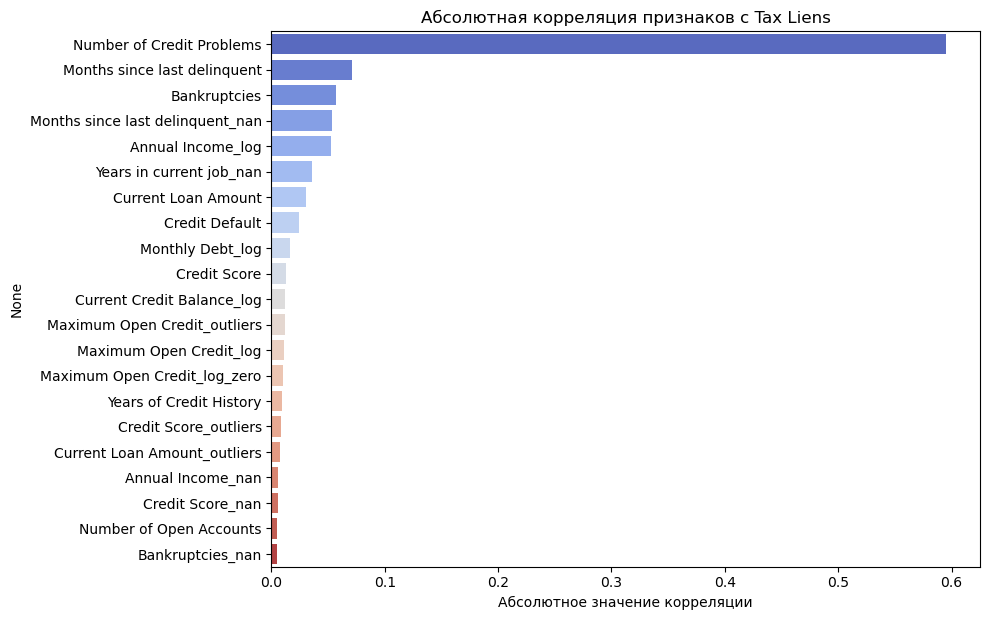

Выбросов: 134 (1.79%)


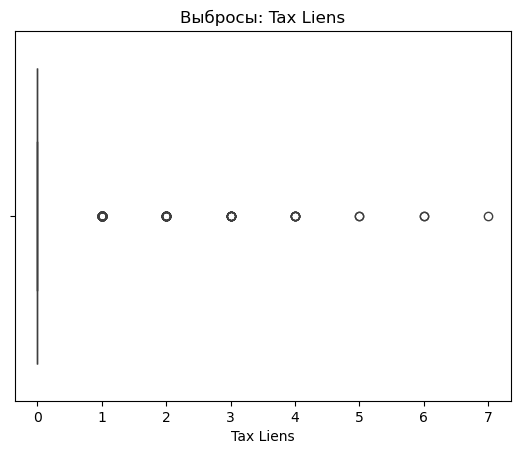

In [371]:
custom_nan_put.my.quick_analysis('Tax Liens', multiplier=1.5)

Данные признак отражает, на сколько клиент завысил свой доход. чем сильнее отлично от нуля значение, тем сильнее было завышен доход

однако количество людей которых завысили свои доходы лишь 134 при 7500 объектов наблюдения. Создадим новый бинарный признак, в котором 0 - люди без грехов, 1 - люди с одним и более грехов

In [372]:
custom_nan_put['Tax Liens_has'] = (custom_nan_put['Tax Liens'] > 0).astype(int)

удалим исходный пизнак из за ожидаемо высокой корреляции

In [373]:
custom_nan_put.drop('Tax Liens', axis=1, inplace=True)

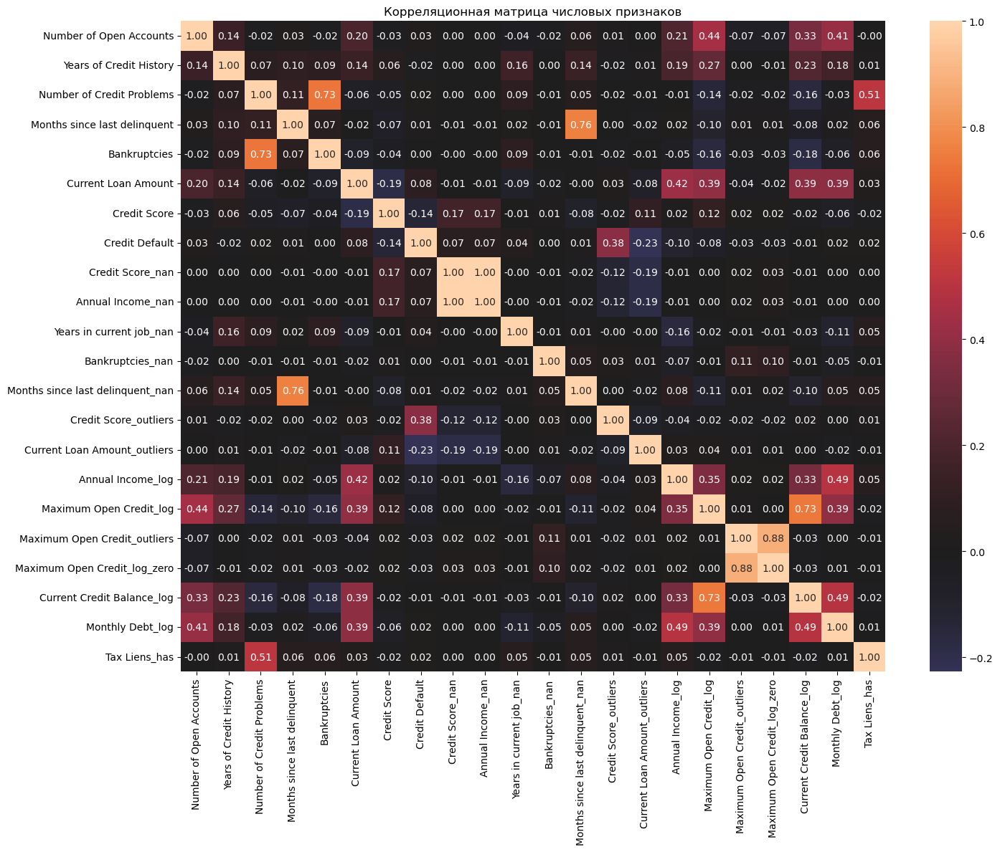

In [374]:
custom_nan_put.my._plot_heatmap_correlation()

In [375]:
analyze_metric_model(custom_nan_put)

d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


,model,f1_test,f1_train
0,LogisticRegression,0.550323,0.545878
1,DecisionTree,0.508127,0.616734
2,RandomForest,0.514286,0.547128
3,CatBoost,0.525288,0.546198
4,LightGBM,0.497845,0.844965


array([[<Axes: title={'center': 'Number of Open Accounts'}>,
        <Axes: title={'center': 'Years of Credit History'}>,
        <Axes: title={'center': 'Number of Credit Problems'}>,
        <Axes: title={'center': 'Months since last delinquent'}>,
        <Axes: title={'center': 'Bankruptcies'}>],
       [<Axes: title={'center': 'Current Loan Amount'}>,
        <Axes: title={'center': 'Credit Score'}>,
        <Axes: title={'center': 'Credit Default'}>,
        <Axes: title={'center': 'Credit Score_nan'}>,
        <Axes: title={'center': 'Annual Income_nan'}>],
       [<Axes: title={'center': 'Years in current job_nan'}>,
        <Axes: title={'center': 'Bankruptcies_nan'}>,
        <Axes: title={'center': 'Months since last delinquent_nan'}>,
        <Axes: title={'center': 'Credit Score_outliers'}>,
        <Axes: title={'center': 'Current Loan Amount_outliers'}>],
       [<Axes: title={'center': 'Annual Income_log'}>,
        <Axes: title={'center': 'Maximum Open Credit_log'}>,
 

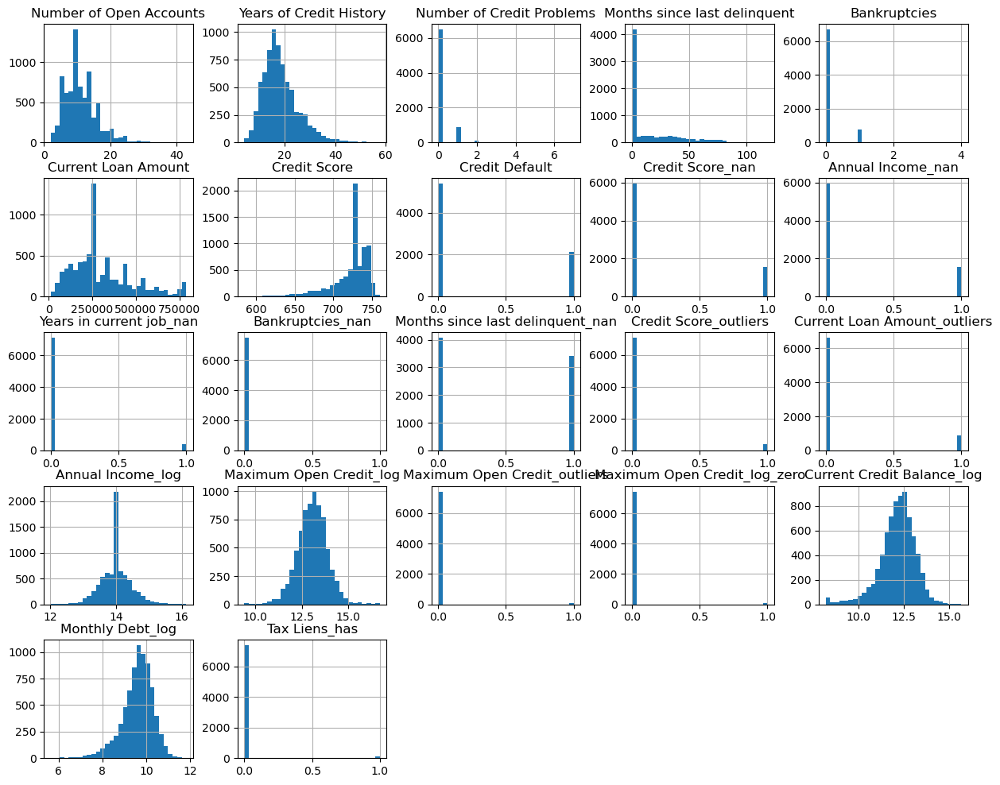

In [376]:
custom_nan_put.hist(bins=30, figsize=(15, 12))

### Рассмотрим Number Credit Problems

--- Анализ признака: Number of Credit Problems ---


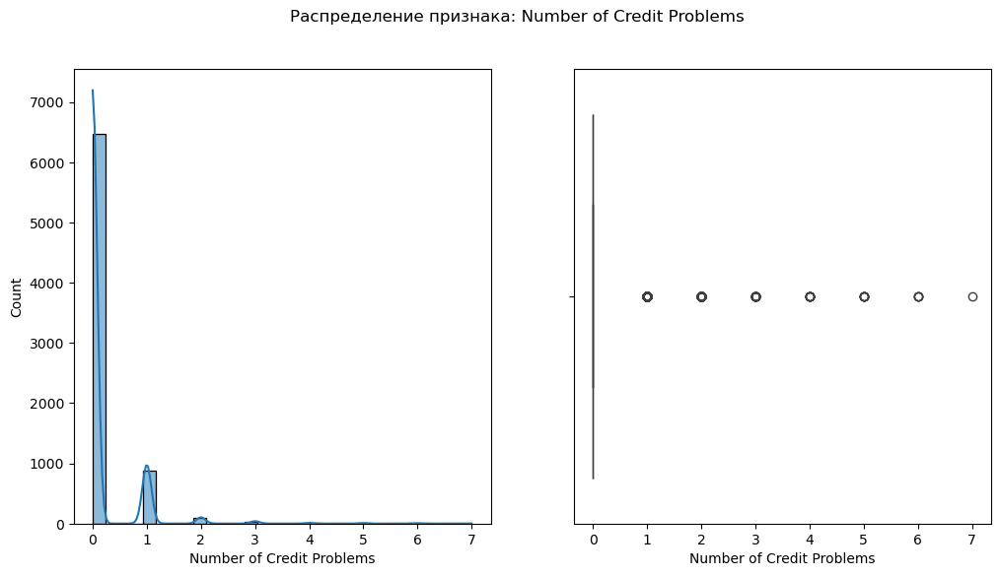

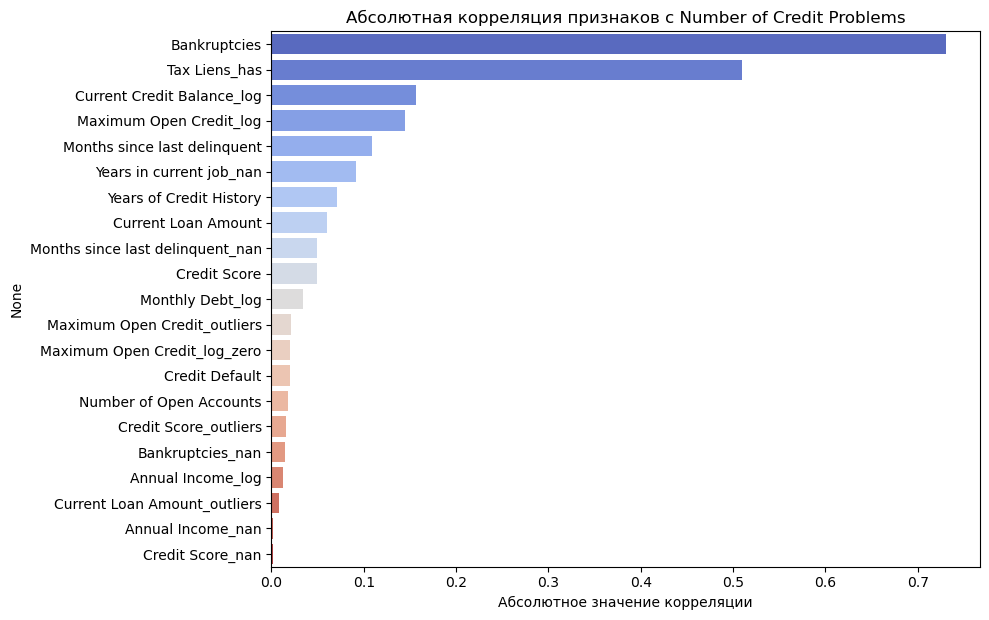

Выбросов: 1031 (13.75%)


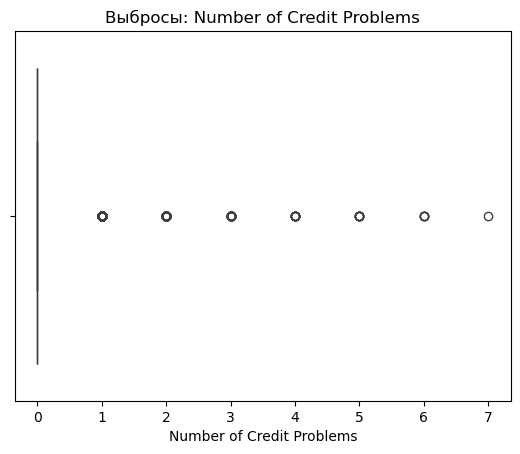

In [377]:
custom_nan_put.my.quick_analysis('Number of Credit Problems')

создадим новый признак, где будут 0 - нет проблема, 1 - малые проблемы, 2 - серьезные проблемы

In [378]:
conditions = [
    custom_nan_put['Number of Credit Problems'] == 0,
    (custom_nan_put['Number of Credit Problems'] == 1),
    (custom_nan_put['Number of Credit Problems'] > 1)
]

custom_nan_put['Number of Credit Problems_has'] = np.select(conditions, [0, 1, 2], default=0)

исключим исзодный признак из за ожидаемо высокой корреляции с новым

In [379]:
custom_nan_put.drop('Number of Credit Problems', axis=1, inplace=True)

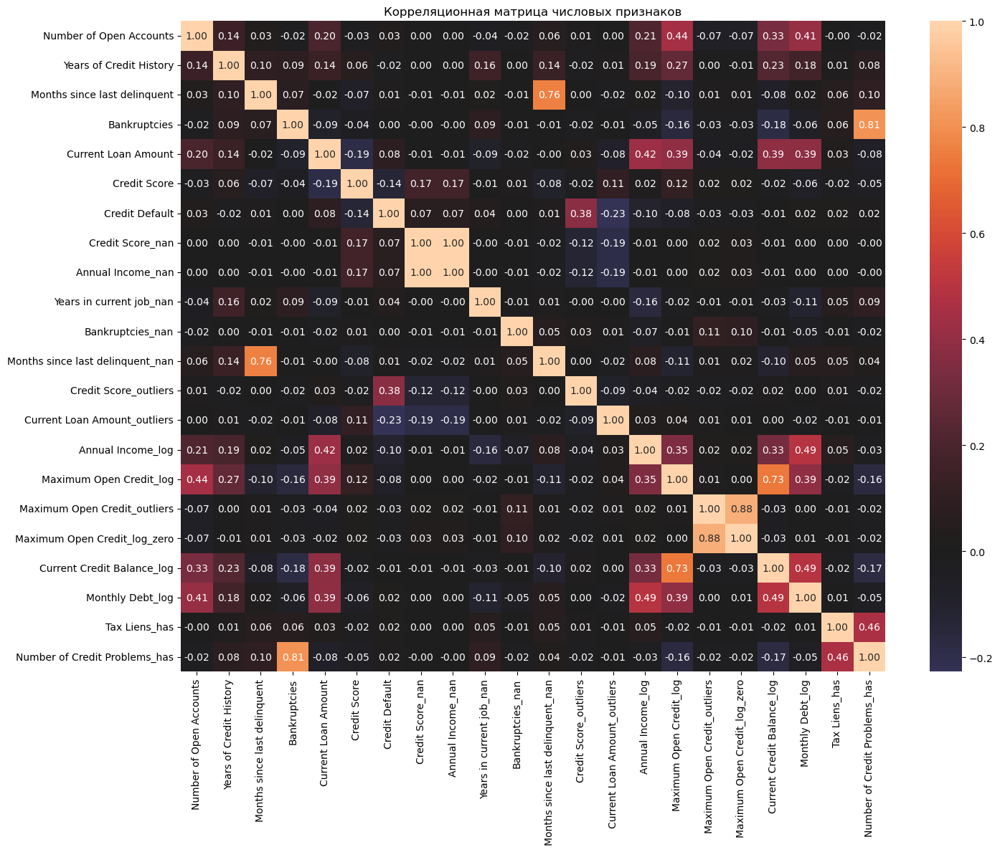

In [380]:
custom_nan_put.my._plot_heatmap_correlation()

In [381]:
analyze_metric_model(custom_nan_put)

d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


,model,f1_test,f1_train
0,LogisticRegression,0.549309,0.545073
1,DecisionTree,0.503004,0.616866
2,RandomForest,0.518452,0.543508
3,CatBoost,0.515065,0.517702
4,LightGBM,0.511727,0.857370


array([[<Axes: title={'center': 'Number of Open Accounts'}>,
        <Axes: title={'center': 'Years of Credit History'}>,
        <Axes: title={'center': 'Months since last delinquent'}>,
        <Axes: title={'center': 'Bankruptcies'}>,
        <Axes: title={'center': 'Current Loan Amount'}>],
       [<Axes: title={'center': 'Credit Score'}>,
        <Axes: title={'center': 'Credit Default'}>,
        <Axes: title={'center': 'Credit Score_nan'}>,
        <Axes: title={'center': 'Annual Income_nan'}>,
        <Axes: title={'center': 'Years in current job_nan'}>],
       [<Axes: title={'center': 'Bankruptcies_nan'}>,
        <Axes: title={'center': 'Months since last delinquent_nan'}>,
        <Axes: title={'center': 'Credit Score_outliers'}>,
        <Axes: title={'center': 'Current Loan Amount_outliers'}>,
        <Axes: title={'center': 'Annual Income_log'}>],
       [<Axes: title={'center': 'Maximum Open Credit_log'}>,
        <Axes: title={'center': 'Maximum Open Credit_outliers'}>

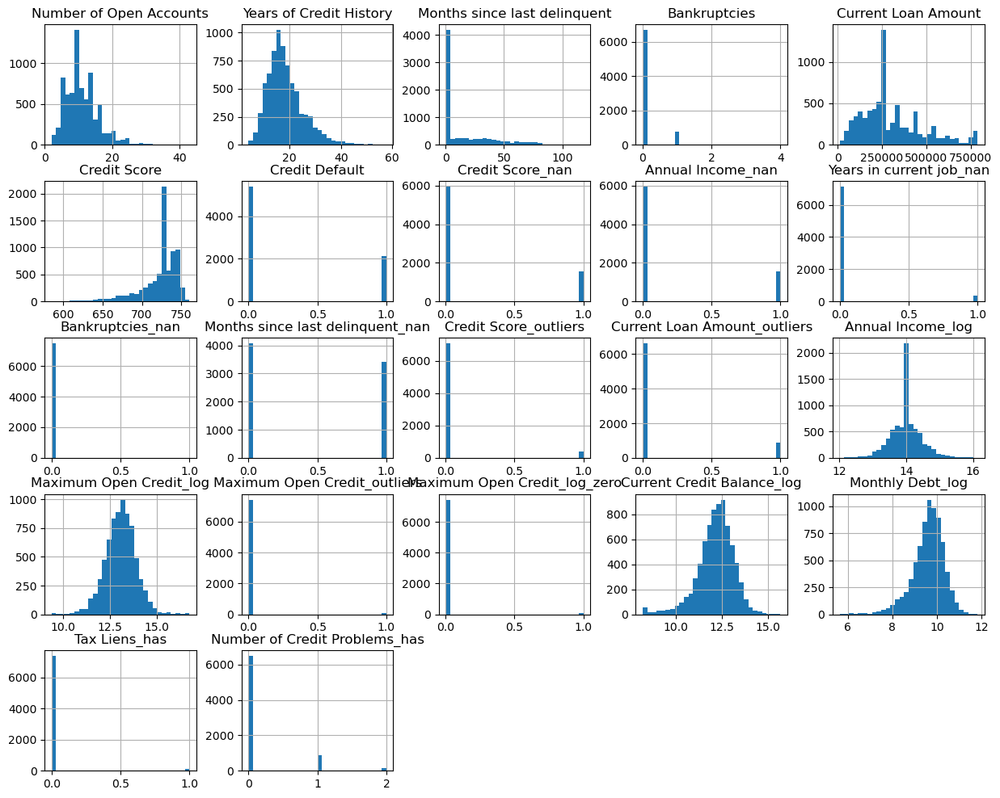

In [382]:
custom_nan_put.hist(bins=30, figsize=(15, 12))

### Рассмотрим Bankruptcies

--- Анализ признака: Bankruptcies ---


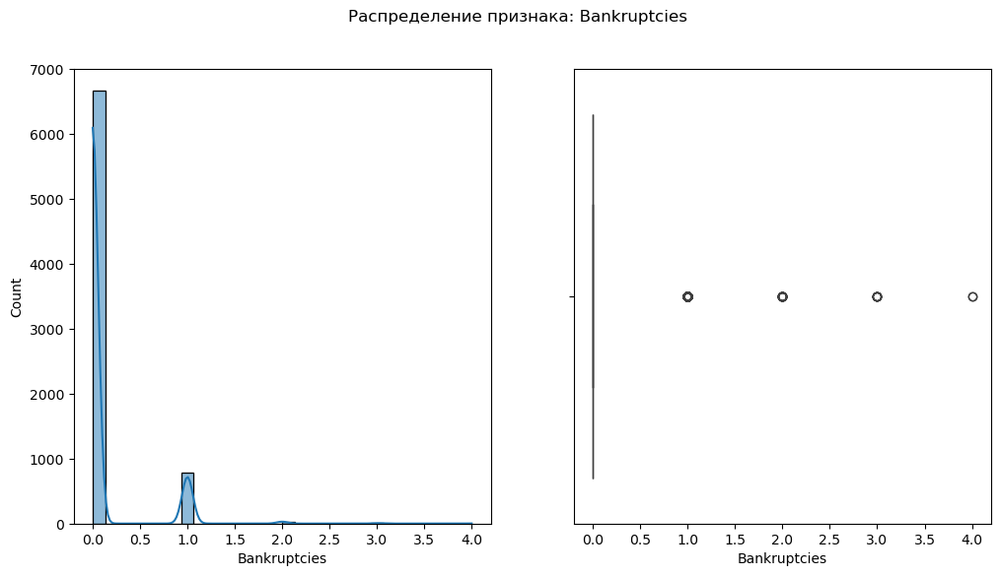

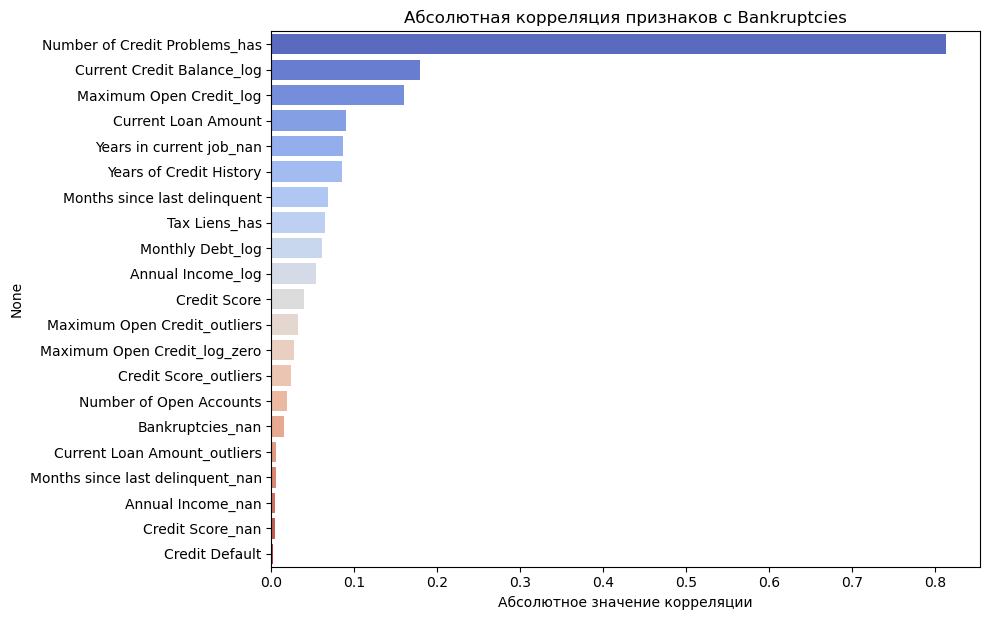

Выбросов: 826 (11.01%)


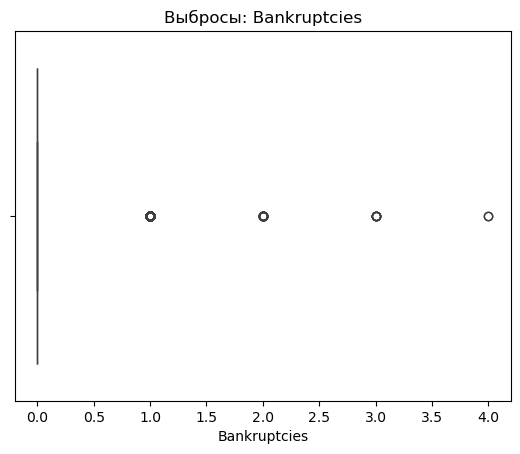

In [383]:
custom_nan_put.my.quick_analysis('Bankruptcies')

создадим новый признак отражающий то, были ли банкроства

In [384]:
custom_nan_put['Bankruptcies_has'] = (custom_nan_put['Bankruptcies'] > 0).astype(int)

удалим исходный признак из за ожидаемой высокой корреляции

In [385]:
custom_nan_put.drop('Bankruptcies', axis=1, inplace=True)

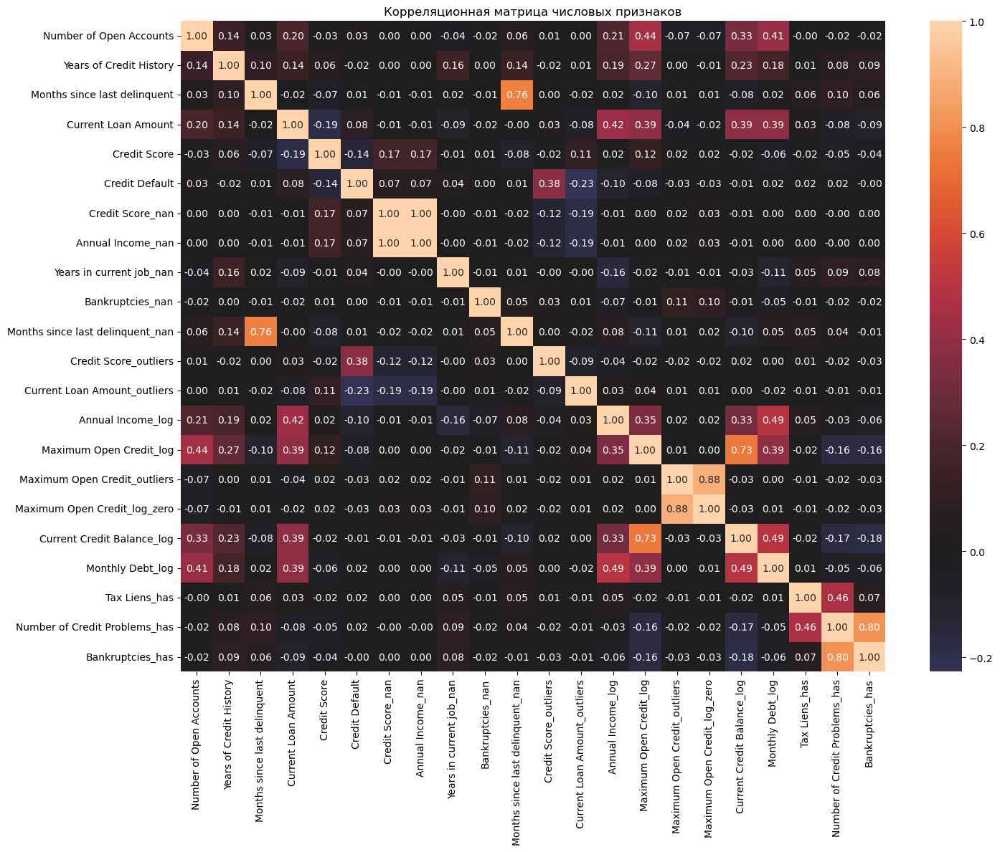

In [386]:
custom_nan_put.my._plot_heatmap_correlation()

In [387]:
analyze_metric_model(custom_nan_put)

d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


,model,f1_test,f1_train
0,LogisticRegression,0.548983,0.545751
1,DecisionTree,0.504274,0.615253
2,RandomForest,0.513744,0.545541
3,CatBoost,0.532688,0.528464
4,LightGBM,0.497872,0.850159


### Рассмотрим Number of Open Account

--- Анализ признака: Number of Open Accounts ---


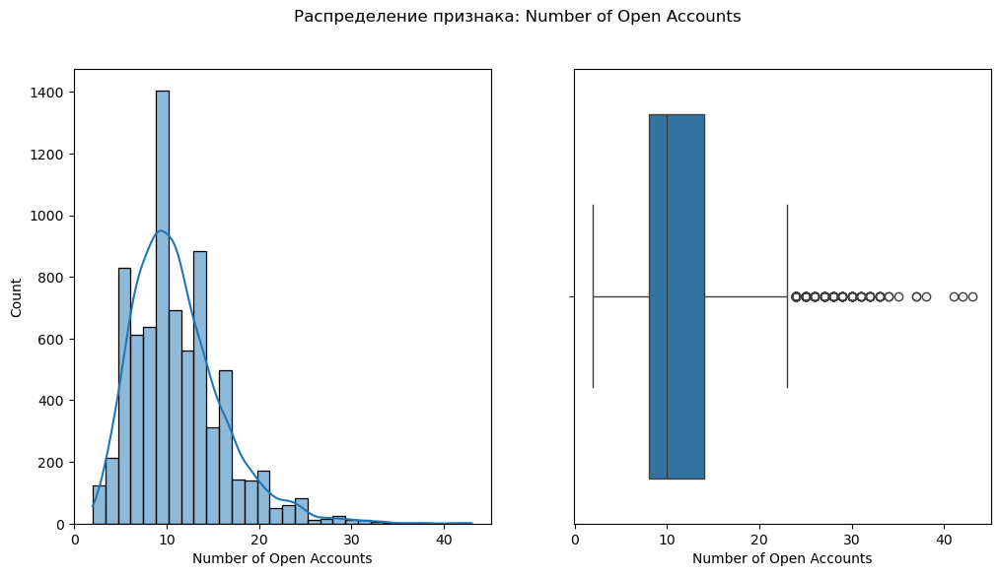

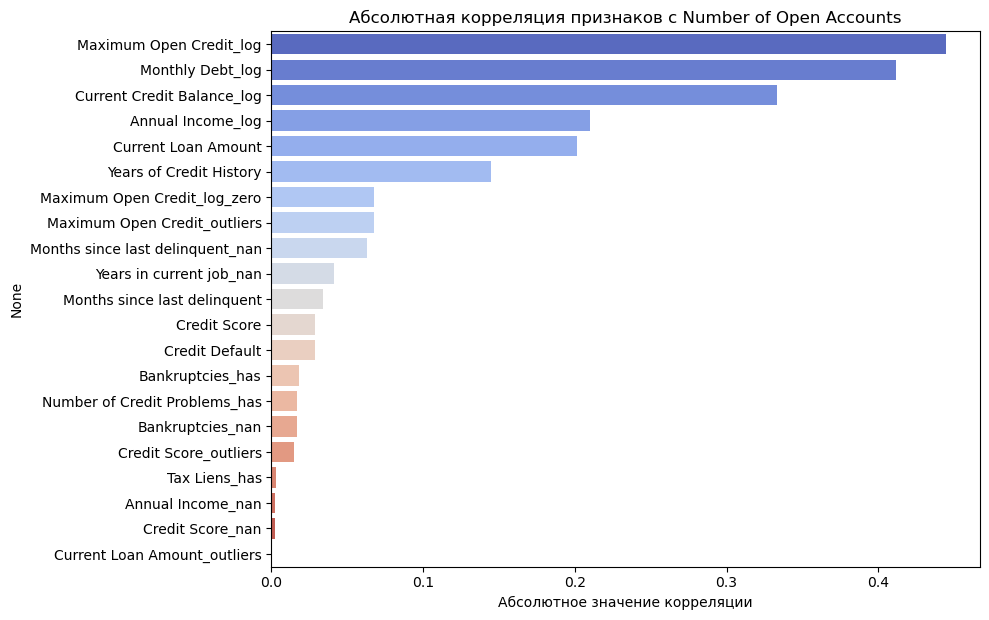

Выбросов: 15 (0.20%)


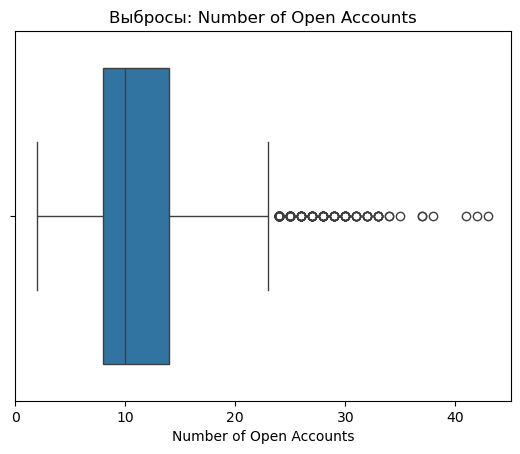

In [388]:
custom_nan_put.my.quick_analysis('Number of Open Accounts', multiplier=3.0)

Выбросов: 76 (1.01%)


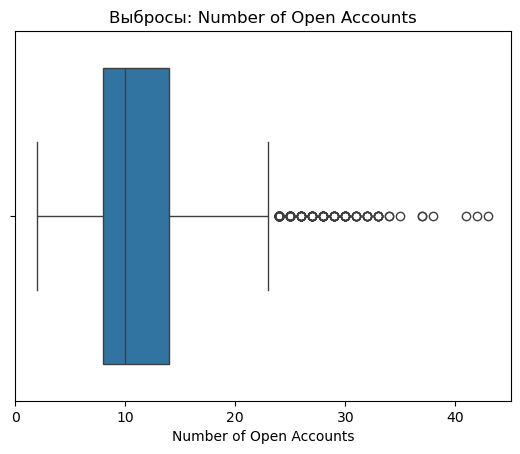

In [389]:
low, up = custom_nan_put.my._analyze_outliers('Number of Open Accounts', multiplier=2.0, return_low_up=True)

In [390]:
mask_outliers_number_of_open_acc = ~((custom_nan_put['Number of Open Accounts'] >= low) & (custom_nan_put['Number of Open Accounts'] <= up))

In [391]:
outliers = custom_nan_put[mask_outliers_number_of_open_acc]
no_outliers = custom_nan_put[~mask_outliers_number_of_open_acc]

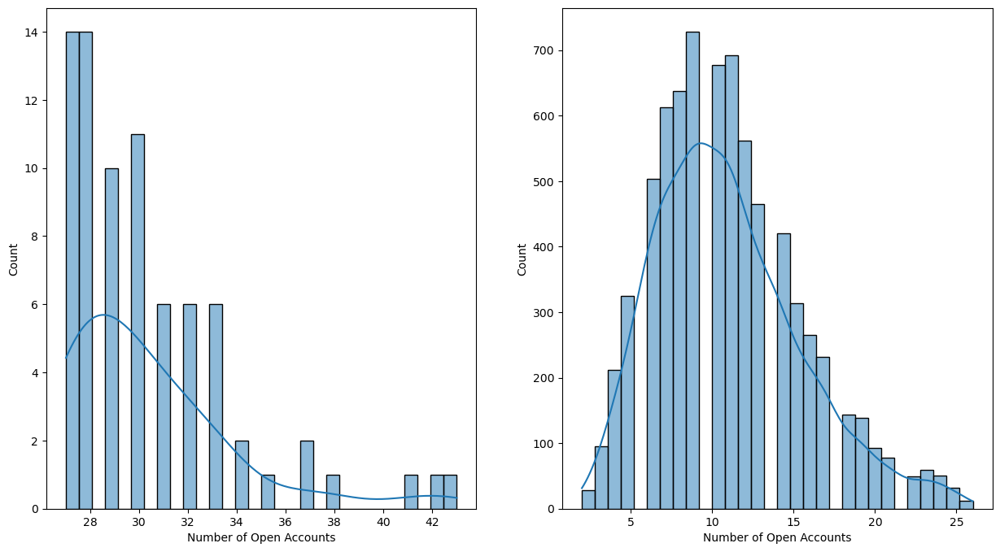

In [392]:
fast_plot_distubution_features_vs_features(outliers['Number of Open Accounts'], no_outliers['Number of Open Accounts'])

In [393]:
avr_no_outliers = no_outliers[TARGET]
avr_outliers = outliers[TARGET]

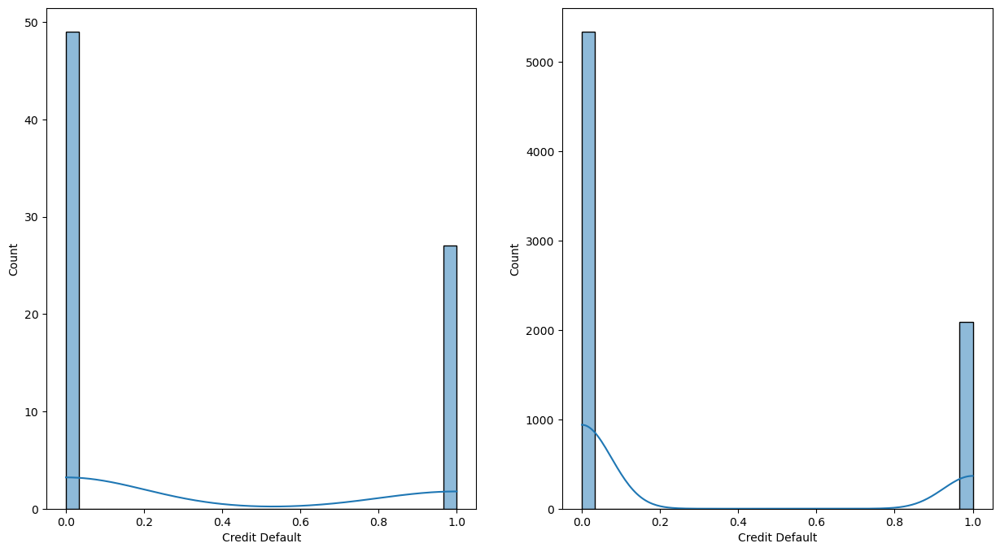

In [394]:
fast_plot_distubution_features_vs_features(avr_outliers, avr_no_outliers)

In [395]:
chi2_from_series(avr_no_outliers, avr_outliers, 
                'Без выбросов', 'С выбросами (Max Credit=0)')

Таблица сопряжённости:
χ² = 1.7007, p = 0.1922


(1.7006912986284457,
 0.19219759514335075,
                             No_Default  Default
 Без выбросов                      5338     2086
 С выбросами (Max Credit=0)          49       27)

выбросы не были статистически значимы. представим их модой

In [396]:
custom_nan_put.loc[(mask_outliers_number_of_open_acc), 'Number of Open Accounts'] = no_outliers['Number of Open Accounts'].mode()[0]

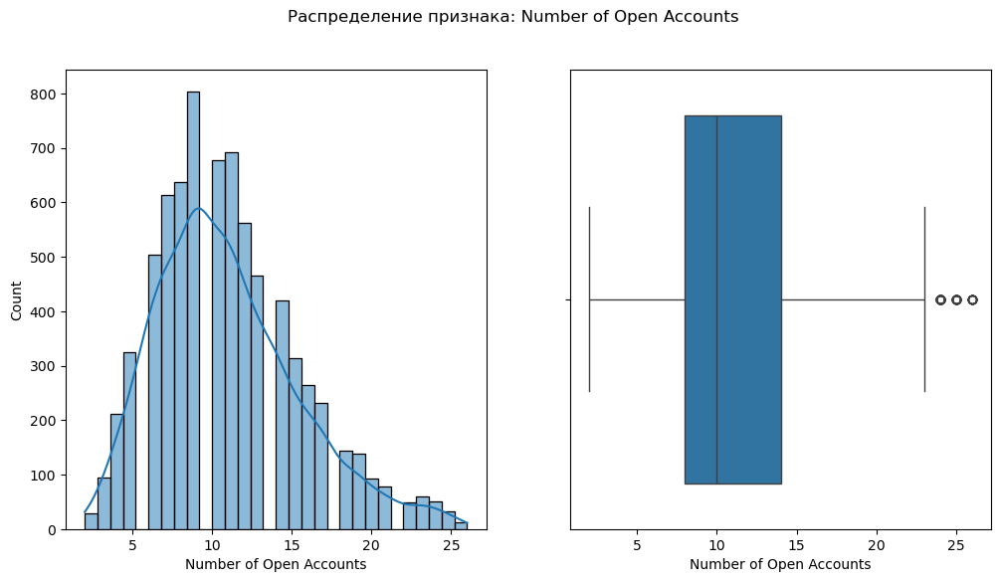

In [397]:
custom_nan_put.my._plot_distribution('Number of Open Accounts')

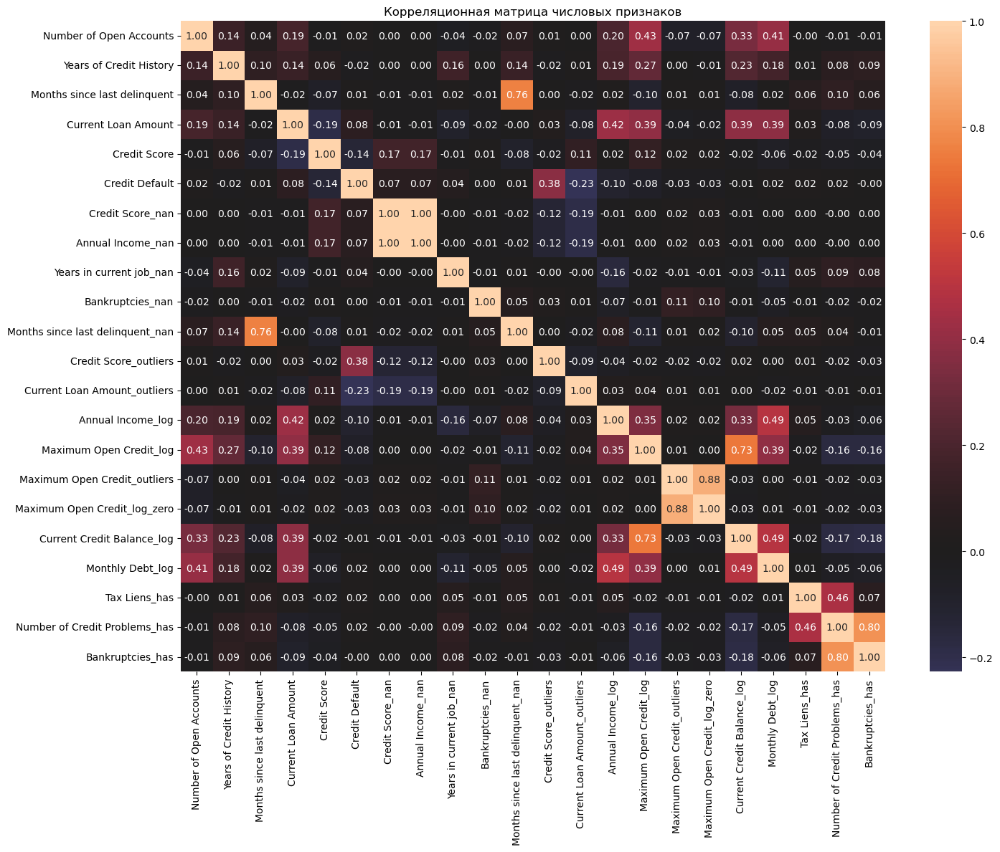

In [398]:
custom_nan_put.my._plot_heatmap_correlation()

In [399]:
analyze_metric_model(custom_nan_put)

d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


,model,f1_test,f1_train
0,LogisticRegression,0.546296,0.544183
1,DecisionTree,0.511149,0.618329
2,RandomForest,0.513258,0.544421
3,CatBoost,0.530414,0.528980
4,LightGBM,0.509091,0.848004


### Рассмотрим категориальные признаки

In [400]:
def fast_plot_categorical_distubution(this_series, figsize=(8, 5)):
    plt.figure(figsize=figsize)
    ax = this_series.value_counts().plot(kind='bar')
    plt.title(f'{this_series.name}')
    plt.ylabel('Count')
    plt.xticks(rotation=90)

    for i, v in enumerate(this_series.value_counts()):
        ax.text(i, v + 0.01 * max(this_series.value_counts()), str(v), 
                ha='center', va='bottom', fontweight='bold')


In [401]:
def fast_plot_categorical_vs_target_distrobution(this_df, this_col, target, figsize=(10, 8)):
    plt.figure(figsize=figsize)
    plot_df = this_df.groupby([this_col, target]).size().unstack()
    plot_df.plot(kind='bar', color=['red', 'blue'])


In [ ]:
def fast_plot_heatmap_chi2(this_df, this_col, target, alpha=0.05, figsize=(10, 8)):

    contingency = pd.crosstab(this_df[this_col], this_df[target])
    categories = contingency.index.tolist()
    n_categories = len(categories)
    
    pvalue_matrix = np.ones((n_categories, n_categories))
    
    for i in range(n_categories):
        for j in range(i + 1, n_categories):
            cat1 = categories[i]
            cat2 = categories[j]
            
            two_by_two = pd.DataFrame([
                contingency.loc[cat1].values,
                contingency.loc[cat2].values
            ], index=[cat1, cat2])
            
            try:
                chi2, p_value, _, _ = stats.chi2_contingency(two_by_two)
                pvalue_matrix[i, j] = p_value
                pvalue_matrix[j, i] = p_value
            except:
                pvalue_matrix[i, j] = 1.0
                pvalue_matrix[j, i] = 1.0
    
    np.fill_diagonal(pvalue_matrix, 0)
    
    pvalue_df = pd.DataFrame(pvalue_matrix, 
                            index=categories, 
                            columns=categories)
    

    plt.figure(figsize=figsize)
    
    mask = np.triu(np.ones_like(pvalue_matrix, dtype=bool))
    
    sns.heatmap(pvalue_df, 
                mask=mask,
                annot=True, 
                fmt='.3f', 
                center=alpha,
                cbar_kws={'label': 'p-value'},
                square=True)
    
    plt.title(f'Попарные сравнения категорий "{this_col}"\n'
              f'p-values хи-квадрат тестов (порог: {alpha})')
    plt.tight_layout()
    plt.show()

In [ ]:
def fast_plot_heatmap_fisher(tjis_df, this_col, target, alpha=0.05, figsize=(10,8)):

    contingency = pd.crosstab(tjis_df[this_col], tjis_df[target])
    categories = contingency.index.tolist()
    n_categories = len(categories)
    
    pvalue_matrix = np.full((n_categories, n_categories), np.nan)
    
    for i in range(n_categories):
        for j in range(i + 1, n_categories):
            cat1 = categories[i]
            cat2 = categories[j]
            
            table = np.array([contingency.loc[cat1].values, contingency.loc[cat2].values])
            
            odds_ratio, p_value = stats.fisher_exact(table)
            
            pvalue_matrix[i, j] = p_value
            pvalue_matrix[j, i] = p_value

    
    np.fill_diagonal(pvalue_matrix, 0)
    
    pvalue_df = pd.DataFrame(pvalue_matrix, 
                            index=categories, 
                            columns=categories)
    
    plt.figure(figsize=figsize)
    
    mask = np.triu(np.ones_like(pvalue_matrix, dtype=bool))
    
    sns.heatmap(pvalue_df, 
                mask=mask,
                annot=True, 
                fmt='.3f', 
                center=alpha,
                cbar_kws={'label': 'p-value'},
                square=True)

In [404]:
categ_col = custom_nan_put.select_dtypes(exclude=['number']).columns

categ_col

Index(['Home Ownership', 'Years in current job', 'Purpose', 'Term'], dtype='object')

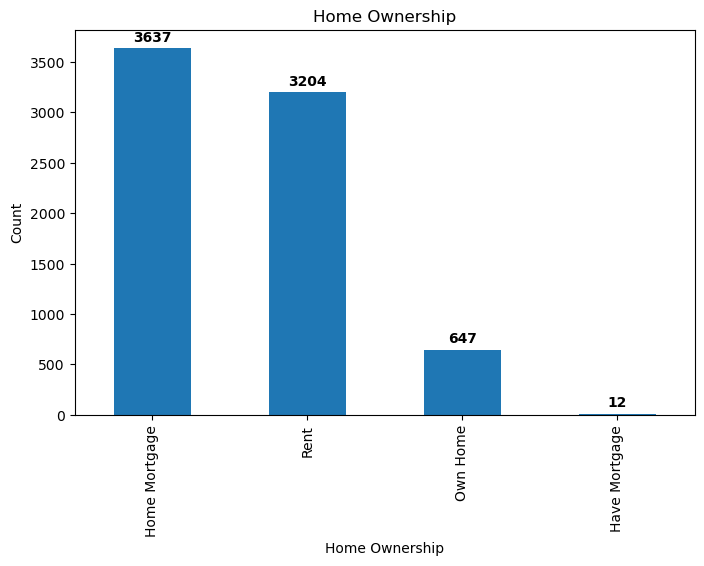

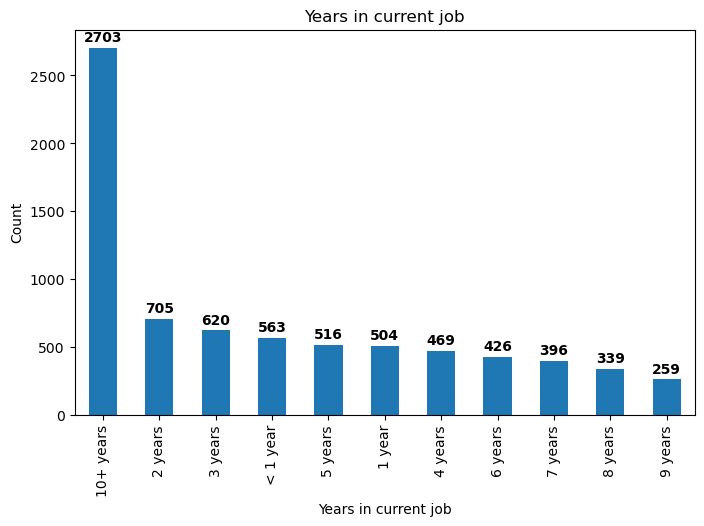

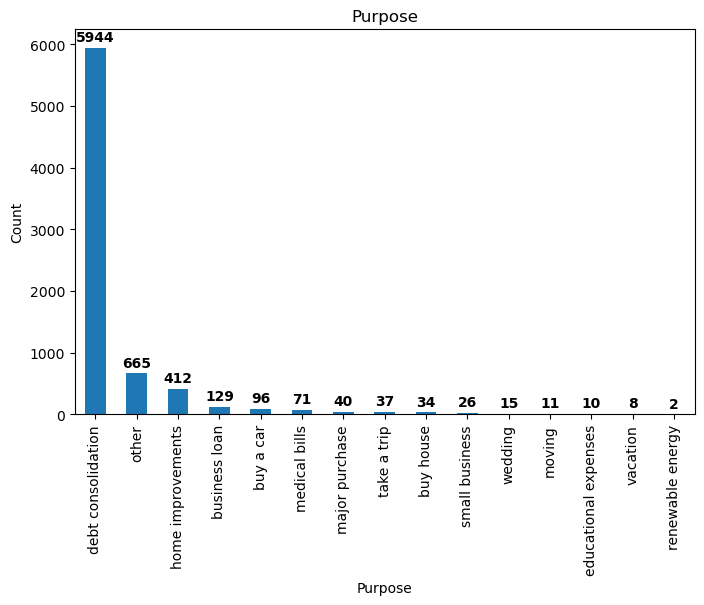

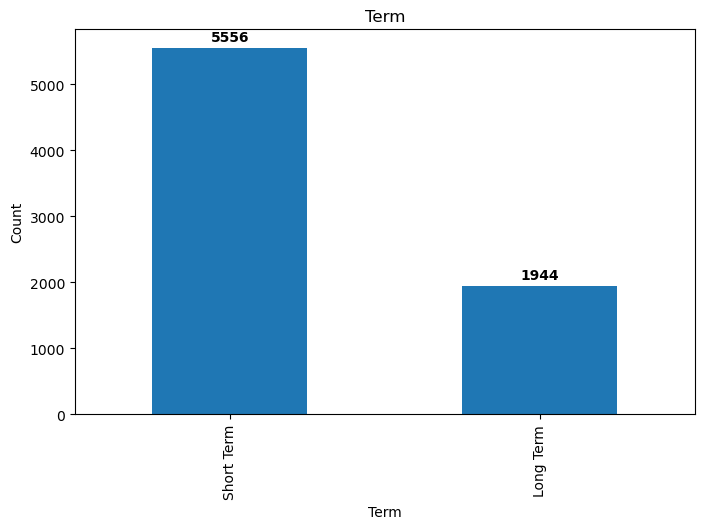

In [405]:
for col in categ_col:
    fast_plot_categorical_distubution(custom_nan_put[col])

<Figure size 1000x800 with 0 Axes>

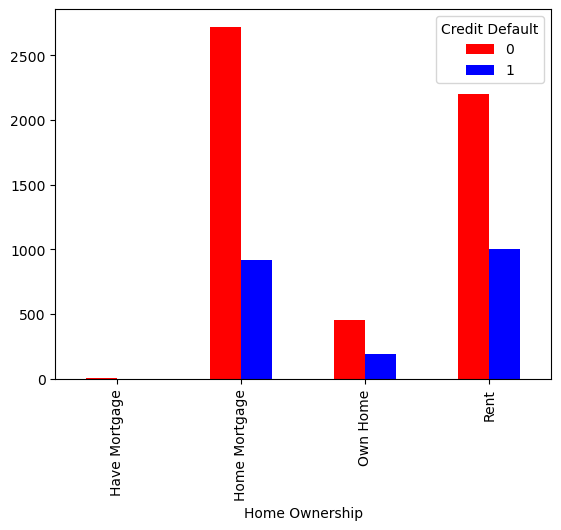

<Figure size 1000x800 with 0 Axes>

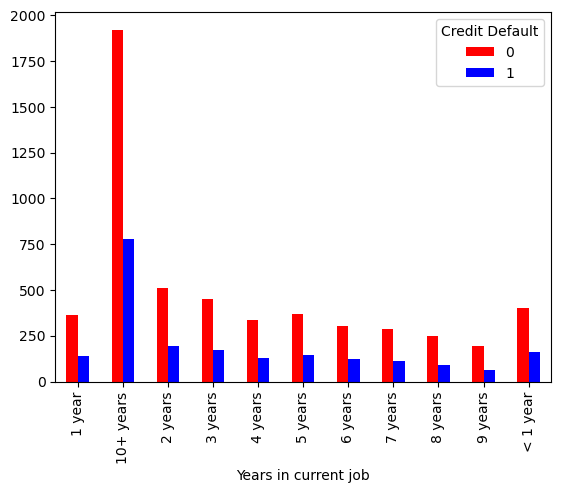

<Figure size 1000x800 with 0 Axes>

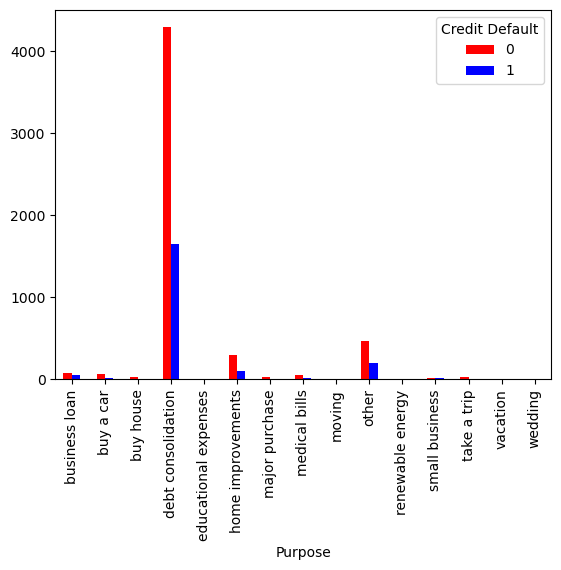

<Figure size 1000x800 with 0 Axes>

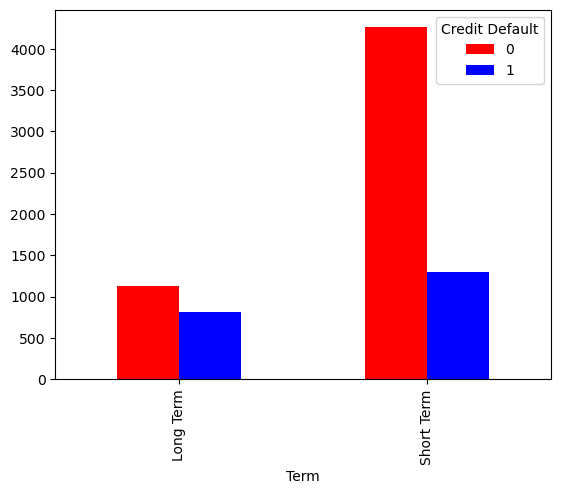

In [406]:
for col in categ_col:
    fast_plot_categorical_vs_target_distrobution(custom_nan_put, col, TARGET)

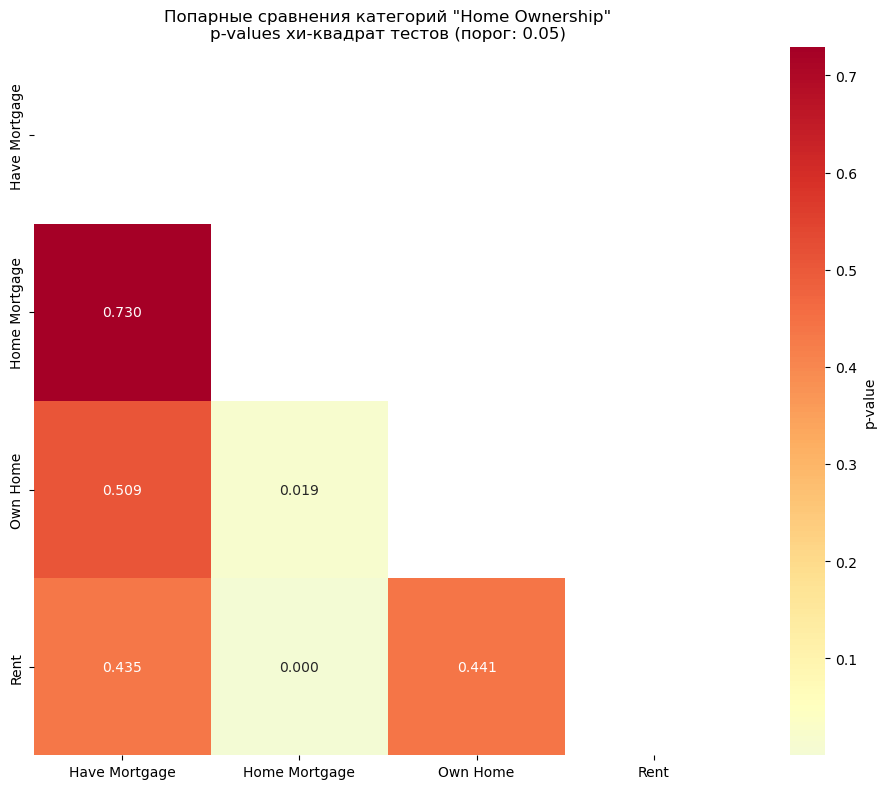

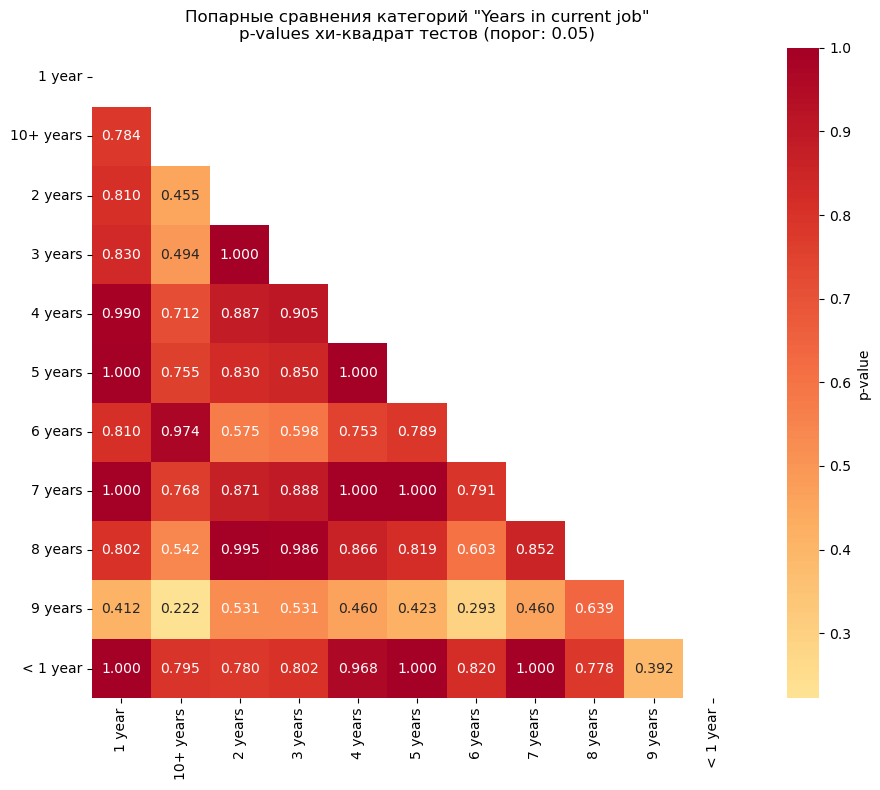

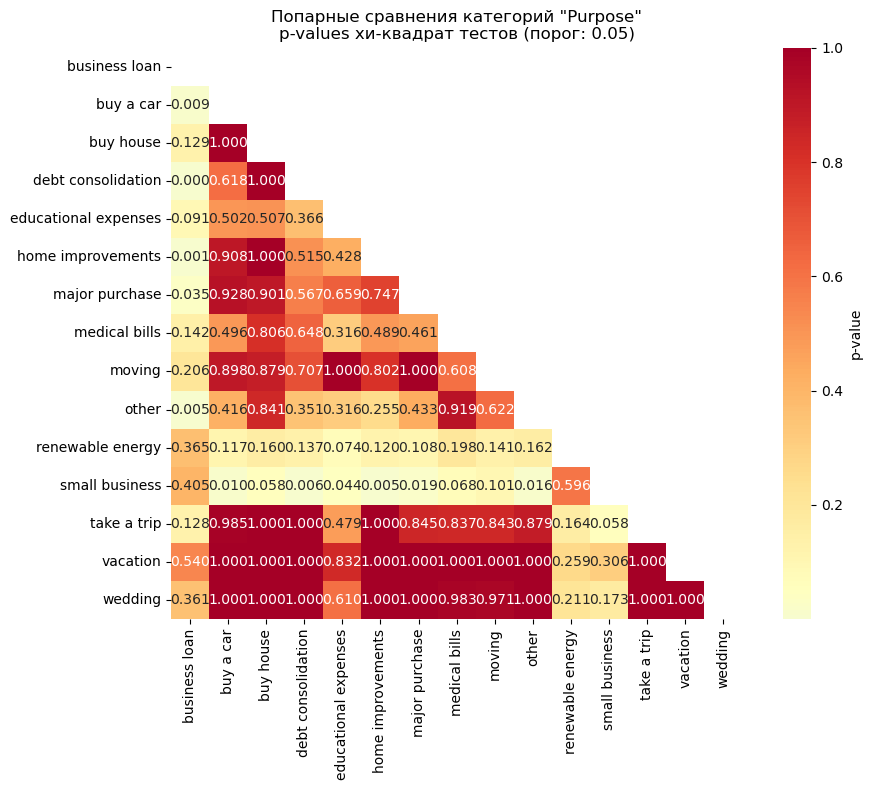

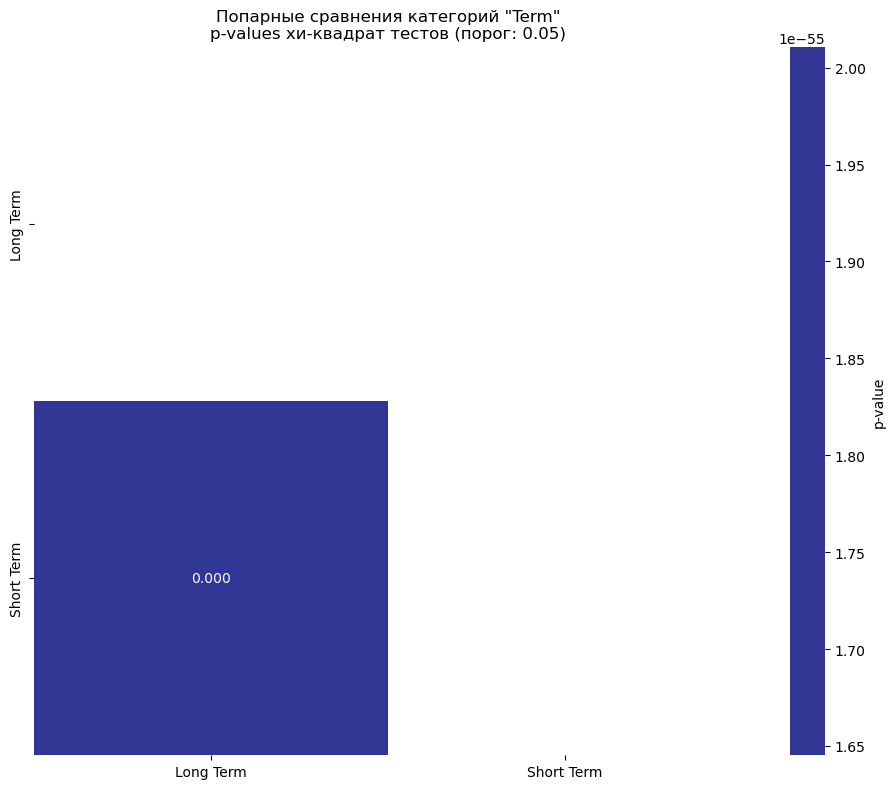

In [407]:
for col in categ_col:
    fast_plot_heatmap_chi2(custom_nan_put, col, TARGET)

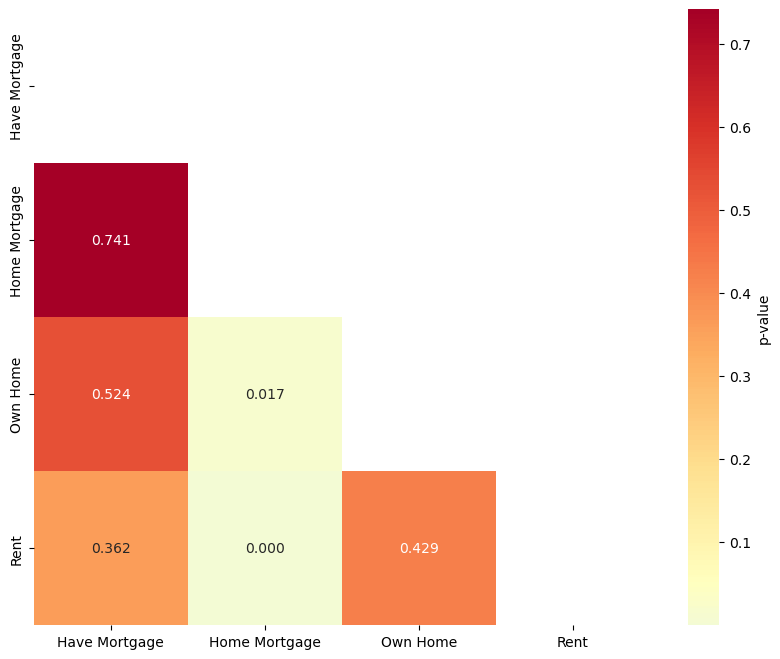

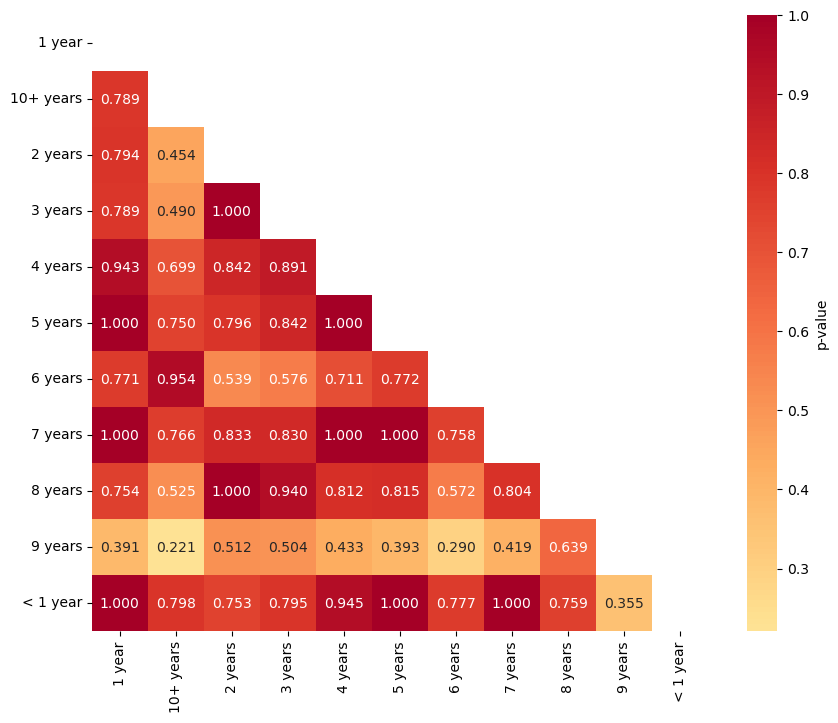

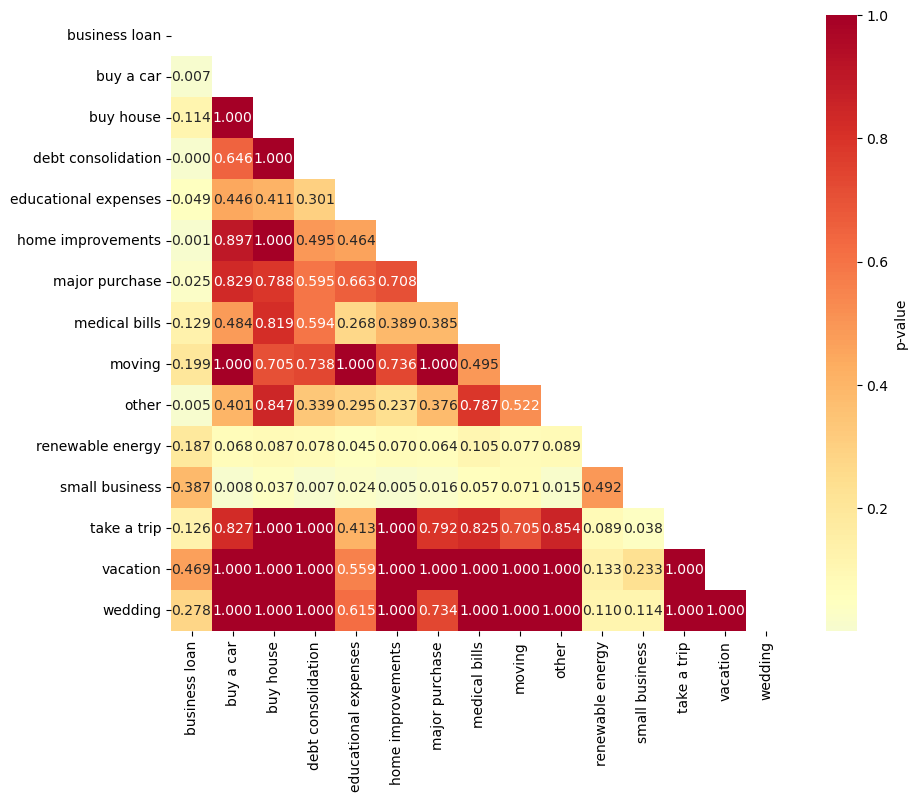

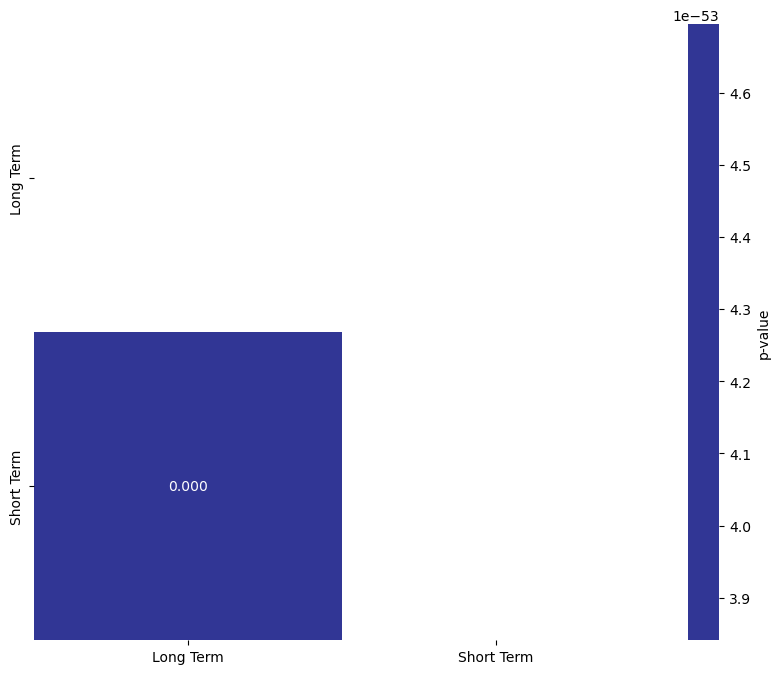

In [408]:
for col in categ_col:
    fast_plot_heatmap_fisher(custom_nan_put, col, TARGET)

In [409]:
def fast_replace(this_ser, col_to_replace, save_col):
    return this_ser.replace(col_to_replace, save_col)


In [410]:
custom_nan_put['Home Ownership'] = fast_replace(
    custom_nan_put['Home Ownership'], 
    ['Have Mortgage', 'Rent'], 
    'Home Mortgage'
    )

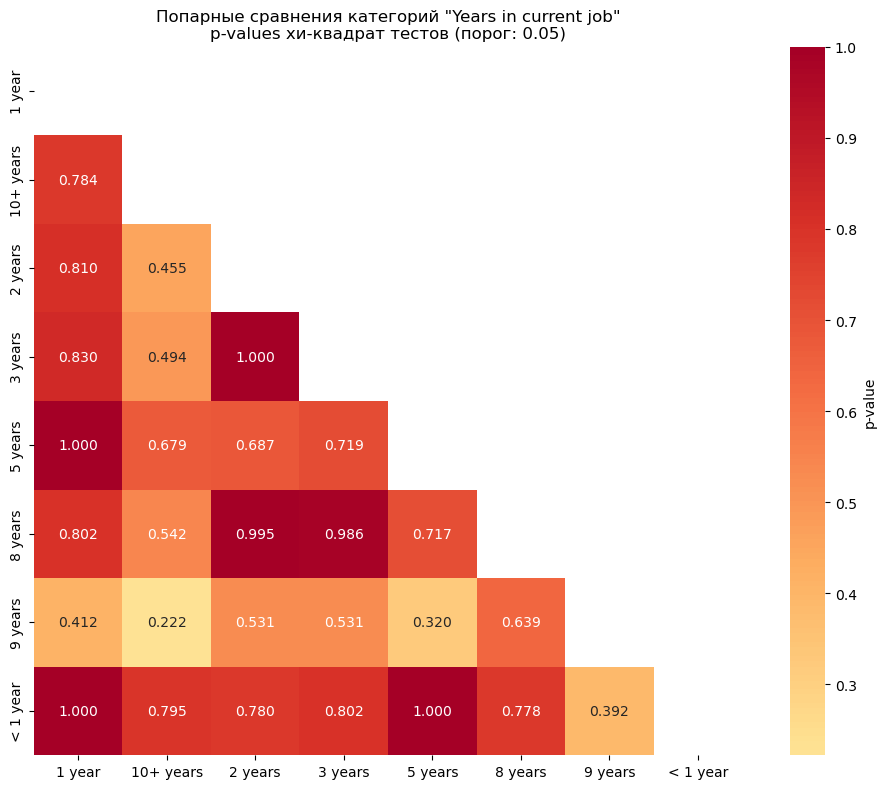

<Figure size 1000x800 with 0 Axes>

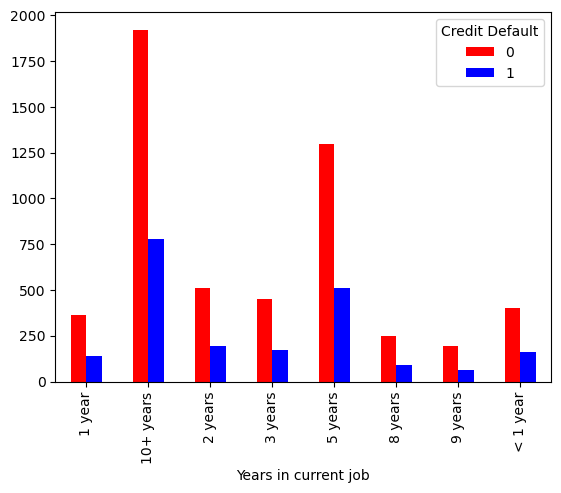

In [411]:
custom_nan_put['Years in current job'] = fast_replace(
    custom_nan_put['Years in current job'],
    ['4 years', '6 years', '7 years'],
    '5 years'
)

fast_plot_heatmap_chi2(custom_nan_put, 'Years in current job', TARGET)
fast_plot_categorical_vs_target_distrobution(custom_nan_put, 'Years in current job', TARGET)

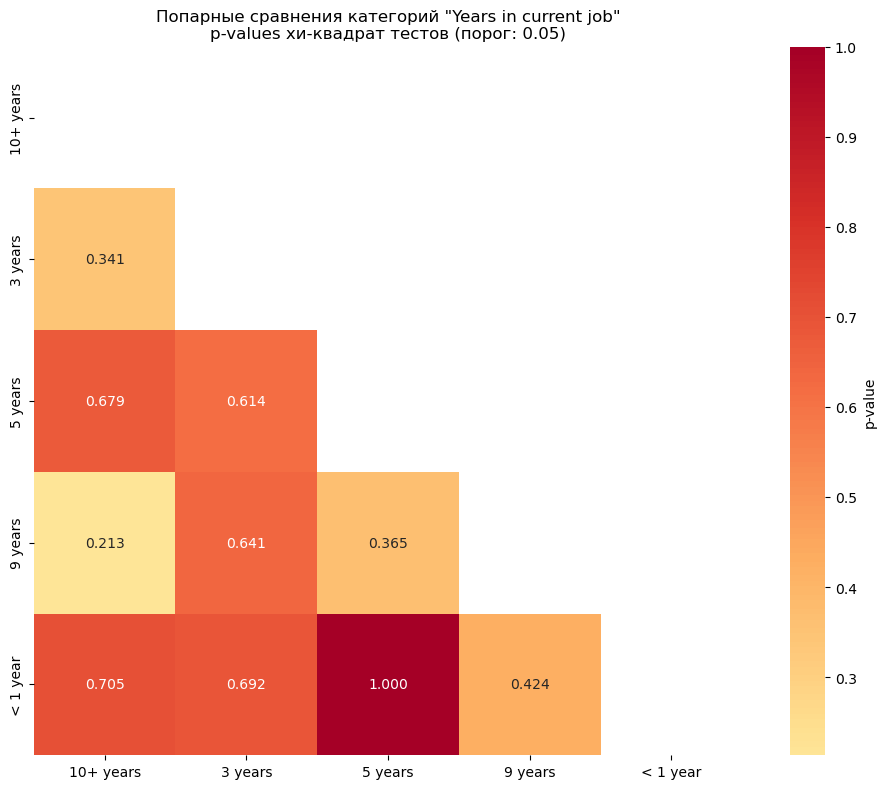

<Figure size 1000x800 with 0 Axes>

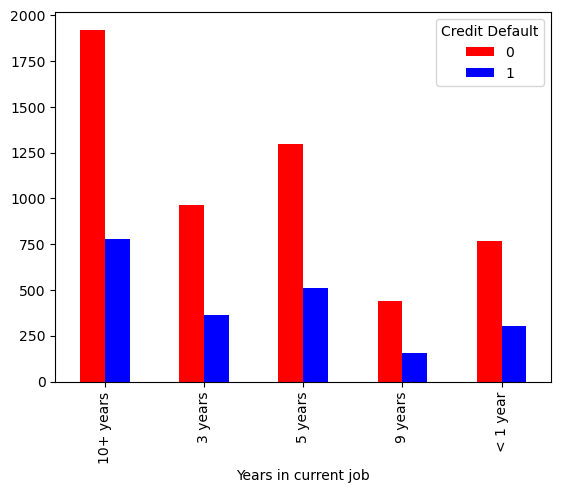

In [412]:
custom_nan_put['Years in current job'] = fast_replace(
    custom_nan_put['Years in current job'],
    ['2 years'],
    '3 years'
)

custom_nan_put['Years in current job'] = fast_replace(
    custom_nan_put['Years in current job'],
    ['1 year'],
    '< 1 year'
)

custom_nan_put['Years in current job'] = fast_replace(
    custom_nan_put['Years in current job'],
    ['8 years'],
    '9 years'
)

fast_plot_heatmap_chi2(custom_nan_put, 'Years in current job', TARGET)
fast_plot_categorical_vs_target_distrobution(custom_nan_put, 'Years in current job', TARGET)

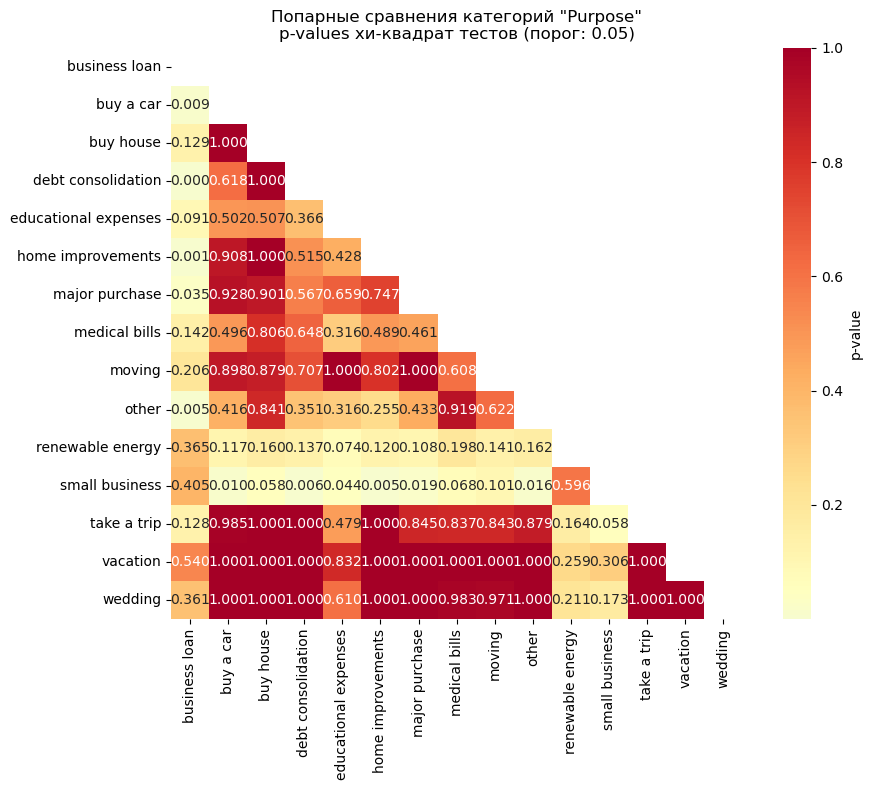

In [413]:
fast_plot_heatmap_chi2(custom_nan_put, 'Purpose', TARGET, figsize=(10, 8))

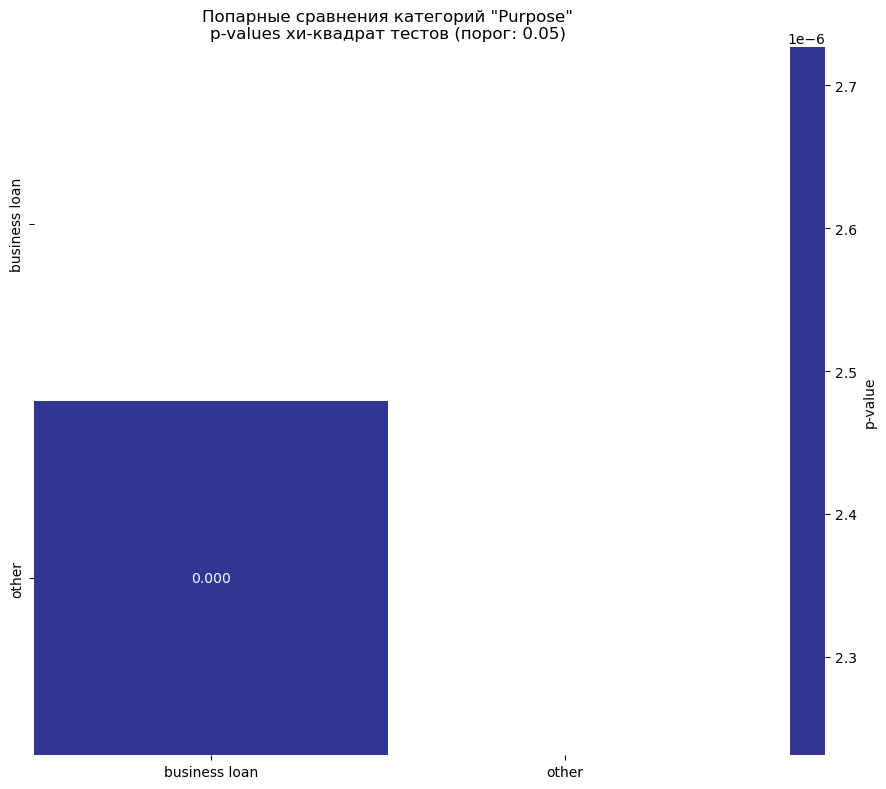

In [414]:
custom_nan_put['Purpose'] = fast_replace(
    custom_nan_put['Purpose'],
    ['wedding', 'vacation', 'take a trip', 'moving', 'major purchase', 'home improvements', 'buy house', 'educational expenses'],
    'buy a car'
)

custom_nan_put['Purpose'] = fast_replace(
    custom_nan_put['Purpose'],
    ['medical bills', 'debt consolidation', 'buy a car'],
    'other'
)

custom_nan_put['Purpose'] = fast_replace(
    custom_nan_put['Purpose'],
    ['small business', 'renewable energy'],
    'business loan'
)

custom_nan_put['Purpose'] = fast_replace(
    custom_nan_put['Purpose'],
    ['small business', 'renewable energy'],
    'business loan'
)

fast_plot_heatmap_chi2(custom_nan_put, 'Purpose', TARGET, figsize=(10, 8))

In [415]:
analyze_metric_model(custom_nan_put)

d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


,model,f1_test,f1_train
0,LogisticRegression,0.546296,0.544183
1,DecisionTree,0.511149,0.618329
2,RandomForest,0.513258,0.544421
3,CatBoost,0.530414,0.528980
4,LightGBM,0.509091,0.848004


### Рассмотрим все признаки для комбинаций

In [416]:
combined_df = custom_nan_put.copy()

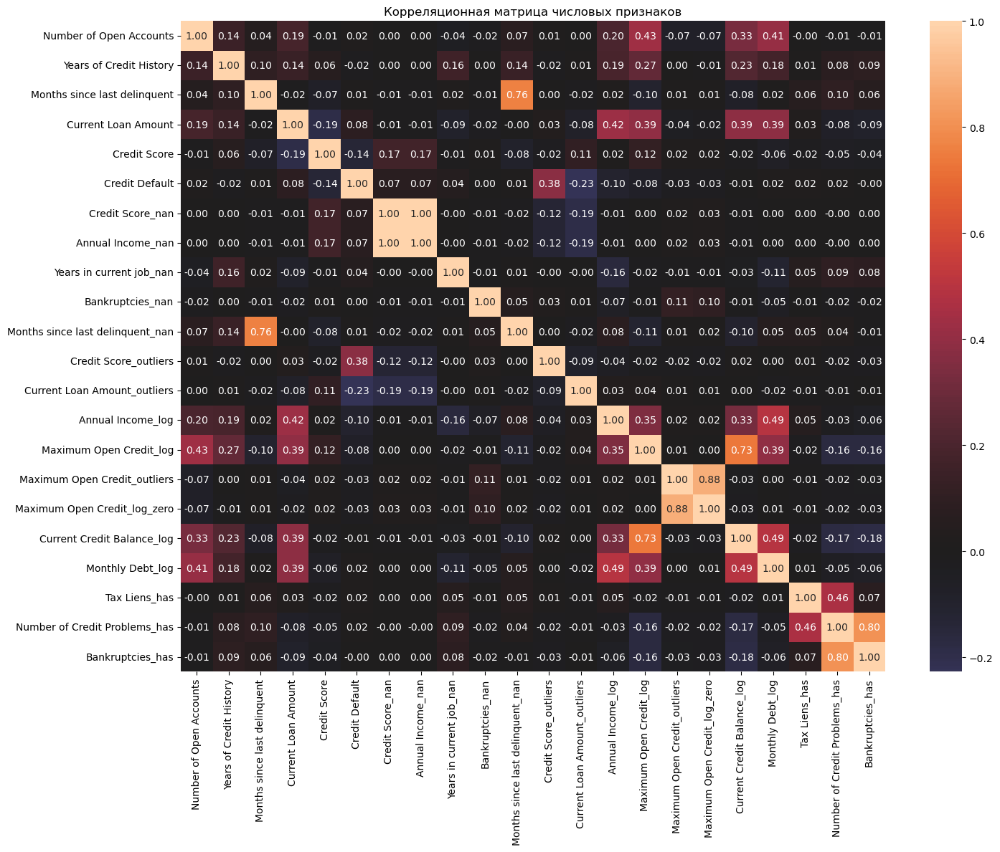

In [417]:
combined_df.my._plot_heatmap_correlation()

Объединим признак __наличие банкроства__ и __наличие крединтных проблема__

In [418]:
combined_df['Has_Bankruptcies_Credit_Problem'] = (combined_df['Bankruptcies_has'] | combined_df['Number of Credit Problems_has']).astype(int)

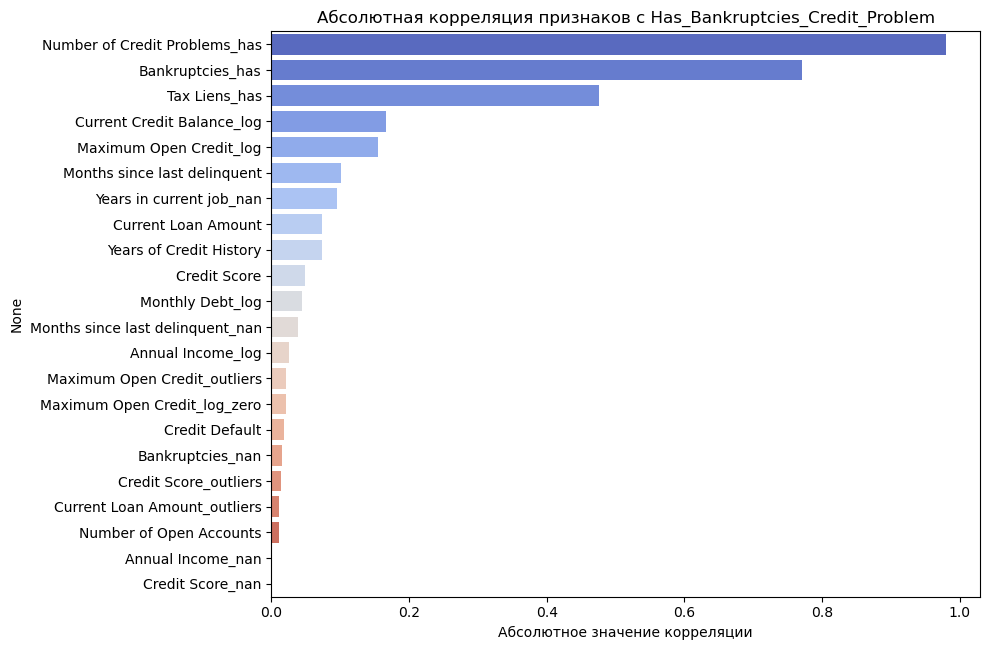

In [419]:
combined_df.my._plot_heatmap_correlation('Has_Bankruptcies_Credit_Problem')

новый признак неплохо описывает те же два признака в сочетании. удалим те, из которых он состоял

In [420]:
combined_df.drop(columns=['Bankruptcies_has', 'Number of Credit Problems_has'], axis=1, inplace=True)

попробуем объединить __текущий кредитный баланс__ и __максимальный разрешенный крединтный баланс__

In [421]:
combined_df['Credit_Ratio'] = combined_df['Current Credit Balance_log'] / combined_df['Maximum Open Credit_log']

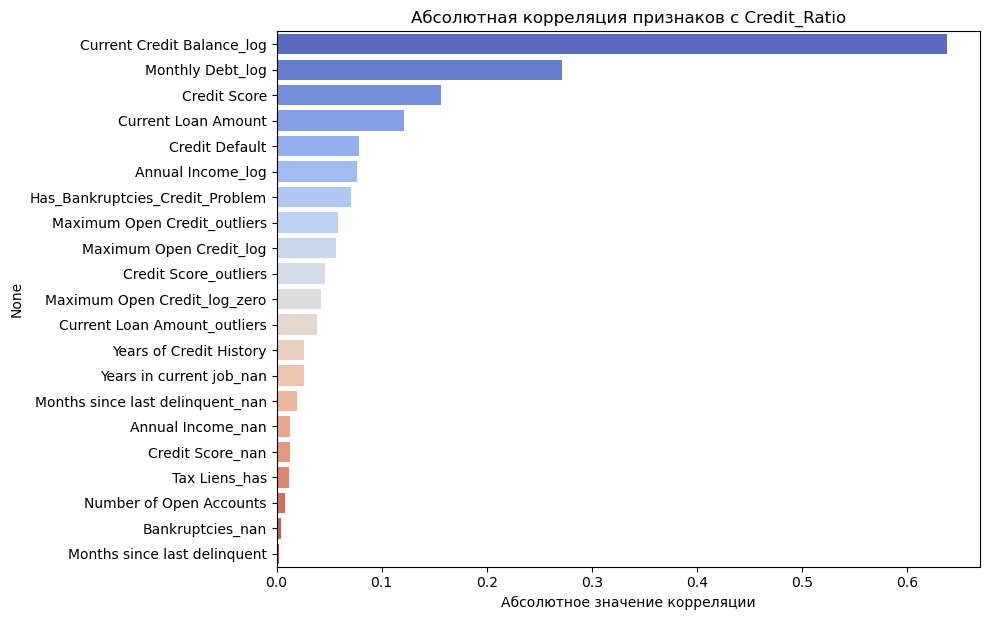

In [422]:
combined_df.my._plot_heatmap_correlation('Credit_Ratio')

отбросим Current Credit Balance_log, так как он коррелирует с новым и тем максимальным кредитным

In [423]:
combined_df.drop(columns=['Current Credit Balance_log'], axis=1, inplace=True)

после удаления метрика улучшалась, осталвяем наше решение

рассмотрим __annual_income_nan__ и __credit_score_nan__

In [424]:
combined_df['Has_nan_annual_credit_score'] = (combined_df['Annual Income_nan'] | combined_df['Credit Score_nan']).astype(int)

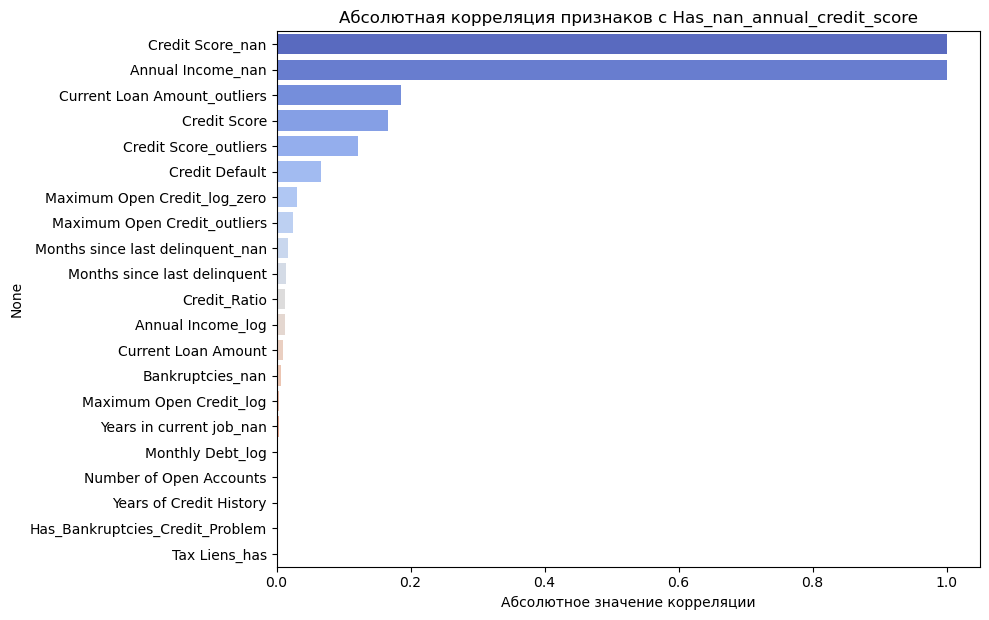

In [425]:
combined_df.my._plot_heatmap_correlation('Has_nan_annual_credit_score')

новый признак почти идельно описывает два предыдущих. удали исходные

In [426]:
combined_df.drop(columns=['Annual Income_nan', 'Credit Score_nan'], axis=1, inplace=True)

удалим __months sinse last delinquent__ так как новый признак описывающий nan дает большубю описательноть ифнормации

In [427]:
combined_df.drop(columns=['Months since last delinquent'], axis=1, inplace=True)

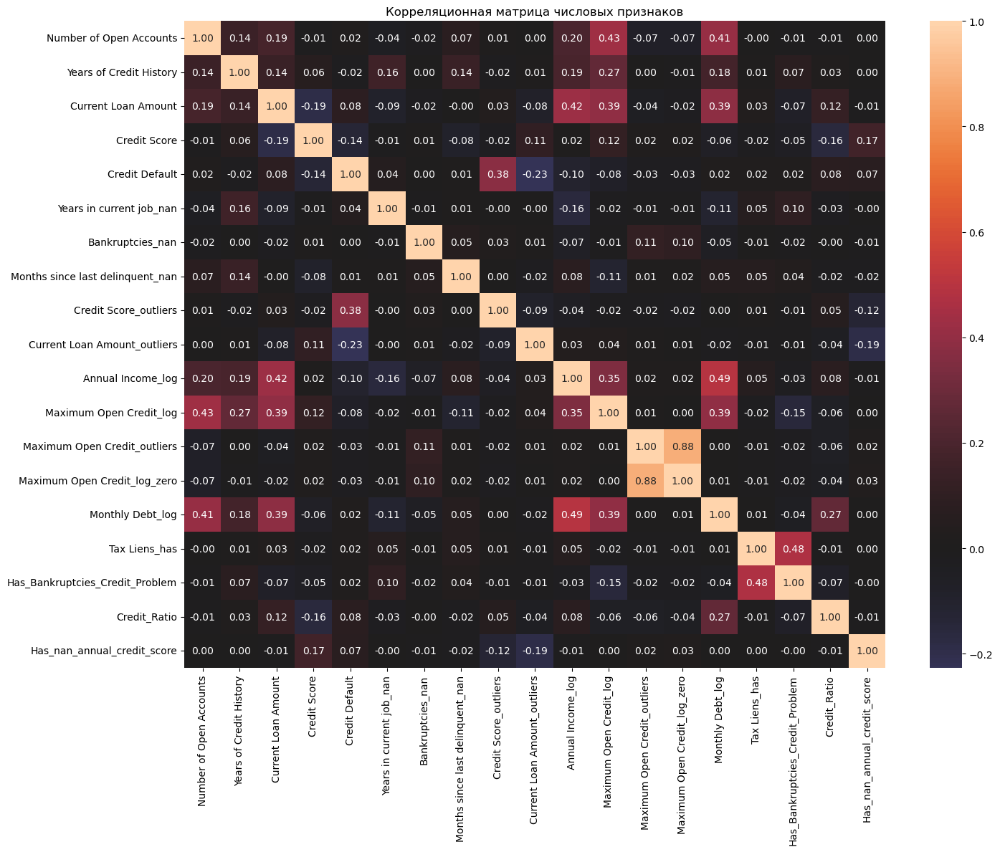

In [428]:
combined_df.my._plot_heatmap_correlation()

In [429]:
analyze_metric_model(combined_df, random_state=10)

d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


,model,f1_test,f1_train
0,LogisticRegression,0.558011,0.545540
1,DecisionTree,0.528571,0.612277
2,RandomForest,0.541978,0.544557
3,CatBoost,0.550593,0.555633
4,LightGBM,0.534611,0.844139


### финальный датасет

In [430]:
df_final = combined_df.copy()

### Создадим кастомный препроцессинговый pipeline

In [ ]:
class CustomPreprocesser(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.is_fitted_ = False

    def fit(self, X, y=None):
        return self
    
    def transform(self, X):        
        X = X.copy()
        
        if 'Credit Score' in X.columns:
            self._fix_credit_score_outliers(X)
        if 'Current Loan Amount' in X.columns:
            self._fix_current_loan_amount(X)
        if 'Annual Income' in X.columns:
            self._log_transform_and_clean(X, 'Annual Income', 'Annual Income_log')
        if 'Maximum Open Credit' in X.columns:
            self._process_maximum_open_credit(X)
        if 'Current Credit Balance' in X.columns:
            self._process_current_credit_balance(X)
        if 'Monthly Debt' in X.columns:
            self._process_monthly_debt(X)
        if 'Tax Liens' in X.columns:
            self._binarize_tax_liens(X)
        if 'Number of Credit Problems' in X.columns:
            self._categorize_credit_problems(X)
        if 'Bankruptcies' in X.columns:
            self._binarize_bankruptcies(X)
        if 'Number of Open Accounts' in X.columns:
            self._fix_open_accounts(X)

        self._process_home_ownership(X)
        self._process_years_in_current_job(X)
        self._process_purpose(X)

        self._create_combined_features(X)
        self._drop_original_features(X)

        print('Трансформация сделана')

        self.feature_names_out_ = X.columns.tolist()
        return X
    
    def _fix_credit_score_outliers(self, this_df):
        mask = this_df['Credit Score'] > 5000
        this_df['Credit Score_outliers'] = mask.astype(int)
        if mask.any():
            this_df.loc[mask, 'Credit Score'] /= 9.87842

    def _fix_current_loan_amount(self, this_df):
        q1 = this_df['Current Loan Amount'].quantile(0.25)
        q3 = this_df['Current Loan Amount'].quantile(0.75)
        iqr = q3 - q1
        lower = q1 - 3 * iqr
        upper = q3 + 3 * iqr
        mask_outliers = ~this_df['Current Loan Amount'].between(lower, upper)
        if mask_outliers.any():
            median_no_outliers = this_df.loc[~mask_outliers, 'Current Loan Amount'].median()
            this_df.loc[mask_outliers, 'Current Loan Amount'] = median_no_outliers

        this_df['Current Loan Amount_outliers'] = mask_outliers.astype(int)

    def _log_transform_and_clean(self, this_df, col, new_col):
        this_df[new_col] = np.log1p(this_df[col])
        if col in this_df.columns:
            this_df.drop(col, axis=1, inplace=True)

    def _process_maximum_open_credit(self, this_df):
        this_df['Maximum Open Credit_log'] = np.log1p(this_df['Maximum Open Credit'])
        this_df.drop('Maximum Open Credit', axis=1, inplace=True)

        q1 = this_df['Maximum Open Credit_log'].quantile(0.25)
        q3 = this_df['Maximum Open Credit_log'].quantile(0.75)
        iqr = q3 - q1
        lower = q1 - 3 * iqr
        upper = q3 + 3 * iqr
        mask_outliers = ~this_df['Maximum Open Credit_log'].between(lower, upper)

        this_df['Maximum Open Credit_log_outliers'] = mask_outliers.astype(int)

        mask_zero = this_df['Maximum Open Credit_log'] == 0
        this_df['Maximum Open Credit_log_zero'] = (mask_outliers & mask_zero).astype(int)

        median_no_outliers = this_df.loc[~mask_outliers, 'Maximum Open Credit_log'].median()
        this_df.loc[mask_outliers & mask_zero, 'Maximum Open Credit_log'] = median_no_outliers
        this_df.loc[mask_outliers & (this_df['Maximum Open Credit_log'] < lower), 'Maximum Open Credit_log'] = lower
        this_df.loc[mask_outliers & (this_df['Maximum Open Credit_log'] > upper), 'Maximum Open Credit_log'] = upper

    def _process_current_credit_balance(self, this_df):
        this_df['Current Credit Balance_log'] = np.log1p(this_df['Current Credit Balance'])
        this_df.drop('Current Credit Balance', axis=1, inplace=True)

        q1 = this_df['Current Credit Balance_log'].quantile(0.25)
        q3 = this_df['Current Credit Balance_log'].quantile(0.75)
        iqr = q3 - q1
        lower = q1 - 3 * iqr
        upper = q3 + 3 * iqr
        mask_outliers = ~this_df['Current Credit Balance_log'].between(lower, upper)

        median_no_outliers = this_df.loc[~mask_outliers, 'Current Credit Balance_log'].median()
        this_df.loc[mask_outliers, 'Current Credit Balance_log'] = median_no_outliers

    def _process_monthly_debt(self, this_df):
        this_df['Monthly Debt_log'] = np.log1p(this_df['Monthly Debt'])
        this_df.drop('Monthly Debt', axis=1, inplace=True)

        q1 = this_df['Monthly Debt_log'].quantile(0.25)
        q3 = this_df['Monthly Debt_log'].quantile(0.75)
        iqr = q3 - q1
        lower = q1 - 3 * iqr
        upper = q3 + 3 * iqr
        mask_outliers = ~this_df['Monthly Debt_log'].between(lower, upper)

        median_no_outliers = this_df.loc[~mask_outliers, 'Monthly Debt_log'].median()
        this_df.loc[mask_outliers, 'Monthly Debt_log'] = median_no_outliers

    def _binarize_tax_liens(self, this_df):
        this_df['Tax Liens_has'] = (this_df['Tax Liens'] > 0).astype(int)
        this_df.drop('Tax Liens', axis=1, inplace=True)
        
    def _categorize_credit_problems(self, this_df):
        conditions = [
            this_df['Number of Credit Problems'] == 0,
            this_df['Number of Credit Problems'] == 1,
            this_df['Number of Credit Problems'] > 1
        ]
        this_df['Number of Credit Problems_has'] = np.select(conditions, [0, 1, 2], default=0)
        this_df.drop('Number of Credit Problems', axis=1, inplace=True)

    def _binarize_bankruptcies(self, this_df):
        this_df['Bankruptcies_has'] = (this_df['Bankruptcies'] > 0).astype(int)
        this_df.drop('Bankruptcies', axis=1, inplace=True)

    def _fix_open_accounts(self, this_df):
        q1 = this_df['Number of Open Accounts'].quantile(0.25)
        q3 = this_df['Number of Open Accounts'].quantile(0.75)
        iqr = q3 - q1
        lower = q1 - 2 * iqr
        upper = q3 + 2 * iqr
        mask_outliers = ~this_df['Number of Open Accounts'].between(lower, upper)

        mode_no_outliers = this_df.loc[~mask_outliers, 'Number of Open Accounts'].mode()
        if not mode_no_outliers.empty:
            this_df.loc[mask_outliers, 'Number of Open Accounts'] = mode_no_outliers[0]

    def _create_combined_features(self, this_df):
        if 'Bankruptcies_has' in this_df.columns and 'Number of Credit Problems_has' in this_df.columns:
            this_df['Has_Bankruptcies_Credit_Problem'] = (this_df['Bankruptcies_has'] | (this_df['Number of Credit Problems_has'] > 0)).astype(int)
        if 'Current Credit Balance_log' in this_df.columns and 'Maximum Open Credit_log' in this_df.columns:
            this_df['Credit_Ratio'] = this_df['Current Credit Balance_log'] / (this_df['Maximum Open Credit_log'] + 1e-8)
        if 'Annual Income_nan' in this_df.columns and 'Credit Score_nan' in this_df.columns:
            this_df['Has_nan_annual_credit_score'] = (this_df['Annual Income_nan'] | this_df['Credit Score_nan']).astype(int)

    def _process_home_ownership(self, this_df):
        if 'Home Ownership' not in this_df.columns:
            return
        
        this_df['Home Ownership'] = this_df['Home Ownership'].replace({
            'Have Mortgage': 'Home Mortgage',
            'Rent': 'Home Mortgage'
        })

    def _process_years_in_current_job(self, this_df):
        if 'Years in current job' not in this_df.columns:
            return
        mapping = {
            '4 years': '5 years',
            '6 years': '5 years',
            '7 years': '5 years',
            '2 years': '3 years',
            '1 year': '< 1 year',
            '8 years': '9 years'
        }
        this_df['Years in current job'] = this_df['Years in current job'].replace(mapping)

    def _process_purpose(self, this_df):
        if 'Purpose' not in this_df.columns:
            return
        
        # Сначала buy a car
        to_car = [
            'wedding', 'vacation', 'take a trip', 'moving',
            'major purchase', 'home improvements', 'buy house', 'educational expenses'
        ]
        this_df['Purpose'] = this_df['Purpose'].replace(to_car, 'buy a car')

        # Затем other
        to_other = ['medical bills', 'debt consolidation', 'buy a car']
        this_df['Purpose'] = this_df['Purpose'].replace(to_other, 'other')

        # Малые категории business loan
        to_business = ['small business', 'renewable energy']
        this_df['Purpose'] = this_df['Purpose'].replace(to_business, 'business loan')

    def _drop_original_features(self, this_df):
        cols_to_drop = [
            'Bankruptcies_has',
            'Number of Credit Problems_has',
            'Current Credit Balance_log',
            'Annual Income_nan',
            'Credit Score_nan',
            'Months since last delinquent'
        ]
        for col in cols_to_drop:
            if col in this_df.columns:
                this_df.drop(col, axis=1, inplace=True)

    def get_feature_names_out(self, input_features=None):
        return self.feature_names_out_

### Создание кастомного итогово Pipeline

In [432]:
from sklearn.compose import make_column_selector

def get_final_pipeline():
    numeric_selector = make_column_selector(dtype_include=np.number)
    categorical_selector = make_column_selector(dtype_exclude=np.number)
    
    return Pipeline([
        ('imputer', CastomImputer()),
        ('preprocess', CustomPreprocesser()),
        ('column_transformer', ColumnTransformer([
            ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_selector),
            ('num', StandardScaler(), numeric_selector)
        ]))
    ])

## Обучение

In [433]:
final_pipeline = get_final_pipeline()

In [ ]:
class LearningClass():
    def __init__(self, this_df, target, this_pipe, list_models, list_params):
        self.df = this_df
        self.target = target
        self.pipeline = this_pipe

        self.list_models = list_models
        self.list_params = list_params

        self.result = []
    
    def _leraning(self, cv=5, n_iter=10, scoring='f1', test_size=0.2, random_state=42):
        self.result = []
        
        X_train, X_test, y_train, y_test = self.get_train_test_split(test_size=test_size, random_state=random_state)

        for name_model in self.list_models:
            pipe = Pipeline([
                ('pipe_temp', self.pipeline), 
                ('model', self.list_models[name_model])
                ])
            
            search = RandomizedSearchCV(
                pipe,
                {f'model__{k}': v for k, v in self.list_params[name_model].items()},
                cv=cv,
                n_iter=n_iter,
                scoring=scoring,
                random_state=random_state,
                n_jobs=-1,
                error_score='raise'
            )

            print(f"Запуск обучения для модели: {name_model}")
            search.fit(X_train, y_train)

            self.result.append({
                'model_name': name_model,
                'best_score_cv': search.best_score_,
                'best_params': search.best_params_,
                'best_estimator': search.best_estimator_,
                'train_score': f1_score(y_train, search.predict(X_train)),
                'test_score': f1_score(y_test, search.predict(X_test))
            })

        return pd.DataFrame(self.result)[['model_name', 'best_score_cv', 'test_score', 'train_score', 'best_params']]
        

    def get_train_test_split(self, test_size=0.2, random_state=42):
        this_X = self.df.drop(columns=self.target, axis=1)
        this_y = self.df[self.target]
        
        return train_test_split(
            this_X, this_y, test_size=test_size,
            random_state=random_state, stratify=this_y, shuffle=True
        )

In [ ]:
def get_models(random_state=42):
    return {
        'LogisticRegression': LogisticRegression(
            max_iter=2000,
            class_weight='balanced',
            random_state=random_state
        ),
        'DecisionTree': DecisionTreeClassifier(
            class_weight='balanced',
            random_state=random_state
        ),
        'RandomForest': RandomForestClassifier(
            class_weight='balanced',
            random_state=random_state,
            n_jobs=-1
        ),
        'CatBoost': CatBoostClassifier(
            verbose=0,
            random_state=random_state,
            auto_class_weights='Balanced',
            eval_metric='F1',
            early_stopping_rounds=50
        ),
        'XGBoost': XGBClassifier(
            objective='binary:logistic',
            eval_metric='logloss',
            use_label_encoder=False,
            random_state=random_state,
            n_jobs=-1
        ),
        'LightGBM': LGBMClassifier(
            objective='binary',
            metric='binary_logloss',
            class_weight='balanced',
            random_state=random_state,
            n_jobs=-1,
            verbose=-1
        )
    }

In [ ]:
param_grids = {
    'LogisticRegression': {
        'C': [0.001, 0.01, 0.1, 1, 10, 100],
        'solver': ['liblinear', 'saga'],
        'penalty': ['l1', 'l2']
    },
    'DecisionTree': {
        'max_depth': [3, 5, 7, 10, None],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 5],
        'max_features': ['sqrt', 'log2', None]
    },
    'RandomForest': {
        'n_estimators': [100, 200, 300],
        'max_depth': [3, 5, 7, 10],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'max_features': ['sqrt', 'log2']
    },
    'CatBoost': {
        'iterations': [300, 500, 800, 1000],
        'learning_rate': [0.01, 0.03, 0.05, 0.1],
        'depth': [4, 6, 8],
        'l2_leaf_reg': [1, 3, 5, 7],
        'border_count': [32, 64, 128]
    },
    'XGBoost': {
        'n_estimators': [200, 400, 600],
        'learning_rate': [0.01, 0.05, 0.1, 0.2],
        'max_depth': [3, 5, 7, 9],
        'subsample': [0.8, 0.9, 1.0],
        'colsample_bytree': [0.8, 0.9, 1.0],
        'gamma': [0, 0.1, 0.2],
        'reg_alpha': [0, 0.1, 1],
        'reg_lambda': [1, 2, 5]
    },
    'LightGBM': {
        'n_estimators': [200, 400, 600],
        'learning_rate': [0.01, 0.05, 0.1],
        'max_depth': [3, 5, 7, -1],
        'num_leaves': [31, 63, 127],
        'subsample': [0.8, 0.9, 1.0],
        'colsample_bytree': [0.8, 0.9, 1.0],
        'reg_alpha': [0, 0.1, 1],
        'reg_lambda': [0, 1, 5]
    }
}

In [443]:
learner = LearningClass(
    this_df=original_df,
    target=TARGET,
    this_pipe=final_pipeline,
    list_models=get_models(),
    list_params=param_grids,
)

results_df = learner._leraning(cv=10, n_iter=5, test_size=0.1, random_state=23)
print(results_df)

Запуск обучения для модели: LogisticRegression
Трансформация сделана
Трансформация сделана
Трансформация сделана
Запуск обучения для модели: DecisionTree
Трансформация сделана
Трансформация сделана
Трансформация сделана
Запуск обучения для модели: RandomForest
Трансформация сделана
Трансформация сделана
Трансформация сделана
Запуск обучения для модели: CatBoost
Трансформация сделана
Трансформация сделана
Трансформация сделана
Запуск обучения для модели: XGBoost
Трансформация сделана


d:\App\Anaconda\envs\my_env\lib\site-packages\xgboost\core.py:158: UserWarning: [20:17:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Трансформация сделана
Трансформация сделана
Запуск обучения для модели: LightGBM
Трансформация сделана
Трансформация сделана
Трансформация сделана
           model_name  best_score_cv  test_score  train_score  \
0  LogisticRegression       0.547912    0.566406     0.555412   
1        DecisionTree       0.511190    0.533333     0.511740   
2        RandomForest       0.534977    0.562212     0.671891   
3            CatBoost       0.548754    0.581028     0.597984   
4             XGBoost       0.466193    0.450142     0.996306   
5            LightGBM       0.549532    0.571429     0.604143   

                                         best_params  
0  {'model__solver': 'liblinear', 'model__penalty...  
1  {'model__min_samples_split': 10, 'model__min_s...  
2  {'model__n_estimators': 200, 'model__min_sampl...  
3  {'model__learning_rate': 0.01, 'model__l2_leaf...  
4  {'model__subsample': 0.8, 'model__reg_lambda':...  
5  {'model__subsample': 1.0, 'model__reg_lambda':...  


d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
d:\App\Anaconda\envs\my_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


In [ ]:
logreg_entry = None
for entry in learner.result:
    if entry['model_name'] == 'LogisticRegression':
        logreg_entry = entry
        break

best_model = None
best_param = None
if logreg_entry:
    best_model = logreg_entry['best_estimator']
    best_param = logreg_entry['best_params']

In [ ]:
best_model

Pipeline(steps=[('pipe_temp',
                 Pipeline(steps=[('imputer', CastomImputer()),
                                 ('preprocess', CustomPreprocesser()),
                                 ('column_transformer',
                                  ColumnTransformer(transformers=[('cat',
                                                                   OneHotEncoder(handle_unknown='ignore'),
                                                                   <sklearn.compose._column_transformer.make_column_selector object at 0x000001C33E3A5F40>),
                                                                  ('num',
                                                                   StandardScaler(),
                                                                   <sklearn.compose._column_transformer.make_column_selector object at 0x000001C33E3A5250>)]))])),
                ('model',
                 LogisticRegression(C=0.1, class_weight='balanced',
                                    max_iter=2000, random_state=42,
                                    solver='saga'))])

In [ ]:
best_param

{'model__solver': 'saga', 'model__penalty': 'l2', 'model__C': 0.1}

In [ ]:

joblib.dump(best_model, 'best_logistic_regression_pipeline.pkl')

['best_logistic_regression_pipeline.pkl']

In [16]:
test_df = pd.read_csv(URL_TEST_CSV)
test_df.columns

Index(['Home Ownership', 'Annual Income', 'Years in current job', 'Tax Liens',
       'Number of Open Accounts', 'Years of Credit History',
       'Maximum Open Credit', 'Number of Credit Problems',
       'Months since last delinquent', 'Bankruptcies', 'Purpose', 'Term',
       'Current Loan Amount', 'Current Credit Balance', 'Monthly Debt',
       'Credit Score'],
      dtype='object')

In [13]:
best_model = joblib.load('best_logistic_regression_pipeline.pkl')

In [22]:
y_pred_final = best_model.predict(test_df)

submission = pd.DataFrame({
    'Id': range(len(test_df)),
    TARGET: y_pred_final
})
submission.to_csv(OUTPUT_SUB, index=False)

Трансформация сделана
